# Capstone: Supervised Learning

## Instructions: 

First: Go out and find a dataset of interest. It could be from one of our recommended resources, some other aggregation, or scraped yourself. Just make sure it has lots of variables in it, including an outcome of interest to you.

Second: Explore the data. Get to know the data. Spend a lot of time going over its quirks and peccadilloes. You should understand how it was gathered, what's in it, and what the variables look like.

Third: Model your outcome of interest. You should try several different approaches and really work to tune a variety of models before using the model evaluation techniques to choose what you consider to be the best performer. Make sure to think about explanatory versus predictive power and experiment with both.

Please execute the three tasks above in a Jupyter notebook that you will submit to the grading team below.

Next, in order to prepare for your presentation, create a slide deck and 15 minute presentation that guides viewers through your model. Be sure to cover a few specific things:

    A specified research question your model addresses
    How you chose your model specification and what alternatives you compared it to
    The practical uses of your model for an audience of interest
    Any weak points or shortcomings of your model

This presentation is not a drill. You'll be presenting this slide deck live to a group as the culmination of all your work so far on supervised learning. As a secondary matter, your slides and the Jupyter notebook should be worthy of inclusion as examples of your work product when applying to jobs.

Supervised Learning Capstone Presentation Details:

Next, in order to prepare for your presentation, create a slide deck and 15 minute presentation that guides viewers through your model. Be sure to cover a few specific things:

    A specified research question your model addresses
    How you chose your model specification and what alternatives you compared it to
    The practical uses of your model for an audience of interest
    Any weak points or shortcomings of your model

This presentation is not a drill. You'll be presenting this slide deck live to a group as the culmination of all your work so far on supervised learning. As a secondary matter, your slides and the Jupyter notebook should be worthy of inclusion as examples of your work product when applying to jobs.

    You should have a slide deck and 15 minute presentation that guides your assessor through the different models you tried and be able to speak to the best performing model and why it’s the best performing model.

    The presentation flow should be

        A quick intro about the context/topic of the project

        Information on the data (where it came from, how it was obtained, missingness, quick stats on the data, etc)

        A specified research question your model addresses

        How you chose your model specification and what alternatives you compared it to

        The practical uses of your model for an audience of interest

        Any weak points or shortcomings of your model

    After the presentation there will be a 5-10 min Q&A where other students and mentors can ask questions about your project.  So make sure you really understand the data and modelling you used!

## Data Source and information

data source: https://healthdata.gov/dataset/hospital-readmission-reduction/resource/f3830eb1-2d22-496c-b663-46b54e175d9f

https://healthdata.gov/dataset/hospital-readmission-reduction

In October 2012, CMS began reducing Medicare payments for Inpatient Prospective Payment System hospitals with excess readmissions. Excess readmissions are measured by a ratio, by dividing a hospital’s number of “predicted” 30-day readmissions for heart attack, heart failure, and pneumonia by the number that would be “expected,” based on an average hospital with similar patients. A ratio greater than 1 indicates excess readmissions.

https://data.medicare.gov/data/hospital-compare
Hospital Compare is a consumer-oriented website that provides information on the quality of care hospitals are providing to their patients. This information can help consumers make informed decisions about health care. Hospital Compare allows consumers to select multiple hospitals and directly compare performance measure information related to heart attack, emergency department care, preventive care, stroke care, and other conditions. The Centers for Medicare & Medicaid Services (CMS) created the Hospital Compare website to better inform health care consumers about a hospital’s quality of care. Hospital Compare provides data on over 4,000 Medicare-certified hospitals, including acute care hospitals, critical access hospitals (CAHs), children’s hospitals, Veterans Health Administration (VHA) Medical Centers, and hospital outpatient departments. Hospital Compare is part of an Administration-wide effort to increase the availability and accessibility of information on quality, utilization, and costs for effective, informed decision-making. More information about Hospital Compare can be found by visiting the CMS.gov website and performing a search for Hospital Compare. To access the Hospital Compare website, please visit www.medicare.gov/hospitalcompare. 

https://www.medicare.gov/hospitalcompare/Data/Data-Updated.html#%20
measures & current data period

https://www.medicare.gov/hospitalcompare/Data/Hospital-overall-ratings-calculation.html

hospital compare overall hospital rating
n = 4,573
distribution of stars (N/A, 1-5)

The methodology uses a statistical model known as a latent variable model. Seven different latent variable models are used to calculate scores for 7 groups of measures.
Mortality
Safety of Care
Readmission
Patient Experience
Effectiveness of Care
Timeliness of Care
Efficient Use of Medical Imaging

A hospital summary score is then calculated by taking the weighted average of these group scores. If a hospital is missing a measure category or group, the weights are redistributed amongst the qualifying measure categories or groups.
Finally, the overall hospital rating is calculated using the hospital summary score.

## additional data
https://www.cdc.gov/nchs/data_access/urban_rural.htm#Data_Files_and_Documentation
https://www.cdc.gov/nchs/data/data_acces_files/NCHSURCodes2013.xlsx
https://www.cdc.gov/nchs/data/series/sr_02/sr02_166.pdf

TheNationalCenterforHealthStatistics’(NCHS)Urban–RuralClassificationSchemeforCounties
metropolitanstatisticalareas(MSAs)

For ZIP to FIP look up
https://data.world/niccolley/us-zipcode-to-county-state/workspace/file?filename=ZIP-COUNTY-FIPS_2018-03.csv

## Load data files

In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [2]:
unplan_readm_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\unplan_hosp_readm.csv')

In [3]:
readm_red_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\hosp_readm_reduct_prog.csv')

In [4]:
mort_meas_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\hosp_mortality_measures.csv')

In [5]:
hcahps_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\hcahps_ratings.csv')

In [6]:
gen_info_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\hosp_gen_info.csv')

## Cleaning data
clean data for each file individually prior to merging dataframes into one file for modeling

### reduce each file to relevant data only,  address missing values, convert to numeric, dummy categorical values

In [7]:
unplan_readm_df.head(3)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Hospital return days for heart attack patients,EDAC_30_AMI,Average Days per 100 Discharges,742,-0.8,-11.6,10.6,NaN,7/1/2015,6/30/2018
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Hospital return days for heart failure patients,EDAC_30_HF,More Days Than Average per 100 Discharges,1114,17.8,4.5,31.5,NaN,7/1/2015,6/30/2018
2,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Hospital return days for pneumonia patients,EDAC_30_PN,Average Days per 100 Discharges,604,-7.8,-21.3,6,NaN,7/1/2015,6/30/2018


In [8]:
unplan_readm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54093 entries, 0 to 54092
Data columns (total 18 columns):
Provider ID             54093 non-null object
Hospital Name           54093 non-null object
Address                 54093 non-null object
City                    54093 non-null object
State                   54093 non-null object
ZIP Code                54093 non-null int64
County Name             54093 non-null object
Phone Number            54093 non-null int64
Measure Name            54093 non-null object
Measure ID              54093 non-null object
Compared to National    54093 non-null object
Denominator             54093 non-null object
Score                   54093 non-null object
Lower Estimate          54093 non-null object
Higher Estimate         54093 non-null object
Footnote                19755 non-null object
Measure Start Date      54093 non-null object
Measure End Date        54093 non-null object
dtypes: int64(2), object(16)
memory usage: 7.4+ MB


In [9]:
#drop unnecessary columns
unplan_readm_df = unplan_readm_df.drop(['Address', 'City', 'County Name', 'Phone Number', 'Measure Name', 'Footnote', 'Measure Start Date', 'Measure End Date'], axis=1)

In [10]:
#drop all unnecessary Measure IDs, keep only HF
unplan_readm_df['Measure ID'].unique()

array(['EDAC_30_AMI', 'EDAC_30_HF', 'EDAC_30_PN', 'OP_32', 'READM_30_AMI',
       'READM_30_CABG', 'READM_30_COPD', 'READM_30_HF',
       'READM_30_HIP_KNEE', 'READM_30_HOSP_WIDE', 'READM_30_PN'],
      dtype=object)

In [11]:
#drop all but HF values
unplan_readm_df = unplan_readm_df[unplan_readm_df['Measure ID'].isin(['READM_30_HF'])] 
unplan_readm_df.head(3)

,Provider ID,Hospital Name,State,ZIP Code,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate
7,10001,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301,READM_30_HF,No Different Than the National Rate,1114,22.6,20.5,24.8
18,10005,MARSHALL MEDICAL CENTER SOUTH,AL,35957,READM_30_HF,No Different Than the National Rate,341,21.3,18.2,24.9
29,10006,NORTH ALABAMA MEDICAL CENTER,AL,35630,READM_30_HF,No Different Than the National Rate,793,20.4,18.1,22.9


In [12]:
#change name of Measure ID columns to identify the original df and measure
unplan_readm_df.rename(columns={'Measure ID':'READM_30_HF'}, inplace=True)

In [13]:
#change value of 'READM_30_HF' to numeric
unplan_readm_df.loc[unplan_readm_df.READM_30_HF == 'READM_30_HF', 'READM_30_HF'] = 1

In [14]:
#convert to numeric
cols = ['Provider ID', 'Denominator', 'Score', 'Lower Estimate', 'Higher Estimate']
unplan_readm_df[cols] = unplan_readm_df[cols].apply(pd.to_numeric, errors = 'coerce', downcast = 'float')

In [15]:
#remame columns for better identification of features after final merge
cols = unplan_readm_df.columns[unplan_readm_df.columns.isin(['Denominator','Score', 'Lower Estimate', 'Higher Estimate', 'Compared to National'])]
unplan_readm_df.rename(columns = dict(zip(cols, cols + '_30d_readm')), inplace=True)

In [16]:
unplan_readm_df['Compared to National_30d_readm'].unique()

array(['No Different Than the National Rate', 'Number of Cases Too Small',
       'Not Available', 'Worse Than the National Rate',
       'Better Than the National Rate'], dtype=object)

In [17]:
#convert each value of column to a column with bindary values for feature use
unplan_readm_df = pd.concat([unplan_readm_df, pd.get_dummies(unplan_readm_df['Compared to National_30d_readm'], prefix='comp_nat_30d_readm', drop_first=True)], axis =1)

In [18]:
#drop original column with string values
unplan_readm_df = unplan_readm_df.drop(['Compared to National_30d_readm'], axis=1)

In [19]:
unplan_readm_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4930 entries, 7 to 54089
Data columns (total 13 columns):
Provider ID                                               4758 non-null float32
Hospital Name                                             4930 non-null object
State                                                     4930 non-null object
ZIP Code                                                  4930 non-null int64
READM_30_HF                                               4930 non-null int64
Denominator_30d_readm                                     3692 non-null float32
Score_30d_readm                                           3692 non-null float32
Lower Estimate_30d_readm                                  3692 non-null float32
Higher Estimate_30d_readm                                 3692 non-null float32
comp_nat_30d_readm_No Different Than the National Rate    4930 non-null uint8
comp_nat_30d_readm_Not Available                          4930 non-null uint8
comp_nat_30d_readm_Num

In [20]:
unplan_readm_df.isnull().sum()

Provider ID                                                172
Hospital Name                                                0
State                                                        0
ZIP Code                                                     0
READM_30_HF                                                  0
Denominator_30d_readm                                     1238
Score_30d_readm                                           1238
Lower Estimate_30d_readm                                  1238
Higher Estimate_30d_readm                                 1238
comp_nat_30d_readm_No Different Than the National Rate       0
comp_nat_30d_readm_Not Available                             0
comp_nat_30d_readm_Number of Cases Too Small                 0
comp_nat_30d_readm_Worse Than the National Rate              0
dtype: int64

Plan to fill in missing continuous values with mean by hospital & READM_30_HF once datasets are merged. 

In [21]:
unplan_readm_df.head(3)

,Provider ID,Hospital Name,State,ZIP Code,READM_30_HF,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate
7,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301,1,1114.0,22.600000,20.500000,24.799999,1,0,0,0
18,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,35957,1,341.0,21.299999,18.200001,24.900000,1,0,0,0
29,10006.0,NORTH ALABAMA MEDICAL CENTER,AL,35630,1,793.0,20.400000,18.100000,22.900000,1,0,0,0


### original dataset (1) cleaning info:

**unplan_readm_df:** 

54093 entries reduced to **4930** by dropping all values except READM_30_HF values; 

measure column name = READM_30_HF, value = 1; 

'Compared to National' with 5 possible values - converted to 5 columns with 0/1 values;

missing 172 'Provider ID' - to be filled after merge; 

*1238 missing values - fill with mean by hospital & READM_30_HF* after merge.

In [22]:
readm_red_df.head()

,Hospital Name,Provider ID,State,Measure Name,Number of Discharges,Footnote,Excess Readmission Ratio,Predicted Readmission Rate,Expected Readmission Rate,Number of Readmissions,Start Date,End Date
0,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_AMI_HRRP,Not Available,1 - The number of cases/patients is too few to...,Not Available,Not Available,Not Available,Not Available,7/1/2014,6/30/2017
1,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_CABG_HRRP,Not Available,1 - The number of cases/patients is too few to...,Not Available,Not Available,Not Available,Not Available,7/1/2014,6/30/2017
2,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_COPD_HRRP,217,NaN,1.0195,20.9722,20.5712,47,7/1/2014,6/30/2017
3,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_HF_HRRP,259,NaN,1.0773,23.9788,22.2578,67,7/1/2014,6/30/2017
4,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_HIP_KNEE_HRRP,Not Available,1 - The number of cases/patients is too few to...,Not Available,Not Available,Not Available,Not Available,7/1/2014,6/30/2017


In [23]:
readm_red_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19674 entries, 0 to 19673
Data columns (total 12 columns):
Hospital Name                 19674 non-null object
Provider ID                   19674 non-null int64
State                         19674 non-null object
Measure Name                  19674 non-null object
Number of Discharges          19674 non-null object
Footnote                      8157 non-null object
Excess Readmission Ratio      19674 non-null object
Predicted Readmission Rate    19674 non-null object
Expected Readmission Rate     19674 non-null object
Number of Readmissions        19674 non-null object
Start Date                    19674 non-null object
End Date                      19674 non-null object
dtypes: int64(1), object(11)
memory usage: 1.8+ MB


In [24]:
#drop unnecessary columns
readm_red_df = readm_red_df.drop(['Footnote', 'Start Date', 'End Date'], axis=1)

In [25]:
readm_red_df['Measure Name'].unique()

array(['READM_30_AMI_HRRP', 'READM_30_CABG_HRRP', 'READM_30_COPD_HRRP',
       'READM_30_HF_HRRP', 'READM_30_HIP_KNEE_HRRP', 'READM_30_PN_HRRP'],
      dtype=object)

In [26]:
#drop all but HF values
readm_red_df = readm_red_df[readm_red_df['Measure Name'].isin(['READM_30_HF_HRRP'])] 
readm_red_df.head(3)

,Hospital Name,Provider ID,State,Measure Name,Number of Discharges,Excess Readmission Ratio,Predicted Readmission Rate,Expected Readmission Rate,Number of Readmissions
3,BYRD REGIONAL HOSPITAL,190164,LA,READM_30_HF_HRRP,259,1.0773,23.9788,22.2578,67
9,GRAND ITASCA CLINIC AND HOSPITAL,240064,MN,READM_30_HF_HRRP,75,0.9726,19.6816,20.2355,13
15,HARMON HOSPITAL,290042,NV,READM_30_HF_HRRP,Not Available,Not Available,Not Available,Not Available,Not Available


In [27]:
#change name of Measure ID columns to identify the original df and measure
readm_red_df.rename(columns={'Measure Name':'READM_30_HF_HRRP'}, inplace=True)

In [28]:
#change value of READM_30_HF_HRRP to numeric
readm_red_df.loc[readm_red_df.READM_30_HF_HRRP == 'READM_30_HF_HRRP', 'READM_30_HF_HRRP'] = 1

In [29]:
#convert columns to numeric
cols = ['Number of Discharges', 'Excess Readmission Ratio', 'Predicted Readmission Rate', 'Expected Readmission Rate', 'Number of Readmissions']
readm_red_df[cols] = readm_red_df[cols].apply(pd.to_numeric, errors = 'coerce', downcast = 'float')

### creating  additional feature = target
Excess Readmission Ratio: represents Hospital's "predicted" number of readmissions compared to CMS "expected" number of readmissions. 

Calculate the **Actual Readmission Rate** = 'actual_rrate' (number of readmissions/discharges)

Calculate the **Actual Readmission Ratio** = 'actual_rratio' ('actual_rrate'/'Expected Readmission Rate') in order to compare the Excess Readmission Ratio

target = 'actual_rratio'

In [30]:
readm_red_df['actual_rrate'] = readm_red_df['Number of Readmissions']/readm_red_df['Number of Discharges'] * 100

In [31]:
readm_red_df['actual_rratio'] = readm_red_df['actual_rrate']/readm_red_df['Expected Readmission Rate']

In [32]:
readm_red_df.isnull().sum()

Hospital Name                   0
Provider ID                     0
State                           0
READM_30_HF_HRRP                0
Number of Discharges          602
Excess Readmission Ratio      397
Predicted Readmission Rate    397
Expected Readmission Rate     397
Number of Readmissions        609
actual_rrate                  609
actual_rratio                 609
dtype: int64

Will drop records with missing 'Number of Discharges' and 'Number of Readmissions' as it will be impossible to calculate the 'actual_rratio', which is the target value for the model. 

In [33]:
#drop records with missing values; cannot calculate actual_rratio with values
readm_red_df = readm_red_df[readm_red_df['Number of Readmissions'].notnull()]

In [34]:
readm_red_df.isnull().sum()

Hospital Name                 0
Provider ID                   0
State                         0
READM_30_HF_HRRP              0
Number of Discharges          0
Excess Readmission Ratio      0
Predicted Readmission Rate    0
Expected Readmission Rate     0
Number of Readmissions        0
actual_rrate                  0
actual_rratio                 0
dtype: int64

In [35]:
#add suffix to column names for identification purposes
cols = readm_red_df.columns[readm_red_df.columns.isin(['Number of Discharges','Excess Readmission Ratio', 
                                                       'Predicted Readmission Rate', 'Expected Readmission Rate', 
                                                       'Number of Readmissions', 'actual_rrate', 'actual_rratio'])]
readm_red_df.rename(columns = dict(zip(cols, cols + '_30d_HRRP')), inplace=True)

In [36]:
readm_red_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2670 entries, 3 to 19671
Data columns (total 11 columns):
Hospital Name                          2670 non-null object
Provider ID                            2670 non-null int64
State                                  2670 non-null object
READM_30_HF_HRRP                       2670 non-null int64
Number of Discharges_30d_HRRP          2670 non-null float32
Excess Readmission Ratio_30d_HRRP      2670 non-null float32
Predicted Readmission Rate_30d_HRRP    2670 non-null float32
Expected Readmission Rate_30d_HRRP     2670 non-null float32
Number of Readmissions_30d_HRRP        2670 non-null float32
actual_rrate_30d_HRRP                  2670 non-null float32
actual_rratio_30d_HRRP                 2670 non-null float32
dtypes: float32(7), int64(2), object(2)
memory usage: 177.3+ KB


In [37]:
readm_red_df.head(3)

,Hospital Name,Provider ID,State,READM_30_HF_HRRP,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP
3,BYRD REGIONAL HOSPITAL,190164,LA,1,259.0,1.0773,23.978800,22.257799,67.0,25.868725,1.162232
9,GRAND ITASCA CLINIC AND HOSPITAL,240064,MN,1,75.0,0.9726,19.681601,20.235500,13.0,17.333334,0.856580
21,CHESHIRE MEDICAL CENTER,300019,NH,1,303.0,0.9514,19.854500,20.869600,57.0,18.811882,0.901401


### original dataset (2) info:

**readm_red_df:** 

19674 entries reduced to **2670** by dropping all values except READM_30_HF_HRRP values; 

measure column name = READM_30_HF_HRRP, value = 1; 

**created additional feature 'actual_rratio' = target value for model**; 

*602 missing values for 'Number of Discharges' and 'Number of Readmissions' - dropped as it will be impossible to calculate the 'actual_rratio', which is the target value*. 


In [38]:
mort_meas_df.head(3)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Rate of complications for hip/knee replacement...,COMP_HIP_KNEE,No Different Than the National Rate,292,3.2,2.1,4.8,NaN,4/1/2015,3/31/2018
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Death rate for heart attack patients,MORT_30_AMI,No Different Than the National Rate,688,13,11,15.5,NaN,7/1/2015,6/30/2018
2,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Death rate for CABG surgery patients,MORT_30_CABG,No Different Than the National Rate,291,4.3,2.6,6.8,NaN,7/1/2015,6/30/2018


In [39]:
mort_meas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91889 entries, 0 to 91888
Data columns (total 18 columns):
Provider ID             91889 non-null object
Hospital Name           91889 non-null object
Address                 91889 non-null object
City                    91889 non-null object
State                   91889 non-null object
ZIP Code                91889 non-null int64
County Name             91889 non-null object
Phone Number            91889 non-null int64
Measure Name            91889 non-null object
Measure ID              91889 non-null object
Compared to National    91889 non-null object
Denominator             91889 non-null object
Score                   91889 non-null object
Lower Estimate          91889 non-null object
Higher Estimate         91889 non-null object
Footnote                37628 non-null object
Measure Start Date      91889 non-null object
Measure End Date        91889 non-null object
dtypes: int64(2), object(16)
memory usage: 12.6+ MB


In [40]:
#drop unnecessary columns
mort_meas_df = mort_meas_df.drop(['Address', 'City', 'County Name', 'Phone Number', 'Measure Name', 'Footnote', 'Measure Start Date', 'Measure End Date'], axis=1)

In [41]:
mort_meas_df['Measure ID'].unique()

array(['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD',
       'MORT_30_HF', 'MORT_30_PN', 'MORT_30_STK', 'PSI_10_POST_KIDNEY',
       'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT',
       'PSI_13_POST_SEPSIS', 'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC',
       'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
       'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM'], dtype=object)

In [42]:
#drop all but HF values
mort_meas_df = mort_meas_df[mort_meas_df['Measure ID'].isin(['MORT_30_HF'])] 
mort_meas_df.head(3)

,Provider ID,Hospital Name,State,ZIP Code,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate
4,10001,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301,MORT_30_HF,No Different Than the National Rate,869,12.7,10.7,15
23,10005,MARSHALL MEDICAL CENTER SOUTH,AL,35957,MORT_30_HF,No Different Than the National Rate,318,14.4,11.4,17.9
42,10006,NORTH ALABAMA MEDICAL CENTER,AL,35630,MORT_30_HF,No Different Than the National Rate,671,12.9,10.6,15.4


In [43]:
#change name of Measure ID columns to identify the original df and measure
mort_meas_df.rename(columns={'Measure ID':'MORT_30_HF'}, inplace=True)

In [44]:
#change value of MORT_30_HF to numeric
mort_meas_df.loc[mort_meas_df.MORT_30_HF == 'MORT_30_HF', 'MORT_30_HF'] = 1

In [45]:
#convert to numeric
cols = ['Provider ID', 'Denominator', 'Score', 'Lower Estimate', 'Higher Estimate']
mort_meas_df[cols] = mort_meas_df[cols].apply(pd.to_numeric, errors = 'coerce', downcast = 'float')

In [46]:
mort_meas_df['Compared to National'].unique()

array(['No Different Than the National Rate', 'Not Available',
       'Number of Cases Too Small', 'Better Than the National Rate',
       'Worse Than the National Rate'], dtype=object)

In [47]:
#convert each value of column to a column with bindary values for feature use
mort_meas_df = pd.concat([mort_meas_df, pd.get_dummies(mort_meas_df['Compared to National'], prefix='nat_comp_30d_mort', drop_first=True)], axis =1)

In [48]:
#drop original column with string values
mort_meas_df = mort_meas_df.drop(['Compared to National'], axis=1)

In [49]:
#change names of columns for identification of features after merge
cols = mort_meas_df.columns[mort_meas_df.columns.isin(['Denominator','Score', 'Lower Estimate', 'Higher Estimate'])]
mort_meas_df.rename(columns = dict(zip(cols, cols + '_30d_mort')), inplace=True)

In [50]:
mort_meas_df.isnull().sum()

Provider ID                                               172
Hospital Name                                               0
State                                                       0
ZIP Code                                                    0
MORT_30_HF                                                  0
Denominator_30d_mort                                     1313
Score_30d_mort                                           1313
Lower Estimate_30d_mort                                  1313
Higher Estimate_30d_mort                                 1313
nat_comp_30d_mort_No Different Than the National Rate       0
nat_comp_30d_mort_Not Available                             0
nat_comp_30d_mort_Number of Cases Too Small                 0
nat_comp_30d_mort_Worse Than the National Rate              0
dtype: int64

Plan to fill in missing continuous values with mean by hospital & MORT_30_HF once datasets are merged. 

In [51]:
mort_meas_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4930 entries, 4 to 91874
Data columns (total 13 columns):
Provider ID                                              4758 non-null float32
Hospital Name                                            4930 non-null object
State                                                    4930 non-null object
ZIP Code                                                 4930 non-null int64
MORT_30_HF                                               4930 non-null int64
Denominator_30d_mort                                     3617 non-null float32
Score_30d_mort                                           3617 non-null float32
Lower Estimate_30d_mort                                  3617 non-null float32
Higher Estimate_30d_mort                                 3617 non-null float32
nat_comp_30d_mort_No Different Than the National Rate    4930 non-null uint8
nat_comp_30d_mort_Not Available                          4930 non-null uint8
nat_comp_30d_mort_Number of Cases

In [52]:
mort_meas_df.head(3)

,Provider ID,Hospital Name,State,ZIP Code,MORT_30_HF,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,nat_comp_30d_mort_No Different Than the National Rate,nat_comp_30d_mort_Not Available,nat_comp_30d_mort_Number of Cases Too Small,nat_comp_30d_mort_Worse Than the National Rate
4,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301,1,869.0,12.7,10.7,15.0,1,0,0,0
23,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,35957,1,318.0,14.4,11.4,17.9,1,0,0,0
42,10006.0,NORTH ALABAMA MEDICAL CENTER,AL,35630,1,671.0,12.9,10.6,15.4,1,0,0,0


### original dataset (3) info:

**mort_meas_df:** 91889 entries reduced to **4930** by dropping all except MORT_30_HF;

measure column name =  MORT_30_HF, value = 1;

'Compared to National' with 5 possible values - converted to 5 columns with 0/1 values;

*missing 172 'Provider ID', missing 1331 each of Denominator, Score, Lower Estimate, and Higher Estimate - fill after merge with mean by hospital if available*; 

In [53]:
hcahps_df.head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,HCAHPS Measure ID,HCAHPS Question,...,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...",...,NaN,72,NaN,Not Applicable,526,NaN,21,NaN,10/1/2017,9/30/2018
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...",...,NaN,9,NaN,Not Applicable,526,NaN,21,NaN,10/1/2017,9/30/2018
2,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...",...,NaN,19,NaN,Not Applicable,526,NaN,21,NaN,10/1/2017,9/30/2018
3,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,...,NaN,Not Applicable,NaN,87,526,NaN,21,NaN,10/1/2017,9/30/2018
4,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_COMP_1_STAR_RATING,Nurse communication - star rating,...,NaN,Not Applicable,NaN,Not Applicable,526,NaN,21,NaN,10/1/2017,9/30/2018


In [54]:
hcahps_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455235 entries, 0 to 455234
Data columns (total 22 columns):
Provider ID                              455235 non-null object
Hospital Name                            455235 non-null object
Address                                  455235 non-null object
City                                     455235 non-null object
State                                    455235 non-null object
ZIP Code                                 455235 non-null int64
County Name                              455235 non-null object
Phone Number                             455235 non-null int64
HCAHPS Measure ID                        455235 non-null object
HCAHPS Question                          455235 non-null object
HCAHPS Answer Description                455235 non-null object
Patient Survey Star Rating               455235 non-null object
Patient Survey Star Rating Footnote      15103 non-null object
HCAHPS Answer Percent                    455235 non-null obj

In [55]:
#drop unnecessaryy columns
hcahps_df = hcahps_df.drop(['Address', 'City', 'County Name', 'Phone Number', 
                            'HCAHPS Answer Percent Footnote','Patient Survey Star Rating Footnote', 
                            'Number of Completed Surveys Footnote', 'Survey Response Rate Percent Footnote', 
                            'Measure Start Date', 'Measure End Date', 'HCAHPS Question', 'HCAHPS Answer Percent', 
                            'Survey Response Rate Percent', 'Number of Completed Surveys'], axis=1)

#### unable to use dataset without significant wrangling due to current structure; 
will use only patient star rating and HCAHPS linear mean value as features at this time

In [56]:
#convert to numeric
cols = ['Patient Survey Star Rating', 'HCAHPS Linear Mean Value']
hcahps_df[cols] = hcahps_df[cols].apply(pd.to_numeric, errors = 'coerce', downcast = 'float')

In [57]:
hcahps_df['HCAHPS Measure ID'].unique()

array(['H_COMP_1_A_P', 'H_COMP_1_SN_P', 'H_COMP_1_U_P',
       'H_COMP_1_LINEAR_SCORE', 'H_COMP_1_STAR_RATING',
       'H_NURSE_RESPECT_A_P', 'H_NURSE_RESPECT_SN_P',
       'H_NURSE_RESPECT_U_P', 'H_NURSE_LISTEN_A_P', 'H_NURSE_LISTEN_SN_P',
       'H_NURSE_LISTEN_U_P', 'H_NURSE_EXPLAIN_A_P',
       'H_NURSE_EXPLAIN_SN_P', 'H_NURSE_EXPLAIN_U_P', 'H_COMP_2_A_P',
       'H_COMP_2_SN_P', 'H_COMP_2_U_P', 'H_COMP_2_LINEAR_SCORE',
       'H_COMP_2_STAR_RATING', 'H_DOCTOR_RESPECT_A_P',
       'H_DOCTOR_RESPECT_SN_P', 'H_DOCTOR_RESPECT_U_P',
       'H_DOCTOR_LISTEN_A_P', 'H_DOCTOR_LISTEN_SN_P',
       'H_DOCTOR_LISTEN_U_P', 'H_DOCTOR_EXPLAIN_A_P',
       'H_DOCTOR_EXPLAIN_SN_P', 'H_DOCTOR_EXPLAIN_U_P', 'H_COMP_3_A_P',
       'H_COMP_3_SN_P', 'H_COMP_3_U_P', 'H_COMP_3_LINEAR_SCORE',
       'H_COMP_3_STAR_RATING', 'H_CALL_BUTTON_A_P', 'H_CALL_BUTTON_SN_P',
       'H_CALL_BUTTON_U_P', 'H_BATH_HELP_A_P', 'H_BATH_HELP_SN_P',
       'H_BATH_HELP_U_P', 'H_COMP_5_A_P', 'H_COMP_5_SN_P', 'H_COMP_5_U_P',


In [58]:
#select only likely correlated values
hcahps_df = hcahps_df[hcahps_df['HCAHPS Measure ID'].isin(['H_COMP_1_LINEAR_SCORE', 'H_COMP_1_STAR_RATING',
                                                           'H_COMP_2_LINEAR_SCORE', 'H_COMP_2_STAR_RATING',
                                                           'H_COMP_5_LINEAR_SCORE', 'H_COMP_5_STAR_RATING',
                                                           'H_COMP_6_LINEAR_SCORE', 'H_COMP_6_STAR_RATING',
                                                           'H_COMP_7_LINEAR_SCORE', 'H_COMP_7_STAR_RATING', 
                                                           'H_HSP_RATING_LINEAR_SCORE', 'H_HSP_RATING_STAR_RATING',
                                                           'H_STAR_RATING'])] 

In [59]:
pd.set_option('display.max_columns', 50)

In [60]:
#creating columns for values in the above column ('HCAHPS Measure ID') to use as features
hcahps_df = pd.concat([hcahps_df, pd.DataFrame(columns = ['rn_comm_LINEAR', 'rn_comm_STAR', 
                                            'dr_comm_LINEAR', 'dr_comm_STAR', 
                                            'meds_LINEAR', 'meds_STAR', 
                                            'discharge_LINEAR', 'discharge_STAR',
                                            'transition_LINEAR', 'transition_STAR',
                                            'Overall_LINEAR', 'Overall_STAR',
                                            'Summary_STAR'])], sort=False)

In [61]:
#transferring values in original column to new columns
linear = ['H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE',
          'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 
          'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE']
new_linear = ['rn_comm_LINEAR', 'dr_comm_LINEAR',
              'meds_LINEAR', 'discharge_LINEAR', 
              'transition_LINEAR', 'Overall_LINEAR']

for i, column in enumerate(linear):
    hcahps_df[new_linear[i]] = hcahps_df[hcahps_df['HCAHPS Measure ID'] == column]['HCAHPS Linear Mean Value']

In [62]:
#transferring values in original column to new columns
star = ['H_COMP_1_STAR_RATING', 'H_COMP_2_STAR_RATING',
        'H_COMP_5_STAR_RATING','H_COMP_6_STAR_RATING',
        'H_COMP_7_STAR_RATING','H_HSP_RATING_STAR_RATING',
        'H_STAR_RATING']
new_star = ['rn_comm_STAR', 'dr_comm_STAR',
            'meds_STAR', 'discharge_STAR',
            'transition_STAR','Overall_STAR',
            'Summary_STAR']

for i, column in enumerate(star):
    hcahps_df[new_star[i]] = hcahps_df[hcahps_df['HCAHPS Measure ID'] == column]['Patient Survey Star Rating']

In [63]:
#convert to numeric
hcahps_df['Provider ID'] = hcahps_df['Provider ID'].apply(pd.to_numeric, errors = 'coerce', downcast = 'integer')

In [64]:
hcahps_df.isnull().sum()

Provider ID                    1781
Hospital Name                     0
State                             0
ZIP Code                          0
HCAHPS Measure ID                 0
HCAHPS Answer Description         0
Patient Survey Star Rating    38981
HCAHPS Linear Mean Value      42503
rn_comm_LINEAR                60113
rn_comm_STAR                  60113
dr_comm_LINEAR                60113
dr_comm_STAR                  60113
meds_LINEAR                   60113
meds_STAR                     60113
discharge_LINEAR              60113
discharge_STAR                60113
transition_LINEAR             60113
transition_STAR               60113
Overall_LINEAR                60113
Overall_STAR                  60113
Summary_STAR                  60113
dtype: int64

In [65]:
fill_1_list = ['rn_comm_STAR',
               'dr_comm_LINEAR', 'dr_comm_STAR',
               'meds_LINEAR', 'meds_STAR',
               'discharge_LINEAR', 'discharge_STAR',
               'transition_LINEAR', 'transition_STAR',
               'Overall_LINEAR', 'Overall_STAR',
               'Summary_STAR']

In [66]:
#fill missing values with backfill; will produce muliple rows with identical values for 
#each hospital which will be reduced to one row per hospital
hcahps_df[fill_1_list] = hcahps_df[fill_1_list].bfill(axis = 0)

In [68]:
#drop rows with missing values rather than fill; the missing values 
#represent 'duplicate' rows for each hospital; this will reduce to one row/hospital
hcahps_df = hcahps_df.dropna(subset=['rn_comm_LINEAR'])

In [69]:
#drop unnecessary columns
hcahps_df = hcahps_df.drop(['HCAHPS Measure ID', 'HCAHPS Answer Description', 'Patient Survey Star Rating', 'HCAHPS Linear Mean Value'], axis=1)

In [70]:
hcahps_df.isnull().sum()

Provider ID          116
Hospital Name          0
State                  0
ZIP Code               0
rn_comm_LINEAR         0
rn_comm_STAR           0
dr_comm_LINEAR         0
dr_comm_STAR           0
meds_LINEAR            0
meds_STAR              0
discharge_LINEAR       0
discharge_STAR         0
transition_LINEAR      0
transition_STAR        0
Overall_LINEAR         0
Overall_STAR           0
Summary_STAR           0
dtype: int64

In [71]:
hcahps_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3522 entries, 3 to 454866
Data columns (total 17 columns):
Provider ID          3406 non-null float64
Hospital Name        3522 non-null object
State                3522 non-null object
ZIP Code             3522 non-null float64
rn_comm_LINEAR       3522 non-null float32
rn_comm_STAR         3522 non-null float32
dr_comm_LINEAR       3522 non-null float32
dr_comm_STAR         3522 non-null float32
meds_LINEAR          3522 non-null float32
meds_STAR            3522 non-null float32
discharge_LINEAR     3522 non-null float32
discharge_STAR       3522 non-null float32
transition_LINEAR    3522 non-null float32
transition_STAR      3522 non-null float32
Overall_LINEAR       3522 non-null float32
Overall_STAR         3522 non-null float32
Summary_STAR         3522 non-null float32
dtypes: float32(13), float64(2), object(2)
memory usage: 316.4+ KB


In [72]:
hcahps_df.head()

,Provider ID,Hospital Name,State,ZIP Code,rn_comm_LINEAR,rn_comm_STAR,dr_comm_LINEAR,dr_comm_STAR,meds_LINEAR,meds_STAR,discharge_LINEAR,discharge_STAR,transition_LINEAR,transition_STAR,Overall_LINEAR,Overall_STAR,Summary_STAR
3,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301.0,87.0,2.0,90.0,3.0,71.0,1.0,85.0,3.0,79.0,2.0,85.0,3.0,2.0
96,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,35957.0,92.0,3.0,94.0,4.0,81.0,3.0,88.0,4.0,81.0,3.0,88.0,3.0,3.0
189,10006.0,NORTH ALABAMA MEDICAL CENTER,AL,35630.0,89.0,2.0,91.0,3.0,75.0,2.0,83.0,2.0,80.0,2.0,84.0,2.0,2.0
282,10007.0,MIZELL MEMORIAL HOSPITAL,AL,36467.0,89.0,2.0,94.0,4.0,74.0,2.0,86.0,3.0,80.0,2.0,86.0,3.0,3.0
468,10011.0,ST VINCENT'S EAST,AL,35235.0,89.0,2.0,91.0,3.0,77.0,2.0,86.0,3.0,82.0,3.0,87.0,3.0,3.0


### original dataset (4) info:

**hcahps_df:** 455235 entries reduced to **3552** by combining all values per hospital into one row; 

bfill missing from star & linear mean columns;

*missing 116 Provider ID values* to be filled after merge. 

In [73]:
gen_info_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5334 entries, 0 to 5333
Data columns (total 28 columns):
Provider ID                                                      5334 non-null int64
Hospital Name                                                    5334 non-null object
Address                                                          5334 non-null object
City                                                             5334 non-null object
State                                                            5334 non-null object
ZIP Code                                                         5334 non-null int64
County Name                                                      5334 non-null object
Phone Number                                                     5334 non-null int64
Hospital Type                                                    5334 non-null object
Hospital Ownership                                               5334 non-null object
Emergency Services                  

In [74]:
gen_info_df.head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Hospital Type,Hospital Ownership,Emergency Services,Meets criteria for meaningful use of EHRs,Hospital overall rating,Hospital overall rating footnote,Mortality national comparison,Mortality national comparison footnote,Safety of care national comparison,Safety of care national comparison footnote,Readmission national comparison,Readmission national comparison footnote,Patient experience national comparison,Patient experience national comparison footnote,Effectiveness of care national comparison,Effectiveness of care national comparison footnote,Timeliness of care national comparison,Timeliness of care national comparison footnote,Efficient use of medical imaging national comparison,Efficient use of medical imaging national comparison footnote
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Acute Care Hospitals,Government - Hospital District or Authority,Yes,Y,2,NaN,Below the national average,NaN,Above the national average,NaN,Below the national average,NaN,Below the national average,NaN,Same as the national average,NaN,Above the national average,NaN,Same as the national average,NaN
1,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,MARSHALL,2565938310,Acute Care Hospitals,Government - Hospital District or Authority,Yes,Y,1,NaN,Below the national average,NaN,Below the national average,NaN,Below the national average,NaN,Same as the national average,NaN,Above the national average,NaN,Above the national average,NaN,Below the national average,NaN
2,10006,NORTH ALABAMA MEDICAL CENTER,1701 VETERANS DRIVE,FLORENCE,AL,35630,LAUDERDALE,2567688400,Acute Care Hospitals,Government - Hospital District or Authority,Yes,Y,3,NaN,Below the national average,NaN,Above the national average,NaN,Above the national average,NaN,Below the national average,NaN,Same as the national average,NaN,Above the national average,NaN,Below the national average,NaN
3,10007,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467,COVINGTON,3344933541,Acute Care Hospitals,Voluntary non-profit - Private,Yes,Y,1,NaN,Same as the national average,NaN,Same as the national average,NaN,Below the national average,NaN,Below the national average,NaN,Below the national average,NaN,Above the national average,NaN,Not Available,Results are not available for this reporting p...
4,10008,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049,CRENSHAW,3343353374,Acute Care Hospitals,Proprietary,Yes,NaN,4,NaN,Same as the national average,NaN,Not Available,Results are not available for this reporting p...,Above the national average,NaN,Not Available,There are too few measures or measure groups r...,Same as the national average,NaN,Above the national average,NaN,Not Available,Results are not available for this reporting p...


In [75]:
#drop unnecessary columns
gen_info_df = gen_info_df.drop(['Address', 'City', 'County Name', 'Phone Number', 'Hospital overall rating footnote',
                'Mortality national comparison footnote', 'Safety of care national comparison footnote',
                'Readmission national comparison footnote', 'Patient experience national comparison footnote',
                'Effectiveness of care national comparison footnote', 'Timeliness of care national comparison footnote',
                'Efficient use of medical imaging national comparison footnote'], axis=1)

In [76]:
#convert to dummies
dummy_list = ['Hospital Type', 'Hospital Ownership', 'Emergency Services', 'Meets criteria for meaningful use of EHRs', 
'Hospital overall rating', 'Mortality national comparison', 'Safety of care national comparison', 'Readmission national comparison', 
'Patient experience national comparison', 'Effectiveness of care national comparison', 'Timeliness of care national comparison', 
'Efficient use of medical imaging national comparison']

In [77]:
for column in dummy_list:
    gen_info_df = pd.concat([gen_info_df,pd.get_dummies(gen_info_df[column], prefix=column, drop_first=True)], axis=1)


In [78]:
#drop original columns after values converted to columns
gen_info_df = gen_info_df.drop(['Hospital Type', 'Hospital Ownership', 'Emergency Services', 'Meets criteria for meaningful use of EHRs', 
'Hospital overall rating', 'Mortality national comparison', 'Safety of care national comparison', 'Readmission national comparison', 
'Patient experience national comparison', 'Effectiveness of care national comparison', 'Timeliness of care national comparison', 
'Efficient use of medical imaging national comparison'], axis=1)

In [79]:
gen_info_df.isnull().sum()

Provider ID                                                                          0
Hospital Name                                                                        0
State                                                                                0
ZIP Code                                                                             0
Hospital Type_Childrens                                                              0
Hospital Type_Critical Access Hospitals                                              0
Hospital Type_Psychiatric                                                            0
Hospital Ownership_Government - Hospital District or Authority                       0
Hospital Ownership_Government - Local                                                0
Hospital Ownership_Government - State                                                0
Hospital Ownership_Physician                                                         0
Hospital Ownership_Proprietary             

In [80]:
gen_info_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5334 entries, 0 to 5333
Data columns (total 43 columns):
Provider ID                                                                          5334 non-null int64
Hospital Name                                                                        5334 non-null object
State                                                                                5334 non-null object
ZIP Code                                                                             5334 non-null int64
Hospital Type_Childrens                                                              5334 non-null uint8
Hospital Type_Critical Access Hospitals                                              5334 non-null uint8
Hospital Type_Psychiatric                                                            5334 non-null uint8
Hospital Ownership_Government - Hospital District or Authority                       5334 non-null uint8
Hospital Ownership_Government - Local              

In [81]:
gen_info_df.head()

,Provider ID,Hospital Name,State,ZIP Code,Hospital Type_Childrens,Hospital Type_Critical Access Hospitals,Hospital Type_Psychiatric,Hospital Ownership_Government - Hospital District or Authority,Hospital Ownership_Government - Local,Hospital Ownership_Government - State,Hospital Ownership_Physician,Hospital Ownership_Proprietary,Hospital Ownership_Tribal,Hospital Ownership_Voluntary non-profit - Church,Hospital Ownership_Voluntary non-profit - Other,Hospital Ownership_Voluntary non-profit - Private,Emergency Services_Yes,Hospital overall rating_2,Hospital overall rating_3,Hospital overall rating_4,Hospital overall rating_5,Hospital overall rating_Not Available,Mortality national comparison_Below the national average,Mortality national comparison_Not Available,Mortality national comparison_Same as the national average,Safety of care national comparison_Below the national average,Safety of care national comparison_Not Available,Safety of care national comparison_Same as the national average,Readmission national comparison_Below the national average,Readmission national comparison_Not Available,Readmission national comparison_Same as the national average,Patient experience national comparison_Below the national average,Patient experience national comparison_Not Available,Patient experience national comparison_Same as the national average,Effectiveness of care national comparison_Below the national average,Effectiveness of care national comparison_Not Available,Effectiveness of care national comparison_Same as the national average,Timeliness of care national comparison_Below the national average,Timeliness of care national comparison_Not Available,Timeliness of care national comparison_Same as the national average,Efficient use of medical imaging national comparison_Below the national average,Efficient use of medical imaging national comparison_Not Available,Efficient use of medical imaging national comparison_Same as the national average
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1
1,10005,MARSHALL MEDICAL CENTER SOUTH,AL,35957,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
2,10006,NORTH ALABAMA MEDICAL CENTER,AL,35630,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0
3,10007,MIZELL MEMORIAL HOSPITAL,AL,36467,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0
4,10008,CRENSHAW COMMUNITY HOSPITAL,AL,36049,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0


### original dataset (5) info:

**gen_info_df:** 

**5334** entries, all categorical, converted to dummies, no null.

### merge dataframes

In [82]:
hosp_readmin_df = pd.merge(unplan_readm_df, readm_red_df, on=['Provider ID', 'Hospital Name', 'State'], how='outer')

In [83]:
hosp_readmin_df.head(3)

,Provider ID,Hospital Name,State,ZIP Code,READM_30_HF,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate,READM_30_HF_HRRP,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP
0,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,36301.0,1.0,1114.0,22.600000,20.500000,24.799999,1.0,0.0,0.0,0.0,1.0,1061.0,1.0135,21.5968,21.310101,230.0,21.677662,1.017248
1,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,35957.0,1.0,341.0,21.299999,18.200001,24.900000,1.0,0.0,0.0,0.0,1.0,337.0,1.0288,21.7164,21.108900,75.0,22.255192,1.054304
2,10006.0,NORTH ALABAMA MEDICAL CENTER,AL,35630.0,1.0,793.0,20.400000,18.100000,22.900000,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5033 entries, 0 to 5032
Data columns (total 21 columns):
Provider ID                                               4861 non-null float64
Hospital Name                                             5033 non-null object
State                                                     5033 non-null object
ZIP Code                                                  4930 non-null float64
READM_30_HF                                               4930 non-null float64
Denominator_30d_readm                                     3692 non-null float32
Score_30d_readm                                           3692 non-null float32
Lower Estimate_30d_readm                                  3692 non-null float32
Higher Estimate_30d_readm                                 3692 non-null float32
comp_nat_30d_readm_No Different Than the National Rate    4930 non-null float64
comp_nat_30d_readm_Not Available                          4930 non-null float64
comp_nat_30d_re

In [85]:
hosp_readmin_df = pd.merge(hosp_readmin_df, mort_meas_df, on=['Provider ID', 'Hospital Name', 'State', 'ZIP Code'], how='outer')

In [86]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5033 entries, 0 to 5032
Data columns (total 30 columns):
Provider ID                                               4861 non-null float64
Hospital Name                                             5033 non-null object
State                                                     5033 non-null object
ZIP Code                                                  4930 non-null float64
READM_30_HF                                               4930 non-null float64
Denominator_30d_readm                                     3692 non-null float32
Score_30d_readm                                           3692 non-null float32
Lower Estimate_30d_readm                                  3692 non-null float32
Higher Estimate_30d_readm                                 3692 non-null float32
comp_nat_30d_readm_No Different Than the National Rate    4930 non-null float64
comp_nat_30d_readm_Not Available                          4930 non-null float64
comp_nat_30d_re

In [87]:
hosp_readmin_df = pd.merge(hosp_readmin_df, hcahps_df, on=['Provider ID', 'Hospital Name', 'State'], how='outer')

In [88]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5033 entries, 0 to 5032
Data columns (total 44 columns):
Provider ID                                               4861 non-null float64
Hospital Name                                             5033 non-null object
State                                                     5033 non-null object
ZIP Code_x                                                4930 non-null float64
READM_30_HF                                               4930 non-null float64
Denominator_30d_readm                                     3692 non-null float32
Score_30d_readm                                           3692 non-null float32
Lower Estimate_30d_readm                                  3692 non-null float32
Higher Estimate_30d_readm                                 3692 non-null float32
comp_nat_30d_readm_No Different Than the National Rate    4930 non-null float64
comp_nat_30d_readm_Not Available                          4930 non-null float64
comp_nat_30d_re

In [89]:
hosp_readmin_df = pd.merge(hosp_readmin_df, gen_info_df, on=['Provider ID', 'Hospital Name', 'State'], how='outer')

In [90]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5609 entries, 0 to 5608
Data columns (total 84 columns):
Provider ID                                                                          5437 non-null float64
Hospital Name                                                                        5609 non-null object
State                                                                                5609 non-null object
ZIP Code_x                                                                           4930 non-null float64
READM_30_HF                                                                          4930 non-null float64
Denominator_30d_readm                                                                3692 non-null float32
Score_30d_readm                                                                      3692 non-null float32
Lower Estimate_30d_readm                                                             3692 non-null float32
Higher Estimate_30d_readm              

#### import zip code file to classify area as urban, rural or suburban

1 Large central metro 
—Counties in MSAs of 1 million or more population that: 1.Contain the entire population of the largest principal city of the MSA, or 2. Have the irentire population contained in the largest principal city of the MSA, or 3. Contain at least 250,000 inhabitants of any principa lcity of the MSA.

2 Large fringe metro 
—Counties in MSAs of 1million or more population that did not qualify as large central metro counties.

3 Medium metro
—Counties in MSAs of populations of 250,000 to 999,999.

4 Small metro 
—Counties in MSAs of populations less than 250,000.

5 Micropolitan 
—Counties in MSAs of populations less than 250,000.

6 Noncore      
—Nonmetropolitan counties that did not qualify as micropolitan.

Page4[Series2,No.166Figure2.Distributionofcountiesaccordingtothe2013NCHSUrban–RuralClassificationSchem


In [91]:
nchs_fip_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\nchsur.csv')

In [92]:
zip_fip_df = pd.read_csv(r'C:\Users\katec\Thinkful\data_collections\capstone_3\ZIP_COUNTY_FIPS_2018_03.csv')

In [93]:
nchs_fip_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3149 entries, 0 to 3148
Data columns (total 9 columns):
FIPS code          3149 non-null int64
State Abr.         3149 non-null object
County name        3149 non-null object
CBSA title         1808 non-null object
CBSA 2012 pop      3149 non-null object
County 2012 pop    3149 non-null object
2013 code          3149 non-null int64
2006 code          3149 non-null int64
1990-based code    3149 non-null object
dtypes: int64(3), object(6)
memory usage: 221.5+ KB


In [94]:
#drop unnecessary files
nchs_fip_df = nchs_fip_df.drop(['County name', 'CBSA title', 'CBSA 2012 pop', 'County 2012 pop', '2006 code', '1990-based code', 'State Abr.'], axis=1)

In [95]:
nchs_fip_df.head(3)

,FIPS code,2013 code
0,1001,3
1,1003,4
2,1005,6


In [96]:
zip_fip_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53962 entries, 0 to 53961
Data columns (total 6 columns):
ZIP           53962 non-null int64
STCOUNTYFP    53962 non-null int64
CITY          53962 non-null object
STATE         53962 non-null object
COUNTYNAME    53962 non-null object
CLASSFP       53962 non-null object
dtypes: int64(2), object(4)
memory usage: 2.5+ MB


In [97]:
zip_fip_df = zip_fip_df.drop(['CITY', 'COUNTYNAME', 'CLASSFP'], axis=1)

In [98]:
zip_fip_df.rename(columns={'STCOUNTYFP':'FIPS code'}, inplace=True)

In [99]:
zip_fip_df = pd.merge(nchs_fip_df, zip_fip_df, on=['FIPS code'], how='outer')

In [100]:
zip_fip_df.rename(columns={'STATE':'State'}, inplace=True)

In [101]:
zip_fip_df.head()

,FIPS code,2013 code,ZIP,State
0,1001,3.0,36091.0,AL
1,1001,3.0,36758.0,AL
2,1001,3.0,36006.0,AL
3,1001,3.0,36067.0,AL
4,1001,3.0,36701.0,AL


In [102]:
zip_fip_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53971 entries, 0 to 53970
Data columns (total 4 columns):
FIPS code    53971 non-null int64
2013 code    53633 non-null float64
ZIP          53962 non-null float64
State        53962 non-null object
dtypes: float64(2), int64(1), object(1)
memory usage: 2.1+ MB


In [103]:
zip_fip_df.isnull().sum()

FIPS code      0
2013 code    338
ZIP            9
State          9
dtype: int64

In [104]:
#rename ZIP column in hospital dataframe to match ZIP column in code dataframe for merging
hosp_readmin_df.rename(columns={'ZIP Code_y':'ZIP'}, inplace=True)

In [105]:
hosp_readmin_df = pd.merge(hosp_readmin_df, zip_fip_df, on=['ZIP', 'State'], how='left')

In [106]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7146 entries, 0 to 7145
Data columns (total 86 columns):
Provider ID                                                                          6956 non-null float64
Hospital Name                                                                        7146 non-null object
State                                                                                7146 non-null object
ZIP Code_x                                                                           6467 non-null float64
READM_30_HF                                                                          6467 non-null float64
Denominator_30d_readm                                                                5122 non-null float32
Score_30d_readm                                                                      5122 non-null float32
Lower Estimate_30d_readm                                                             5122 non-null float32
Higher Estimate_30d_readm              

### merged dataframe

#### before merge, missing:

**unplan_readm_df:** 1238 missing values - fill with mean by hospital & READM_30_HF;

**readm_red_df:** 609 missing values for 'Number of Discharges' and 'Number of Readmissions' - dropped as it will be impossible to calculate the 'actual_rratio', which is the target value; 

**mort_meas_df:** missing 172 'Provider ID', missing 1331 each of Denominator, Score, Lower Estimate, and Higher Estimate - fill with mean by hospital if available; 

**hcahps_df:** missing 116 Provider ID values;

**gen_info_df:** no missing.

**zip_fip_df:** 53971 total entries; 338 missing '2013 code' values

#### after merge (left join)
5609 (entries from original 5 datasets)  +  53971 (from zip_fip_df)  = 7146 entries

#### after filling missing values
total 5039 usable entries

In [107]:
hosp_readmin_df.isnull().sum()

Provider ID                                                                           190
Hospital Name                                                                           0
State                                                                                   0
ZIP Code_x                                                                            679
READM_30_HF                                                                           679
Denominator_30d_readm                                                                2024
Score_30d_readm                                                                      2024
Lower Estimate_30d_readm                                                             2024
Higher Estimate_30d_readm                                                            2024
comp_nat_30d_readm_No Different Than the National Rate                                679
comp_nat_30d_readm_Not Available                                                      679
comp_nat_3

In [108]:
hosp_readmin_df.tail(20)

,Provider ID,Hospital Name,State,ZIP Code_x,READM_30_HF,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate,READM_30_HF_HRRP,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP,MORT_30_HF,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,...,Hospital overall rating_5,Hospital overall rating_Not Available,Mortality national comparison_Below the national average,Mortality national comparison_Not Available,Mortality national comparison_Same as the national average,Safety of care national comparison_Below the national average,Safety of care national comparison_Not Available,Safety of care national comparison_Same as the national average,Readmission national comparison_Below the national average,Readmission national comparison_Not Available,Readmission national comparison_Same as the national average,Patient experience national comparison_Below the national average,Patient experience national comparison_Not Available,Patient experience national comparison_Same as the national average,Effectiveness of care national comparison_Below the national average,Effectiveness of care national comparison_Not Available,Effectiveness of care national comparison_Same as the national average,Timeliness of care national comparison_Below the national average,Timeliness of care national comparison_Not Available,Timeliness of care national comparison_Same as the national average,Efficient use of medical imaging national comparison_Below the national average,Efficient use of medical imaging national comparison_Not Available,Efficient use of medical imaging national comparison_Same as the national average,FIPS code,2013 code
7126,504014.0,INLAND NORTHWEST BEHAVIORAL HEALTH,WA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7127,514001.0,HIGHLAND HOSPITAL,WV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7128,514008.0,RIVER PARK HOSPITAL,WV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7129,514009.0,MILDRED MITCHELL-BATEMAN HOSPITAL,WV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7130,514010.0,"WILLIAM R SHARPE, JR HOSPITAL",WV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7131,514011.0,HIGHLAND-CLARKSBURG HOSPITAL INC,WV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7132,524000.0,AURORA PSYCHIATRIC HOSPITAL,WI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7133,524001.0,MILWAUKEE COUNTY BEHAVIORAL HEALTH DIVISION,WI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,NaN
7134,524002.0,WINNEBAGO MENTAL HEALTH INSTITUTE,WI,NaN,NaN,NaN,NaN,NaN

In [109]:
#fill missing dummy values with 0

fill_list = ['READM_30_HF', 'MORT_30_HF', 'READM_30_HF_HRRP', 'comp_nat_30d_readm_No Different Than the National Rate', 
             'comp_nat_30d_readm_Not Available', 'comp_nat_30d_readm_Number of Cases Too Small', 
             'comp_nat_30d_readm_Worse Than the National Rate', 'Hospital Type_Childrens',
             'Hospital Type_Critical Access Hospitals', 'Hospital Type_Psychiatric', 'Hospital Ownership_Government - Hospital District or Authority',
             'Hospital Ownership_Government - Local', 'Hospital Ownership_Government - State', 'Hospital Ownership_Physician', 
             'Hospital Ownership_Proprietary', 'Hospital Ownership_Tribal', 'Hospital Ownership_Voluntary non-profit - Church',
             'Hospital Ownership_Voluntary non-profit - Other', 'Hospital Ownership_Voluntary non-profit - Private', 
             'Emergency Services_Yes', 'Hospital overall rating_2', 'Hospital overall rating_3', 'Hospital overall rating_4', 
             'Hospital overall rating_5', 'Hospital overall rating_Not Available', 'Mortality national comparison_Below the national average', 
             'Mortality national comparison_Not Available', 'Mortality national comparison_Same as the national average', 
             'Safety of care national comparison_Below the national average', 'Safety of care national comparison_Not Available',
             'Safety of care national comparison_Same as the national average', 'Readmission national comparison_Below the national average',
             'Readmission national comparison_Not Available', 'Readmission national comparison_Same as the national average',
             'Patient experience national comparison_Below the national average', 
             'Patient experience national comparison_Not Available', 
             'Patient experience national comparison_Same as the national average', 
             'Effectiveness of care national comparison_Below the national average', 
             'Effectiveness of care national comparison_Not Available',
             'Effectiveness of care national comparison_Same as the national average', 
             'Timeliness of care national comparison_Below the national average', 
             'Timeliness of care national comparison_Not Available', 
             'Timeliness of care national comparison_Same as the national average', 
             'Efficient use of medical imaging national comparison_Below the national average', 
             'Efficient use of medical imaging national comparison_Not Available', 
             'Efficient use of medical imaging national comparison_Same as the national average',
             'nat_comp_30d_mort_No Different Than the National Rate',
             'nat_comp_30d_mort_Not Available', 'nat_comp_30d_mort_Number of Cases Too Small', 'nat_comp_30d_mort_Worse Than the National Rate']
             

In [110]:
for column in fill_list:
        hosp_readmin_df.loc[:, column] = hosp_readmin_df.loc[:, column].fillna(0)

In [111]:
fill2_list = ['Denominator_30d_readm', 'Score_30d_readm', 'Lower Estimate_30d_readm', 'Higher Estimate_30d_readm', 
              'Number of Discharges_30d_HRRP', 'Excess Readmission Ratio_30d_HRRP', 'Predicted Readmission Rate_30d_HRRP',
              'Expected Readmission Rate_30d_HRRP', 'Number of Readmissions_30d_HRRP', 'actual_rrate_30d_HRRP', 
              'actual_rratio_30d_HRRP',  'Denominator_30d_mort', 'Score_30d_mort', 'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort']

In [112]:
#for filling in numeric values by HOSPITAL
for provider in hosp_readmin_df['Provider ID'].unique():
    mean = hosp_readmin_df[hosp_readmin_df['Provider ID']== provider].mean()
    
    for column in fill2_list:
        hosp_readmin_df.loc[:, column] = hosp_readmin_df.loc[:, column].fillna(hosp_readmin_df.loc[:, column].mean())
    

In [113]:
hosp_readmin_df.isnull().sum()

Provider ID                                                                           190
Hospital Name                                                                           0
State                                                                                   0
ZIP Code_x                                                                            679
READM_30_HF                                                                             0
Denominator_30d_readm                                                                   0
Score_30d_readm                                                                         0
Lower Estimate_30d_readm                                                                0
Higher Estimate_30d_readm                                                               0
comp_nat_30d_readm_No Different Than the National Rate                                  0
comp_nat_30d_readm_Not Available                                                        0
comp_nat_3

In [114]:
#drop 'ZIP Code_x' column
hosp_readmin_df = hosp_readmin_df.drop(['ZIP Code_x'], axis=1)

In [115]:
hosp_readmin_df.dropna(subset=['FIPS code', '2013 code'], inplace=True)

In [116]:
hosp_readmin_df.isnull().sum()

Provider ID                                                                          129
Hospital Name                                                                          0
State                                                                                  0
READM_30_HF                                                                            0
Denominator_30d_readm                                                                  0
Score_30d_readm                                                                        0
Lower Estimate_30d_readm                                                               0
Higher Estimate_30d_readm                                                              0
comp_nat_30d_readm_No Different Than the National Rate                                 0
comp_nat_30d_readm_Not Available                                                       0
comp_nat_30d_readm_Number of Cases Too Small                                           0
comp_nat_30d_readm_Wo

In [117]:
null_data = hosp_readmin_df[hosp_readmin_df.isnull().any(axis=1)]

In [118]:
null_data['Hospital Name'].unique()

array(['BIRMINGHAM VA MEDICAL CENTER',
       'VA CENTRAL ALABAMA HEALTHCARE SYSTEM - MONTGOMERY',
       'PHOENIX VA MEDICAL CENTER', 'VA S. ARIZONA HEALTHCARE SYSTEM',
       'VA NORTHERN ARIZONA HEALTHCARE SYSTEM',
       'FAYETTEVILLE AR VA MEDICAL CENTER',
       'VA CENTRAL AR. VETERANS HEALTHCARE SYSTEM LR',
       'FRESNO VA MEDICAL CENTER (VA CENTRAL CALIFORNIA HEALTHCARE SYSTEM)',
       'VA LONG BEACH HEALTHCARE SYSTEM',
       'VA N CALIFORNIA HEALTHCARE SYSTEM', 'PALO ALTO VA MEDICAL CENTER',
       'VA SAN DIEGO HEALTHCARE SYSTEM', 'LOMA LINDA VA MEDICAL CENTER',
       'VA GREATER LOS ANGELES HEALTHCARE SYSTEM',
       'SAN FRANCISCO VA MEDICAL CENTER',
       'VA EASTERN COLORADO HEALTHCARE SYSTEM',
       'GRAND JUNCTION VA MEDICAL CENTER', 'WEST HAVEN VA MEDICAL CENTER',
       'WILMINGTON VA MEDICAL CENTER', 'WASHINGTON DC VA MEDICAL CENTER',
       'BAY PINES VA MEDICAL CENTER',
       'VA NORTH FLORIDA/SOUTH GEORGIA HEALTHCARE SYSTEM - GAINES',
       'TAMPA VA MED

##### missing 'Provider ID' has 'Hospital Name'  (all are VA hospitals) & data, will change 'Provider ID' to string and fill missing 'Provide ID' with 'None'

In [119]:
hosp_readmin_df['Provider ID'] = hosp_readmin_df['Provider ID'].astype(str)

In [120]:
#fill missing categorical values with None
fill4_list = ['Provider ID'] 
for column in fill4_list:
        hosp_readmin_df.loc[:, column] = hosp_readmin_df.loc[:, column].fillna(value= 'None') 

In [121]:
hosp_readmin_df.isnull().sum()

Provider ID                                                                          0
Hospital Name                                                                        0
State                                                                                0
READM_30_HF                                                                          0
Denominator_30d_readm                                                                0
Score_30d_readm                                                                      0
Lower Estimate_30d_readm                                                             0
Higher Estimate_30d_readm                                                            0
comp_nat_30d_readm_No Different Than the National Rate                               0
comp_nat_30d_readm_Not Available                                                     0
comp_nat_30d_readm_Number of Cases Too Small                                         0
comp_nat_30d_readm_Worse Than the National 

In [122]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5039 entries, 0 to 6463
Data columns (total 85 columns):
Provider ID                                                                          5039 non-null object
Hospital Name                                                                        5039 non-null object
State                                                                                5039 non-null object
READM_30_HF                                                                          5039 non-null float64
Denominator_30d_readm                                                                5039 non-null float32
Score_30d_readm                                                                      5039 non-null float32
Lower Estimate_30d_readm                                                             5039 non-null float32
Higher Estimate_30d_readm                                                            5039 non-null float32
comp_nat_30d_readm_No Different Than the

In [123]:
hosp_readmin_df.head()

,Provider ID,Hospital Name,State,READM_30_HF,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate,READM_30_HF_HRRP,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP,MORT_30_HF,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,...,Hospital overall rating_5,Hospital overall rating_Not Available,Mortality national comparison_Below the national average,Mortality national comparison_Not Available,Mortality national comparison_Same as the national average,Safety of care national comparison_Below the national average,Safety of care national comparison_Not Available,Safety of care national comparison_Same as the national average,Readmission national comparison_Below the national average,Readmission national comparison_Not Available,Readmission national comparison_Same as the national average,Patient experience national comparison_Below the national average,Patient experience national comparison_Not Available,Patient experience national comparison_Same as the national average,Effectiveness of care national comparison_Below the national average,Effectiveness of care national comparison_Not Available,Effectiveness of care national comparison_Same as the national average,Timeliness of care national comparison_Below the national average,Timeliness of care national comparison_Not Available,Timeliness of care national comparison_Same as the national average,Efficient use of medical imaging national comparison_Below the national average,Efficient use of medical imaging national comparison_Not Available,Efficient use of medical imaging national comparison_Same as the national average,FIPS code,2013 code
0,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,1.0,1114.0,22.600000,20.500000,24.799999,1.0,0.0,0.0,0.0,1.0,1061.0,1.0135,21.5968,21.310101,230.0,21.677662,1.017248,1.0,869.0,12.7,10.7,15.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1061.0,4.0
1,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,1.0,1114.0,22.600000,20.500000,24.799999,1.0,0.0,0.0,0.0,1.0,1061.0,1.0135,21.5968,21.310101,230.0,21.677662,1.017248,1.0,869.0,12.7,10.7,15.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1069.0,4.0
2,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,1.0,341.0,21.299999,18.200001,24.900000,1.0,0.0,0.0,0.0,1.0,337.0,1.0288,21.7164,21.108900,75.0,22.255192,1.054304,1.0,318.0,14.4,11.4,17.9,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1009.0,2.0
3,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,1.0,341.0,21.299999,18.200001,24.900000,1.0,0.0,0.0,0.0,1.0,337.0,1.0288,21.7164,21.108900,75.0,22.255192,1.054304,1.0,318.0,14.4,11.4,17.9,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1049.0,6.0
4,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,1.0,341.0,21.299999,18.200001,24.900000,1.0,0.0,0.0,0.0,1.0,337.0,1.0288,21.7164,21.108900,75.0,22.255192,1.054304,1.0,318.0,14.4,11.4,17.9,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1055.0,4.0


#### after merge, missing values filled or droped: 

after merge:  7146 entries

final count: 5039 entries

## exploring data

In [124]:
hosp_readmin_df.groupby('State').describe()

READM_30_HF                                    Denominator_30d_readm  \
            count mean  std  min  25%  50%  75%  max                 count   
State                                                                        
AK           10.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  10.0   
AL          118.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 118.0   
AR           87.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  87.0   
AZ           69.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  69.0   
CA          333.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 333.0   
CO           78.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  78.0   
CT           32.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  32.0   
DC            8.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                   8.0   
DE            8.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                   8.0   
FL          195.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 195.0   
GA          170.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 170.0   
HI           12.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  12.0   
IA           98.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  98.0   
ID           38.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  38.0   
IL          199.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 199.0   
IN          185.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 185.0   
KS           98.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  98.0   
KY          165.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 165.0   
LA          114.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 114.0   
MA           64.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  64.0   
MD           55.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  55.0   
ME           33.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  33.0   
MI          163.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 163.0   
MN          143.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 143.0   
MO          130.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 130.0   
MS           88.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  88.0   
MT           36.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  36.0   
NC          155.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 155.0   
ND           12.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  12.0   
NE           74.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  74.0   
NH           28.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  28.0   
NJ           79.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  79.0   
NM           35.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  35.0   
NV           33.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  33.0   
NY          175.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 175.0   
OH          223.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 223.0   
OK           94.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  94.0   
OR           64.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  64.0   
PA          209.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 209.0   
RI           11.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  11.0   
SC           76.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  76.0   
SD           26.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  26.0   
TN          142.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 142.0   
TX          361.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 361.0   
UT           42.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  42.0   
VA          141.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                 141.0   
VT           21.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  21.0   
WA           76.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0                  76.0   
WI          159.0  1.0  0.0 

In [125]:
hosp_readmin_df.groupby('2013 code').describe()

READM_30_HF                                     \
                count mean  std  min  25%  50%  75%  max   
2013 code                                                  
1.0             823.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   
2.0             952.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   
3.0             890.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   
4.0             591.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   
5.0             921.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   
6.0             862.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0   

          Denominator_30d_readm                                        \
                          count        mean         std   min     25%   
2013 code                                                               
1.0                       823.0  458.634491  393.618561  25.0  205.50   
2.0                       952.0  414.390289  364.367767  25.0  155.00   
3.0                       890.0  411.357727  361.183136  25.0  152.25   
4.0                       591.0  386.506775  328.264648  25.0  114.50   
5.0                       921.0  206.363052  198.191986  25.0   73.00   
6.0                       862.0  142.809250  145.358795  25.0   56.00   

                                     Score_30d_readm                       \
                 50%     75%     max           count       mean       std   
2013 code                                                                   
1.0        334.00000  596.50  3809.0           823.0  21.906239  1.761171   
2.0        310.93811  553.25  2785.0           952.0  21.655380  1.579457   
3.0        310.93811  557.00  2586.0           890.0  21.616375  1.630411   
4.0        310.93811  518.00  2044.0           591.0  21.507809  1.633831   
5.0        140.00000  295.00  2043.0           921.0  21.581507  1.436737   
6.0         93.00000  176.00  2044.0           862.0  21.691633  1.330768   

                                                              \
                 min        25%       50%     75%        max   
2013 code                                                      
1.0        15.600000  20.799999  21.67289  22.900  30.100000   
2.0        16.500000  20.600000  21.67289  22.525  27.100000   
3.0        17.000000  20.700001  21.67289  22.500  27.700001   
4.0        16.600000  20.500000  21.50000  22.500  27.900000   
5.0        17.600000  20.600000  21.60000  22.400  27.200001   
6.0        17.799999  20.900000  21.67289  22.400  29.799999   

          Lower Estimate_30d_readm  ...  \
                             count  ...   
2013 code                           ...   
1.0                          823.0  ...   
2.0                          952.0  ...   
3.0                          890.0  ...   
4.0                          591.0  ...   
5.0                          921.0  ...   
6.0                          862.0  ...   

          Efficient use of medical imaging national comparison_Below the national average  \
                                                                                      max   
2013 code                                                                                   
1.0                                                      1.0                                
2.0                                                      1.0                                
3.0                                                      1.0                                
4.0                                                      1.0                                
5.0                                                      1.0                                
6.0                                                      1.0                                

          Efficient use of medical imaging national comparison_Not Available  \
                                                                       count   
2013 code                                                                      
1.0                                                    823.0              

#### adjust features to more efficient summary stats and feature selection

In [126]:
#change to categorical value = geographical classification
hosp_readmin_df['2013 code'] = hosp_readmin_df['2013 code'].astype(str)

In [127]:
#change name to identify category
hosp_readmin_df.rename(columns={'2013 code':'Geographical_classification'}, inplace=True)

In [128]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5039 entries, 0 to 6463
Data columns (total 85 columns):
Provider ID                                                                          5039 non-null object
Hospital Name                                                                        5039 non-null object
State                                                                                5039 non-null object
READM_30_HF                                                                          5039 non-null float64
Denominator_30d_readm                                                                5039 non-null float32
Score_30d_readm                                                                      5039 non-null float32
Lower Estimate_30d_readm                                                             5039 non-null float32
Higher Estimate_30d_readm                                                            5039 non-null float32
comp_nat_30d_readm_No Different Than the

#### Geographical_classification categories
**1 Large central metro** 
—Counties in MSAs of 1 million or more population that: 1.Contain the entire population of the largest principal city of the MSA, or 2. Have the irentire population contained in the largest principal city of the MSA, or 3. Contain at least 250,000 inhabitants of any principa lcity of the MSA.

**2 Large fringe metro** 
—Counties in MSAs of 1million or more population that did not qualify as large central metro counties.

**3 Medium metro**
—Counties in MSAs of populations of 250,000 to 999,999.

**4 Small metro** 
—Counties in MSAs of populations less than 250,000.

**5 Micropolitan** 
—Counties in MSAs of populations less than 250,000.

**6 Noncore**      

In [129]:
#categorical values; convert state & geographical classif to columns with 0/1 values
convert_list = ['State', 'Geographical_classification']
for column in convert_list:
    hosp_readmin_df = pd.concat([hosp_readmin_df,pd.get_dummies(hosp_readmin_df[column], prefix=column, drop_first=True)], axis=1)

In [130]:
hosp_readmin_df.rename(columns={'Geographical_classification_2.0':'Large fringe metro',
                                'Geographical_classification_3.0':'Medium metro',
                               'Geographical_classification_4.0':'Small metro',
                               'Geographical_classification_5.0':'Micropolitan',
                               'Geographical_classification_6.0':'Noncore'}, inplace=True)

In [131]:
hosp_readmin_df.head(3)

,Provider ID,Hospital Name,State,READM_30_HF,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate,READM_30_HF_HRRP,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP,MORT_30_HF,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,...,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY,Large fringe metro,Medium metro,Small metro,Micropolitan,Noncore
0,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,1.0,1114.0,22.600000,20.500000,24.799999,1.0,0.0,0.0,0.0,1.0,1061.0,1.0135,21.5968,21.310101,230.0,21.677662,1.017248,1.0,869.0,12.7,10.7,15.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,10001.0,SOUTHEAST ALABAMA MEDICAL CENTER,AL,1.0,1114.0,22.600000,20.500000,24.799999,1.0,0.0,0.0,0.0,1.0,1061.0,1.0135,21.5968,21.310101,230.0,21.677662,1.017248,1.0,869.0,12.7,10.7,15.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,10005.0,MARSHALL MEDICAL CENTER SOUTH,AL,1.0,341.0,21.299999,18.200001,24.900000,1.0,0.0,0.0,0.0,1.0,337.0,1.0288,21.7164,21.108900,75.0,22.255192,1.054304,1.0,318.0,14.4,11.4,17.9,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [132]:
hosp_readmin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5039 entries, 0 to 6463
Columns: 140 entries, Provider ID to Noncore
dtypes: float32(28), float64(53), object(4), uint8(55)
memory usage: 3.0+ MB


In [133]:
#continuous values
continuous_values = ['Denominator_30d_readm', 'Score_30d_readm', 'Lower Estimate_30d_readm', 
                     'Higher Estimate_30d_readm', 'Number of Discharges_30d_HRRP', 
                     'Excess Readmission Ratio_30d_HRRP', 'Predicted Readmission Rate_30d_HRRP',
                     'Expected Readmission Rate_30d_HRRP', 'Number of Readmissions_30d_HRRP', 
                     'actual_rrate_30d_HRRP', 'actual_rratio_30d_HRRP', 'Denominator_30d_mort', 
                     'Score_30d_mort', 'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort',
                     'rn_comm_LINEAR', 'rn_comm_STAR', 'dr_comm_LINEAR', 'dr_comm_STAR',
                     'meds_LINEAR', 'meds_STAR', 'discharge_LINEAR', 'discharge_STAR', 
                     'transition_LINEAR', 'transition_STAR', 'Overall_LINEAR', 'Overall_STAR',
                     'Summary_STAR']

In [134]:
#categorical values.
categorical_values = ['READM_30_HF', 'comp_nat_30d_readm_No Different Than the National Rate', 
                      'comp_nat_30d_readm_Not Available', 'comp_nat_30d_readm_Number of Cases Too Small', 
                      'comp_nat_30d_readm_Worse Than the National Rate', 'READM_30_HF_HRRP', 'MORT_30_HF', 
                      'nat_comp_30d_mort_No Different Than the National Rate',
                      'nat_comp_30d_mort_Not Available', 'nat_comp_30d_mort_Number of Cases Too Small',
                      'nat_comp_30d_mort_Worse Than the National Rate', 'Hospital Type_Childrens', 
                      'Hospital Type_Critical Access Hospitals', 'Hospital Type_Psychiatric',
                      'Hospital Ownership_Government - Hospital District or Authority',
                      'Hospital Ownership_Government - Local', 'Hospital Ownership_Government - State',
                      'Hospital Ownership_Physician', 'Hospital Ownership_Proprietary', 'Hospital Ownership_Tribal',
                      'Hospital Ownership_Voluntary non-profit - Church', 
                      'Hospital Ownership_Voluntary non-profit - Other', 
                      'Hospital Ownership_Voluntary non-profit - Private', 'Emergency Services_Yes', 
                      'Hospital overall rating_2', 'Hospital overall rating_3', 'Hospital overall rating_4', 
                      'Hospital overall rating_5', 'Hospital overall rating_Not Available', 
                      'Mortality national comparison_Below the national average', 
                      'Mortality national comparison_Not Available', 
                      'Mortality national comparison_Same as the national average',
                      'Safety of care national comparison_Below the national average', 
                      'Safety of care national comparison_Not Available',
                      'Safety of care national comparison_Same as the national average', 
                      'Readmission national comparison_Below the national average', 
                      'Readmission national comparison_Not Available', 
                      'Readmission national comparison_Same as the national average', 
                      'Patient experience national comparison_Below the national average', 
                      'Patient experience national comparison_Not Available', 
                      'Patient experience national comparison_Same as the national average',
                      'Effectiveness of care national comparison_Below the national average',
                      'Effectiveness of care national comparison_Not Available', 
                      'Effectiveness of care national comparison_Same as the national average', 
                      'Timeliness of care national comparison_Below the national average',
                      'Timeliness of care national comparison_Not Available', 
                      'Timeliness of care national comparison_Same as the national average',
                      'Efficient use of medical imaging national comparison_Below the national average',
                      'Efficient use of medical imaging national comparison_Not Available',
                      'Efficient use of medical imaging national comparison_Same as the national average',
                      'State_AL',  'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 'State_DC', 
                      'State_DE', 'State_FL', 'State_GA', 'State_HI', 'State_IA', 'State_ID', 'State_IL', 
                      'State_IN', 'State_KS', 'State_KY', 'State_LA', 'State_MA', 'State_MD', 'State_ME', 
                      'State_MI', 'State_MN', 'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND', 
                      'State_NE', 'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 
                      'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN', 
                      'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 'State_WV', 
                      'State_WY', 'Large fringe metro', 'Medium metro', 'Small metro', 'Micropolitan', 'Noncore']

In [135]:
hosp_readmin_df[categorical_values].describe()

,READM_30_HF,comp_nat_30d_readm_No Different Than the National Rate,comp_nat_30d_readm_Not Available,comp_nat_30d_readm_Number of Cases Too Small,comp_nat_30d_readm_Worse Than the National Rate,READM_30_HF_HRRP,MORT_30_HF,nat_comp_30d_mort_No Different Than the National Rate,nat_comp_30d_mort_Not Available,nat_comp_30d_mort_Number of Cases Too Small,nat_comp_30d_mort_Worse Than the National Rate,Hospital Type_Childrens,Hospital Type_Critical Access Hospitals,Hospital Type_Psychiatric,Hospital Ownership_Government - Hospital District or Authority,Hospital Ownership_Government - Local,Hospital Ownership_Government - State,Hospital Ownership_Physician,Hospital Ownership_Proprietary,Hospital Ownership_Tribal,Hospital Ownership_Voluntary non-profit - Church,Hospital Ownership_Voluntary non-profit - Other,Hospital Ownership_Voluntary non-profit - Private,Emergency Services_Yes,Hospital overall rating_2,...,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY,Large fringe metro,Medium metro,Small metro,Micropolitan,Noncore
count,5039.0,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.0,5039.000000,5039.000000,5039.000000,5039.000000,5039.0,5039.000000,5039.0,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,...,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000
mean,1.0,0.856519,0.029172,0.045247,0.038897,0.700734,1.0,0.822385,0.029768,0.055170,0.037904,0.0,0.153205,0.0,0.076999,0.068069,0.008930,0.014487,0.174638,0.000794,0.079381,0.097837,0.448700,0.920222,0.191109,...,0.015678,0.006946,0.006549,0.034729,0.044255,0.018654,0.012701,0.041476,0.002183,0.015082,0.005160,0.028180,0.071641,0.008335,0.027982,0.004167,0.015082,0.031554,0.012106,0.002580,0.188926,0.176622,0.117285,0.182774,0.171066
std,0.0,0.350597,0.168306,0.207866,0.193368,0.457982,0.0,0.382226,0.169963,0.228334,0.190984,0.0,0.360221,0.0,0.266617,0.251889,0.094087,0.119499,0.379695,0.028166,0.270359,0.297123,0.497411,0.270976,0.393214,...,0.124238,0.083060,0.080668,0.183111,0.205681,0.135315,0.111992,0.199409,0.046676,0.121893,0.071653,0.165504,0.257918,0.090924,0.164937,0.064428,0.121893,0.174826,0.109368,0.050732,0.391489,0.381387,0.321792,0.386520,0.376604
min,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.0,1.000000,0.000000,0.000000,0.000000,1.000000,1.0,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,1.000000,0.000000,0.000000,0.000000,1.000000,1.0,1.0

In [136]:

hosp_readmin_df[continuous_values].describe()

,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,rn_comm_LINEAR,rn_comm_STAR,dr_comm_LINEAR,dr_comm_STAR,meds_LINEAR,meds_STAR,discharge_LINEAR,discharge_STAR,transition_LINEAR,transition_STAR,Overall_LINEAR,Overall_STAR,Summary_STAR
count,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000,5039.000000
mean,333.332184,21.664818,18.329720,25.438898,385.375153,1.003492,21.294088,21.205206,82.877525,21.538870,1.014449,284.259918,11.623146,8.751994,15.299794,91.645760,3.303036,91.713631,3.490970,79.504066,3.044056,87.310776,3.381822,82.059929,3.145465,88.594559,3.533836,3.304029
std,333.369598,1.566043,1.599270,1.880108,285.666534,0.063157,1.846508,1.059457,62.917053,3.527466,0.153931,274.881836,1.645391,1.380885,2.347117,2.600991,0.885041,2.600494,0.954844,4.339719,0.979572,3.553843,0.975631,2.753461,1.013842,3.252027,0.836814,0.849336
min,25.000000,15.600000,13.500000,17.900000,33.000000,0.746700,15.134900,17.210501,11.000000,8.955224,0.471035,25.000000,5.500000,4.300000,6.800000,60.000000,1.000000,60.000000,1.000000,61.000000,1.000000,66.000000,1.000000,66.000000,1.000000,66.000000,1.000000,1.000000
25%,96.000000,20.700001,17.200001,24.299999,193.000000,0.974850,20.372900,20.787650,41.000000,19.965860,0.945605,89.500000,10.600000,7.800000,13.800000,90.000000,3.000000,90.000000,3.000000,77.000000,2.000000,85.000000,3.000000,81.000000,3.000000,87.000000,3.000000,3.000000
50%,248.000000,21.672890,18.267120,25.538275,383.474518,1.003605,21.289543,21.198723,82.503792,21.544987,1.015130,219.000000,11.649524,8.712052,15.433768,92.000000,3.000000,92.000000,4.000000,79.000000,3.000000,88.000000,4.000000,82.000000,3.000000,89.000000,4.000000,3.000000
75%,430.000000,22.500000,19.200001,26.600000,390.000000,1.028700,21.966101,21.669600,84.000000,22.745372,1.061830,362.500000,12.600000,9.500000,16.799999,93.000000,4.000000,93.000000,4.000000,82.000000,4.000000,90.000000,4.000000,84.000000,4.000000,91.000000,4.000000,4.000000
max,3809.000000,30.100000,27.799999,34.299999,2807.000000,1.339400,30.447300,27.027300,597.000000,50.000000,2.474831,3195.000000,18.799999,15.100000,25.000000,100.000000,5.000000,100.000000,5.000000,99.000000,5.000000,100.000000,5.000000,98.000000,5.000000,98.000000,5.000000,5.000000


### visualize data

In [137]:
hosp_readmin_df['Geographical_classification'].value_counts()

2.0    952
5.0    921
3.0    890
6.0    862
1.0    823
4.0    591
Name: Geographical_classification, dtype: int64

#### continuous data

C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


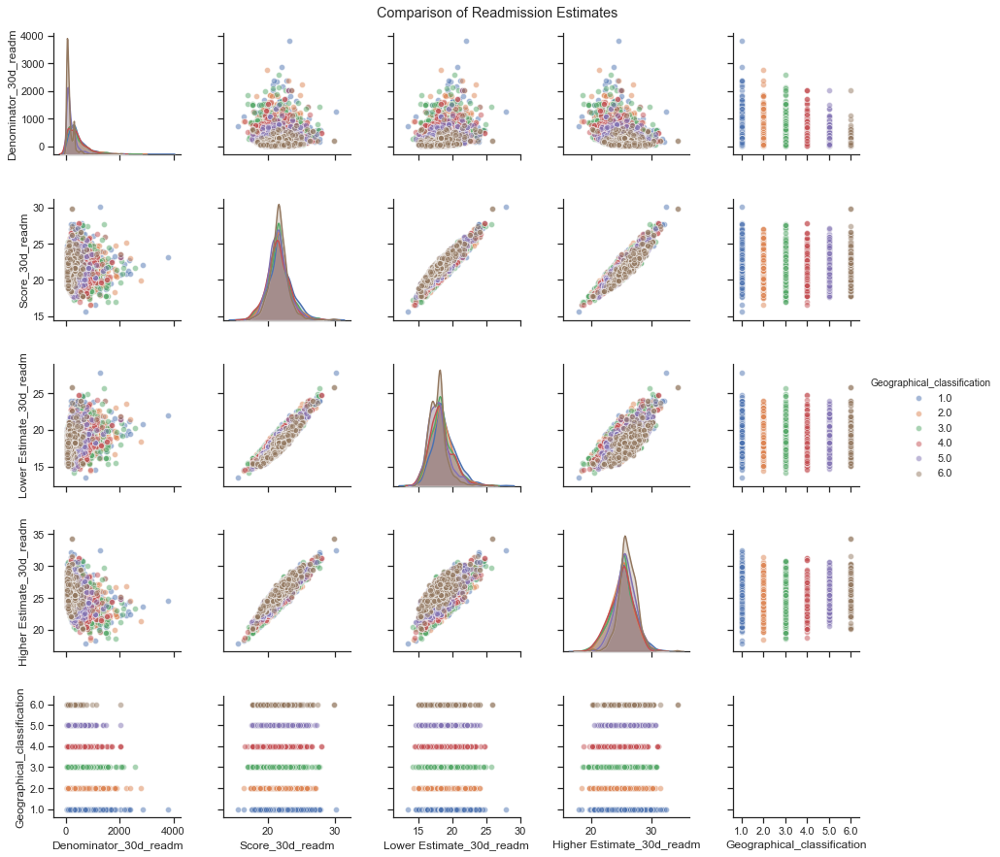

In [138]:
#comparing readmission estimates (features)
sns.set(style='ticks')

sns.pairplot(hosp_readmin_df[['Denominator_30d_readm', 'Score_30d_readm', 'Lower Estimate_30d_readm', 
                              'Higher Estimate_30d_readm', 'Geographical_classification']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Readmission Estimates')
plt.show()

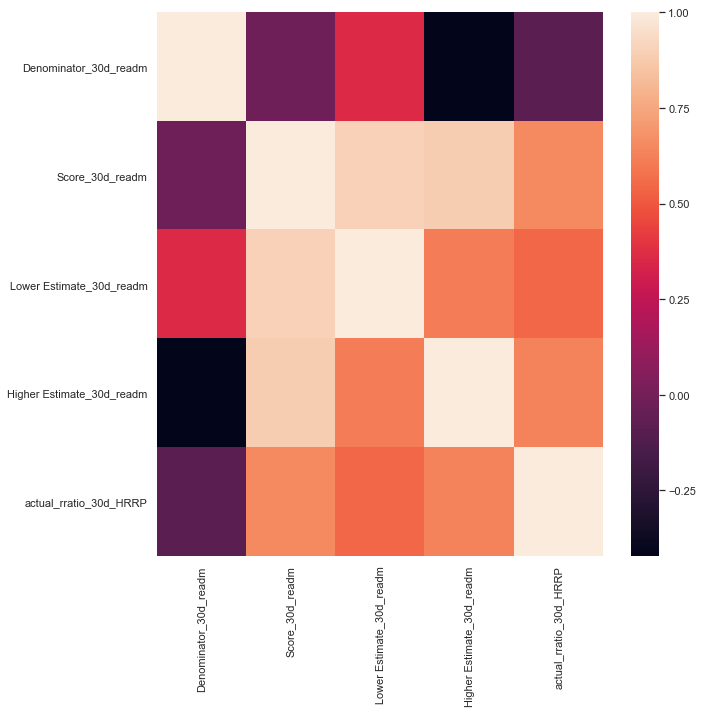

In [276]:
continuous1_columns = hosp_readmin_df[['Denominator_30d_readm', 'Score_30d_readm', 
                                       'Lower Estimate_30d_readm', 
                                       'Higher Estimate_30d_readm', 
                                       'Geographical_classification', 
                                       'actual_rratio_30d_HRRP']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous1_columns.corr())

In [270]:
continuous1_columns.corr()

,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,actual_rratio_30d_HRRP
Denominator_30d_readm,1.000000,-0.021301,0.360623,-0.421526,-0.084366
Score_30d_readm,-0.021301,1.000000,0.904672,0.888928,0.654635
Lower Estimate_30d_readm,0.360623,0.904672,1.000000,0.612925,0.546280
Higher Estimate_30d_readm,-0.421526,0.888928,0.612925,1.000000,0.630758
actual_rratio_30d_HRRP,-0.084366,0.654635,0.546280,0.630758,1.000000


In [271]:
np.abs(continuous1_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP       1.000000
Score_30d_readm              0.654635
Higher Estimate_30d_readm    0.630758
Lower Estimate_30d_readm     0.546280
Name: actual_rratio_30d_HRRP, dtype: float64

Excess Readmission Ratio: represents **Hospital's "predicted"** number of readmissions compared to **CMS "expected"** number of readmissions.

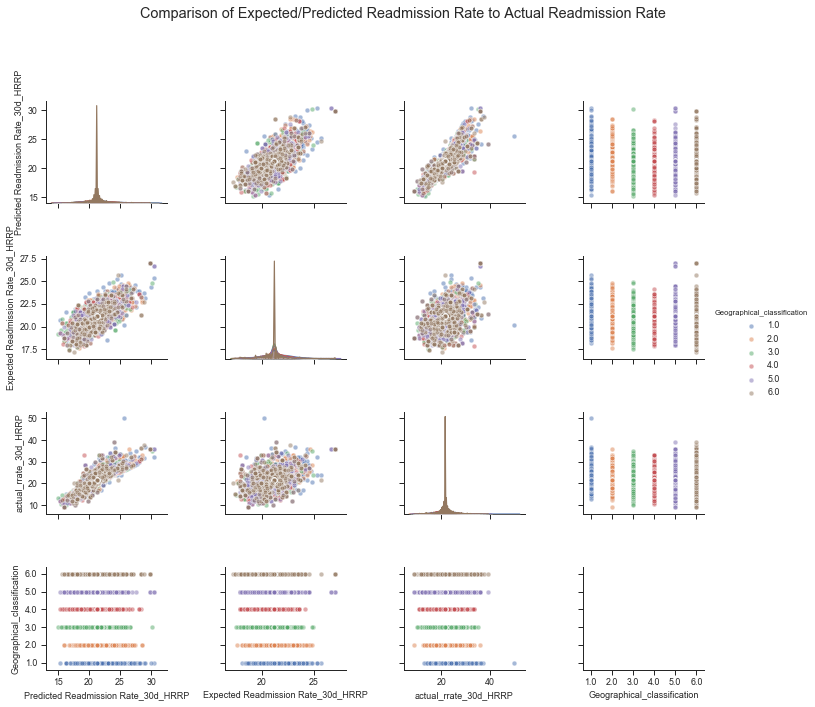

In [139]:
#comparing predicted vs expected readmissions
sns.set(style='ticks')
sns.set_context('paper', rc={'font.size':12,'axes.titlesize':9,'axes.labelsize':9}) 
sns.pairplot(hosp_readmin_df[['Predicted Readmission Rate_30d_HRRP', 'Expected Readmission Rate_30d_HRRP', 
                              'actual_rrate_30d_HRRP', 'Geographical_classification']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=.85)
plt.xticks(rotation=45)
plt.suptitle('Comparison of Expected/Predicted Readmission Rate to Actual Readmission Rate')
  


plt.show()

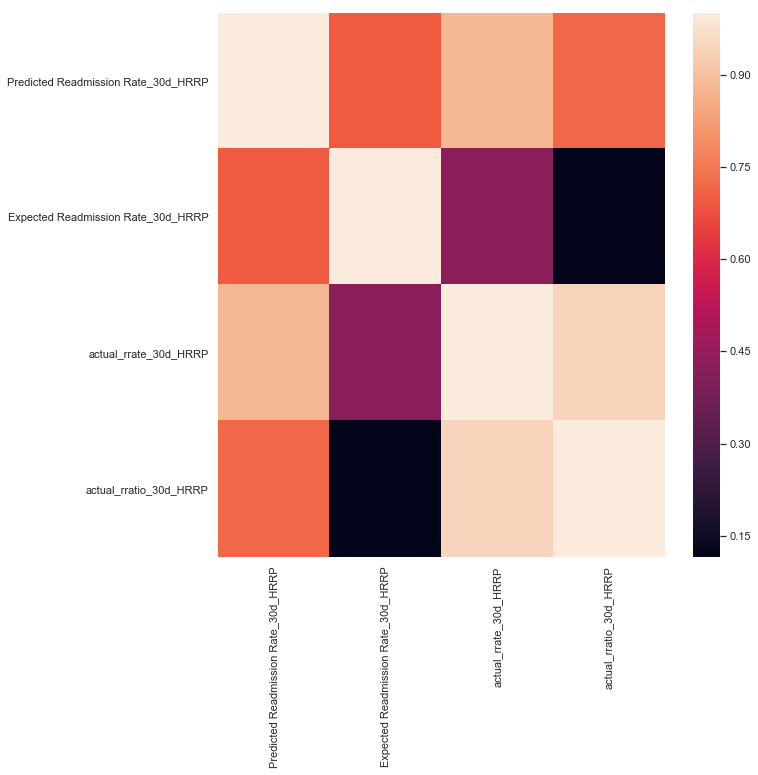

In [277]:
continuous2_columns = hosp_readmin_df[['Predicted Readmission Rate_30d_HRRP', 
                                       'Expected Readmission Rate_30d_HRRP',
                                       'actual_rrate_30d_HRRP', 'Geographical_classification', 
                                       'actual_rratio_30d_HRRP']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous2_columns.corr())

In [278]:
continuous2_columns.corr()

,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP
Predicted Readmission Rate_30d_HRRP,1.000000,0.693889,0.881764,0.718790
Expected Readmission Rate_30d_HRRP,0.693889,1.000000,0.421494,0.116225
actual_rrate_30d_HRRP,0.881764,0.421494,1.000000,0.947698
actual_rratio_30d_HRRP,0.718790,0.116225,0.947698,1.000000


In [279]:
np.abs(continuous2_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP                1.000000
actual_rrate_30d_HRRP                 0.947698
Expected Readmission Rate_30d_HRRP    0.116225
Name: actual_rratio_30d_HRRP, dtype: float64

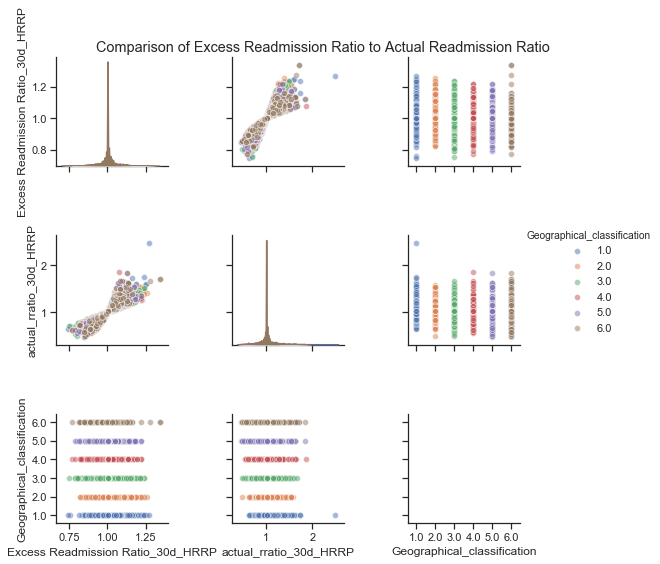

In [140]:
#comparing excess readmin ratio to actual readmin ratio (target)
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['Excess Readmission Ratio_30d_HRRP', 'actual_rratio_30d_HRRP', 
                             'Geographical_classification']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Excess Readmission Ratio to Actual Readmission Ratio')
#plt.set_xticklabels(plt.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.show()

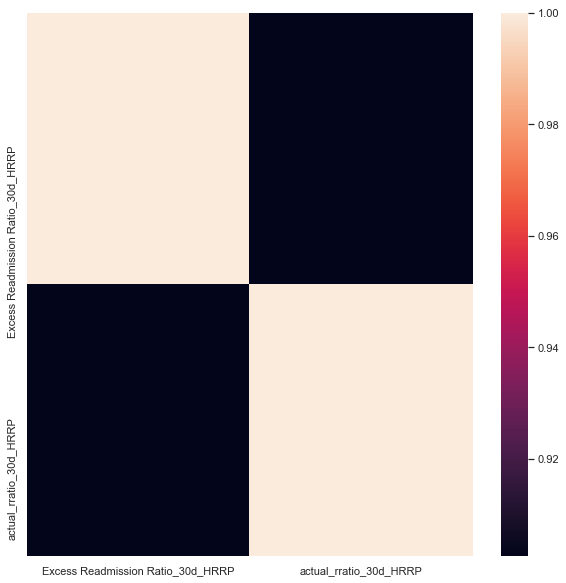

In [280]:
continuous3_columns = hosp_readmin_df[['Excess Readmission Ratio_30d_HRRP', 
                                       'actual_rratio_30d_HRRP', 
                                       'Geographical_classification']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous3_columns.corr())

In [281]:
continuous3_columns.corr()

,Excess Readmission Ratio_30d_HRRP,actual_rratio_30d_HRRP
Excess Readmission Ratio_30d_HRRP,1.000000,0.902537
actual_rratio_30d_HRRP,0.902537,1.000000


In [282]:
np.abs(continuous3_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP    1.0
Name: actual_rratio_30d_HRRP, dtype: float64

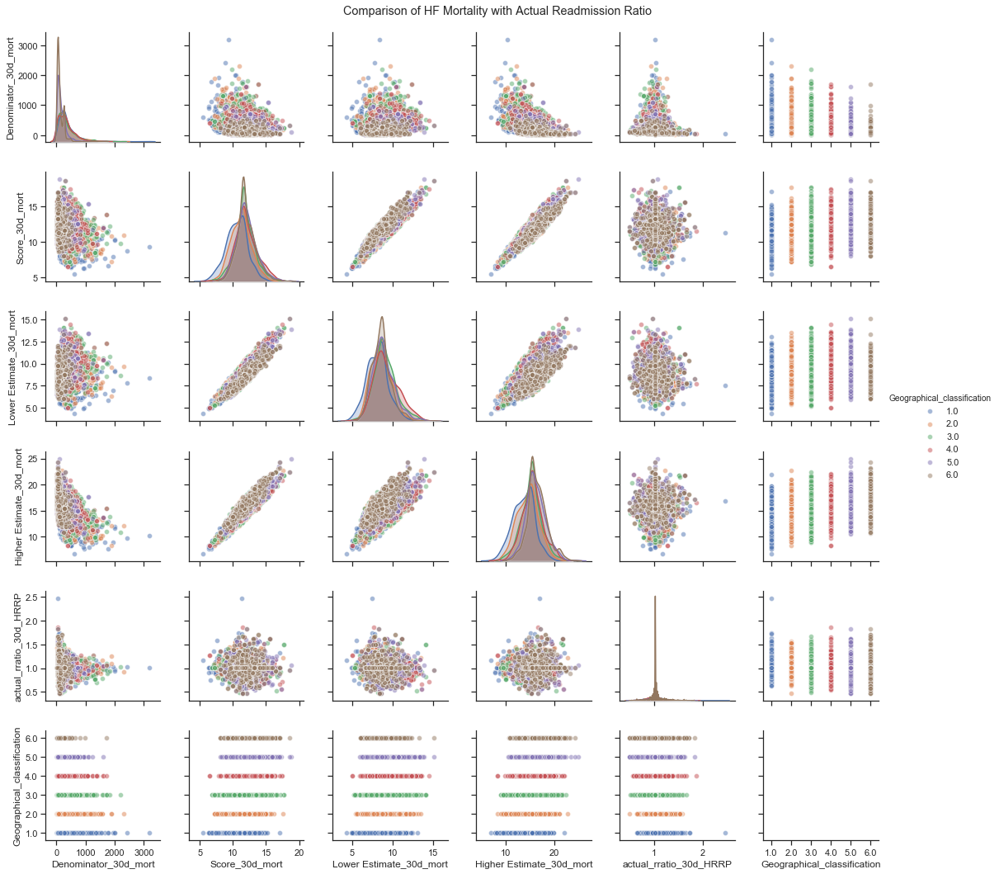

In [141]:
#compare mortality features with target
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['Denominator_30d_mort', 'Score_30d_mort', 
                              'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort', 
                              'actual_rratio_30d_HRRP','Geographical_classification']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of HF Mortality with Actual Readmission Ratio')
plt.show()

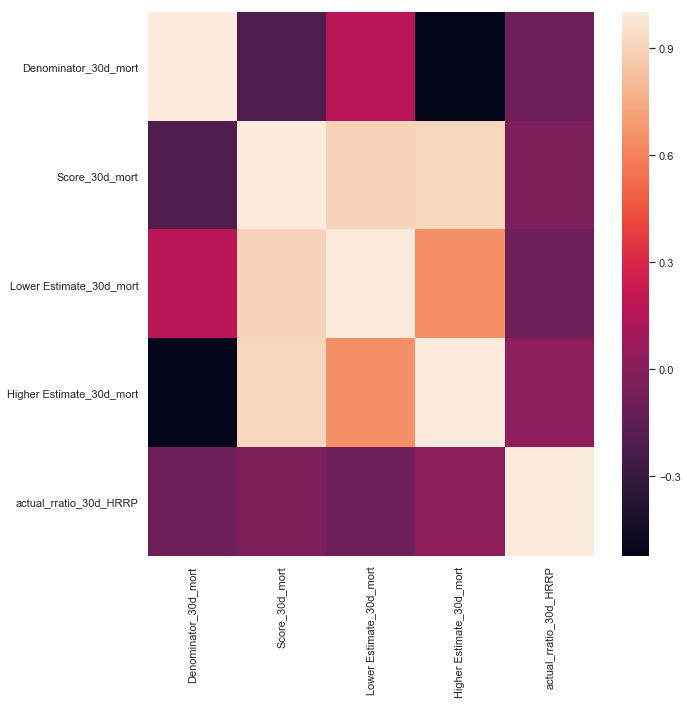

In [283]:
continuous4_columns = hosp_readmin_df[['Denominator_30d_mort', 'Score_30d_mort',
                                       'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort',
                                       'actual_rratio_30d_HRRP','Geographical_classification']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous4_columns.corr())

In [284]:
continuous4_columns.corr()

,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,actual_rratio_30d_HRRP
Denominator_30d_mort,1.000000,-0.209708,0.177359,-0.523590,-0.092057
Score_30d_mort,-0.209708,1.000000,0.898863,0.911710,-0.039621
Lower Estimate_30d_mort,0.177359,0.898863,1.000000,0.643170,-0.094084
Higher Estimate_30d_mort,-0.523590,0.911710,0.643170,1.000000,0.018588
actual_rratio_30d_HRRP,-0.092057,-0.039621,-0.094084,0.018588,1.000000


In [285]:
np.abs(continuous4_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP      1.000000
Lower Estimate_30d_mort     0.094084
Score_30d_mort              0.039621
Higher Estimate_30d_mort    0.018588
Name: actual_rratio_30d_HRRP, dtype: float64

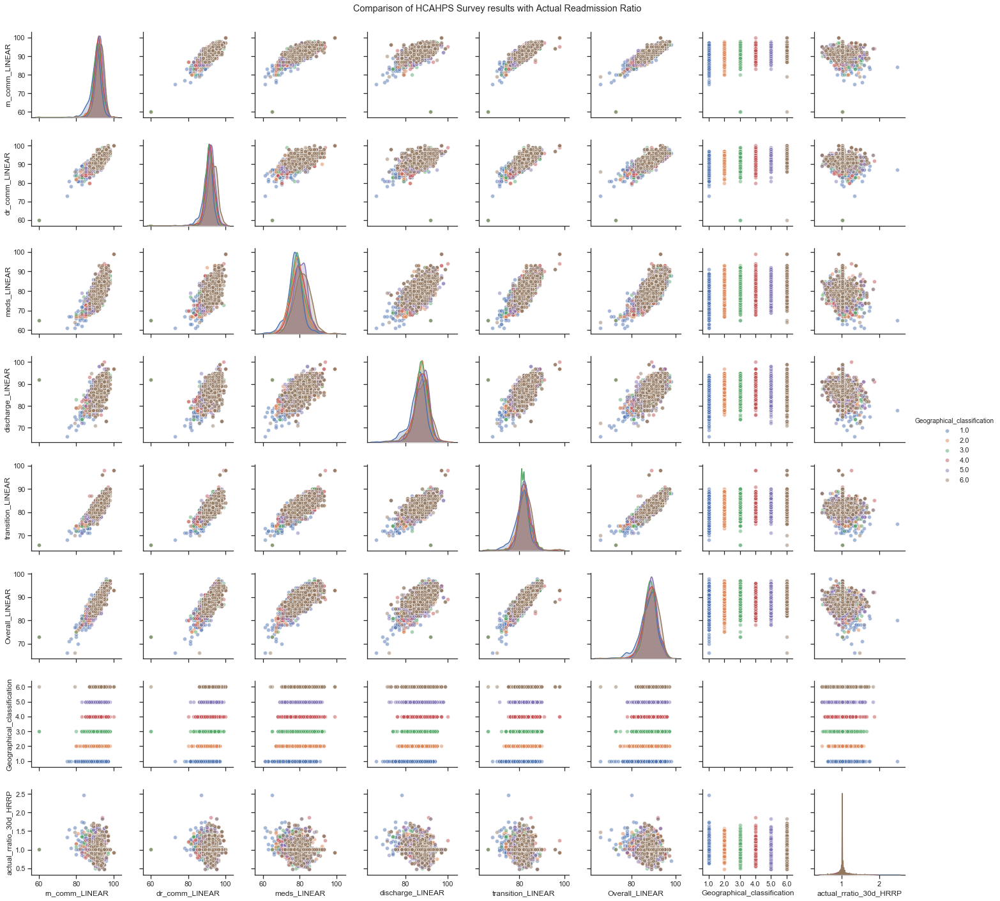

In [142]:
#compare Survey results with target
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['rn_comm_LINEAR', 'dr_comm_LINEAR', 
                     'meds_LINEAR', 'discharge_LINEAR',  
                     'transition_LINEAR', 'Overall_LINEAR',
                     'Geographical_classification','actual_rratio_30d_HRRP']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of HCAHPS Survey results with Actual Readmission Ratio')
plt.show()

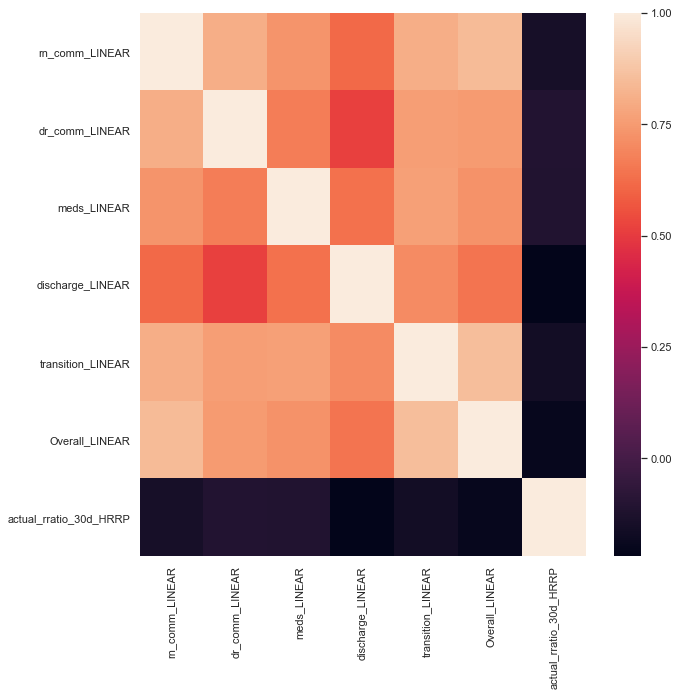

In [286]:
continuous5_columns = hosp_readmin_df[['rn_comm_LINEAR', 'dr_comm_LINEAR',
                                       'meds_LINEAR', 'discharge_LINEAR', 
                                       'transition_LINEAR', 'Overall_LINEAR',
                                       'Geographical_classification','actual_rratio_30d_HRRP']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous5_columns.corr())

In [287]:
continuous5_columns.corr()

,rn_comm_LINEAR,dr_comm_LINEAR,meds_LINEAR,discharge_LINEAR,transition_LINEAR,Overall_LINEAR,actual_rratio_30d_HRRP
rn_comm_LINEAR,1.000000,0.808154,0.732551,0.615513,0.804806,0.843181,-0.147749
dr_comm_LINEAR,0.808154,1.000000,0.669998,0.516590,0.759455,0.747407,-0.107746
meds_LINEAR,0.732551,0.669998,1.000000,0.636226,0.764958,0.726850,-0.112613
discharge_LINEAR,0.615513,0.516590,0.636226,1.000000,0.707382,0.646742,-0.220332
transition_LINEAR,0.804806,0.759455,0.764958,0.707382,1.000000,0.854148,-0.160727
Overall_LINEAR,0.843181,0.747407,0.726850,0.646742,0.854148,1.000000,-0.197692
actual_rratio_30d_HRRP,-0.147749,-0.107746,-0.112613,-0.220332,-0.160727,-0.197692,1.000000


In [288]:
np.abs(continuous5_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP    1.000000
discharge_LINEAR          0.220332
Overall_LINEAR            0.197692
transition_LINEAR         0.160727
meds_LINEAR               0.112613
dr_comm_LINEAR            0.107746
Name: actual_rratio_30d_HRRP, dtype: float64

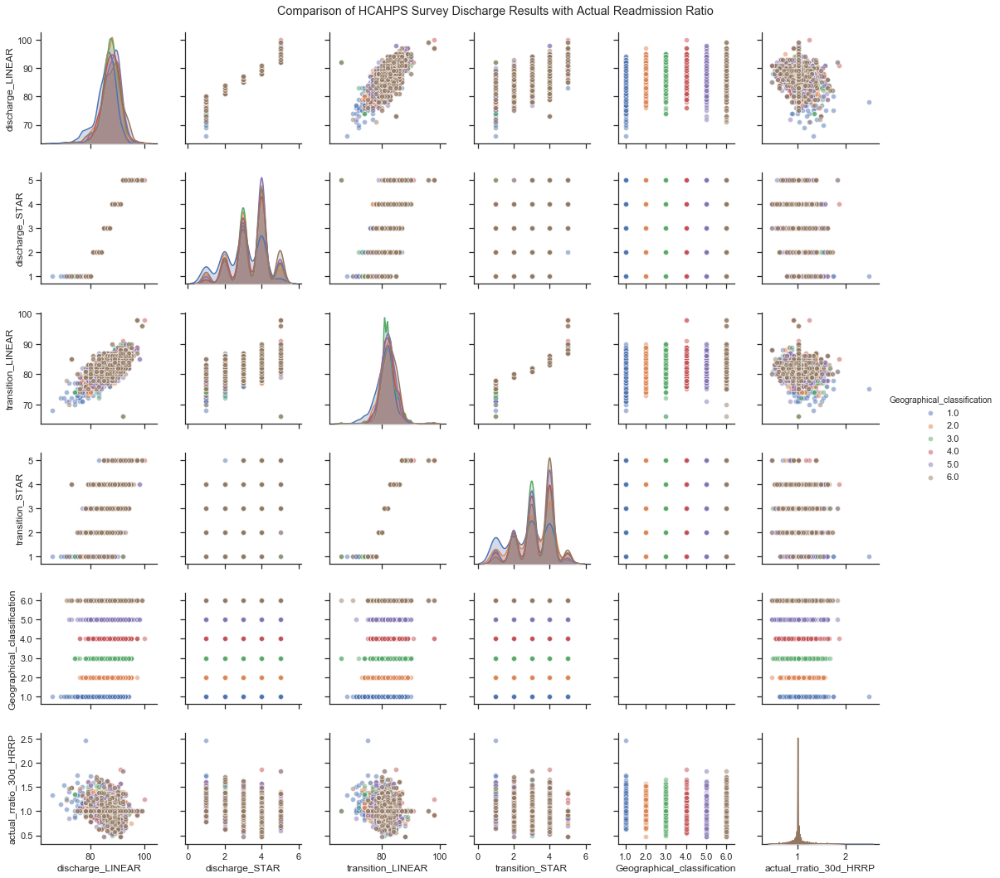

In [143]:
#compare survey discharge results with target
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['discharge_LINEAR', 'discharge_STAR',
                              'transition_LINEAR', 'transition_STAR', 
                              'Geographical_classification','actual_rratio_30d_HRRP']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of HCAHPS Survey Discharge Results with Actual Readmission Ratio')
plt.show()

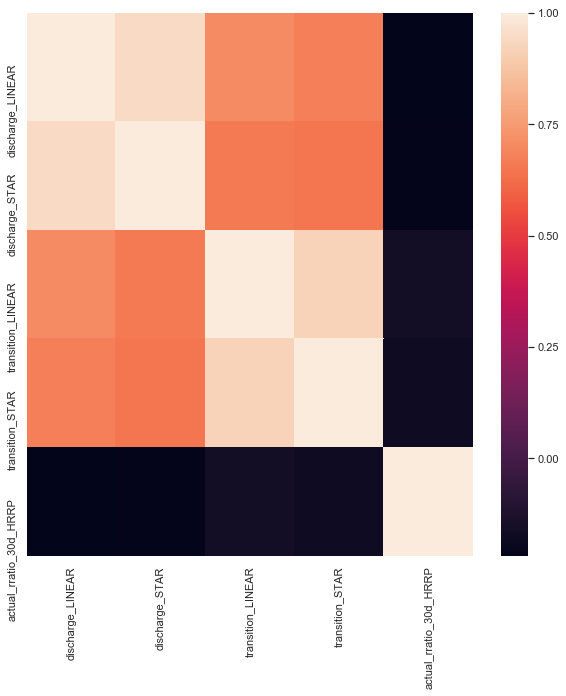

In [289]:
continuous5_columns = hosp_readmin_df[['discharge_LINEAR', 'discharge_STAR',
                              'transition_LINEAR', 'transition_STAR', 
                              'Geographical_classification','actual_rratio_30d_HRRP']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(continuous5_columns.corr())

In [290]:
continuous5_columns.corr()

,discharge_LINEAR,discharge_STAR,transition_LINEAR,transition_STAR,actual_rratio_30d_HRRP
discharge_LINEAR,1.000000,0.945397,0.707382,0.671286,-0.220332
discharge_STAR,0.945397,1.000000,0.660102,0.647401,-0.212565
transition_LINEAR,0.707382,0.660102,1.000000,0.919524,-0.160727
transition_STAR,0.671286,0.647401,0.919524,1.000000,-0.173854
actual_rratio_30d_HRRP,-0.220332,-0.212565,-0.160727,-0.173854,1.000000


In [291]:
np.abs(continuous5_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP    1.000000
discharge_STAR            0.212565
transition_STAR           0.173854
transition_LINEAR         0.160727
Name: actual_rratio_30d_HRRP, dtype: float64

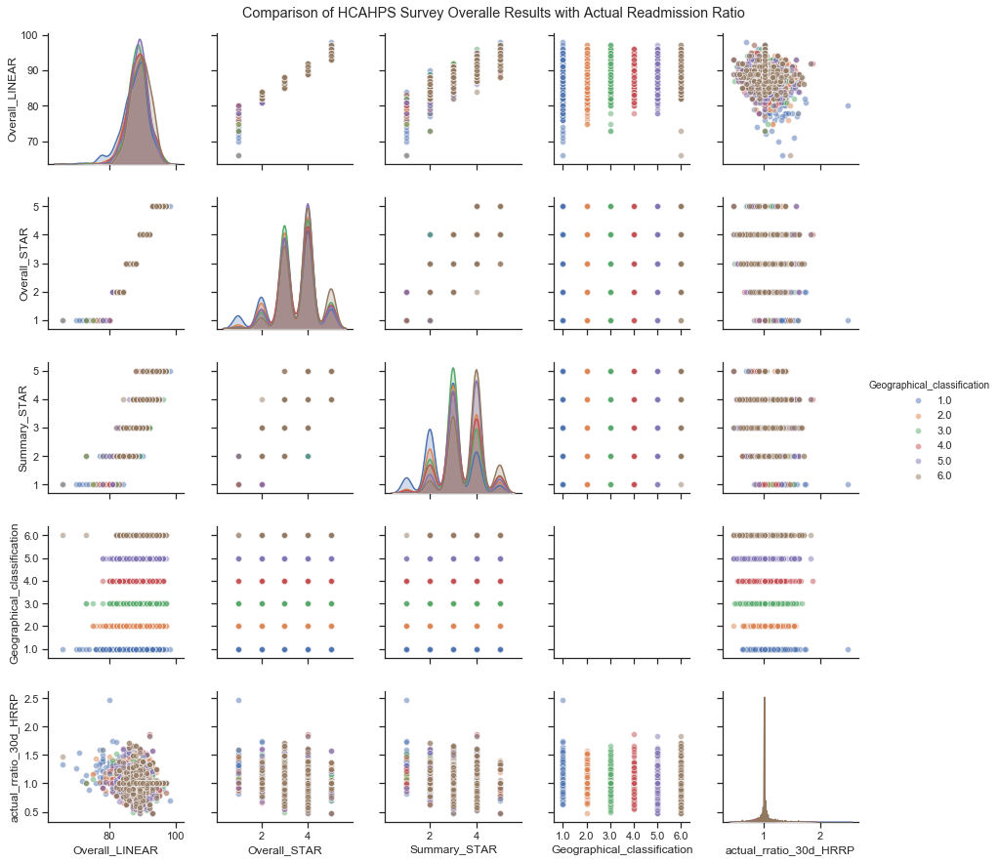

In [144]:
#compare survey overall results with target
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['Overall_LINEAR', 'Overall_STAR', 'Summary_STAR', 
                              'Geographical_classification','actual_rratio_30d_HRRP']], 
            hue= 'Geographical_classification',
            plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of HCAHPS Survey Overalle Results with Actual Readmission Ratio')
plt.show()

In [292]:
continuous6_columns = hosp_readmin_df[['Overall_LINEAR', 'Overall_STAR', 'Summary_STAR', 
                              'Geographical_classification','actual_rratio_30d_HRRP']]

#correlation matrix
plt.figure(figsize=(10,10))
sns.set(font_scale=1)

<Figure size 720x720 with 0 Axes>

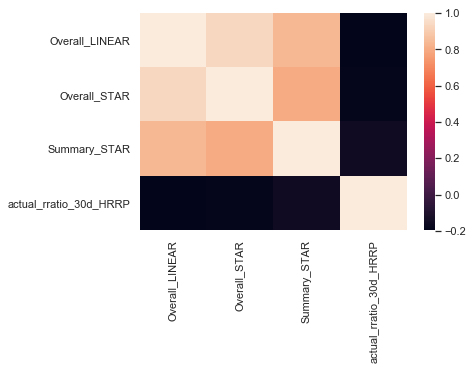

In [293]:
sns.heatmap(continuous6_columns.corr())

In [295]:
continuous6_columns.corr()

,Overall_LINEAR,Overall_STAR,Summary_STAR,actual_rratio_30d_HRRP
Overall_LINEAR,1.000000,0.938754,0.836358,-0.197692
Overall_STAR,0.938754,1.000000,0.800725,-0.185617
Summary_STAR,0.836358,0.800725,1.000000,-0.150895
actual_rratio_30d_HRRP,-0.197692,-0.185617,-0.150895,1.000000


In [294]:
np.abs(continuous6_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP    1.000000
Overall_STAR              0.185617
Summary_STAR              0.150895
Name: actual_rratio_30d_HRRP, dtype: float64

C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\katec\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


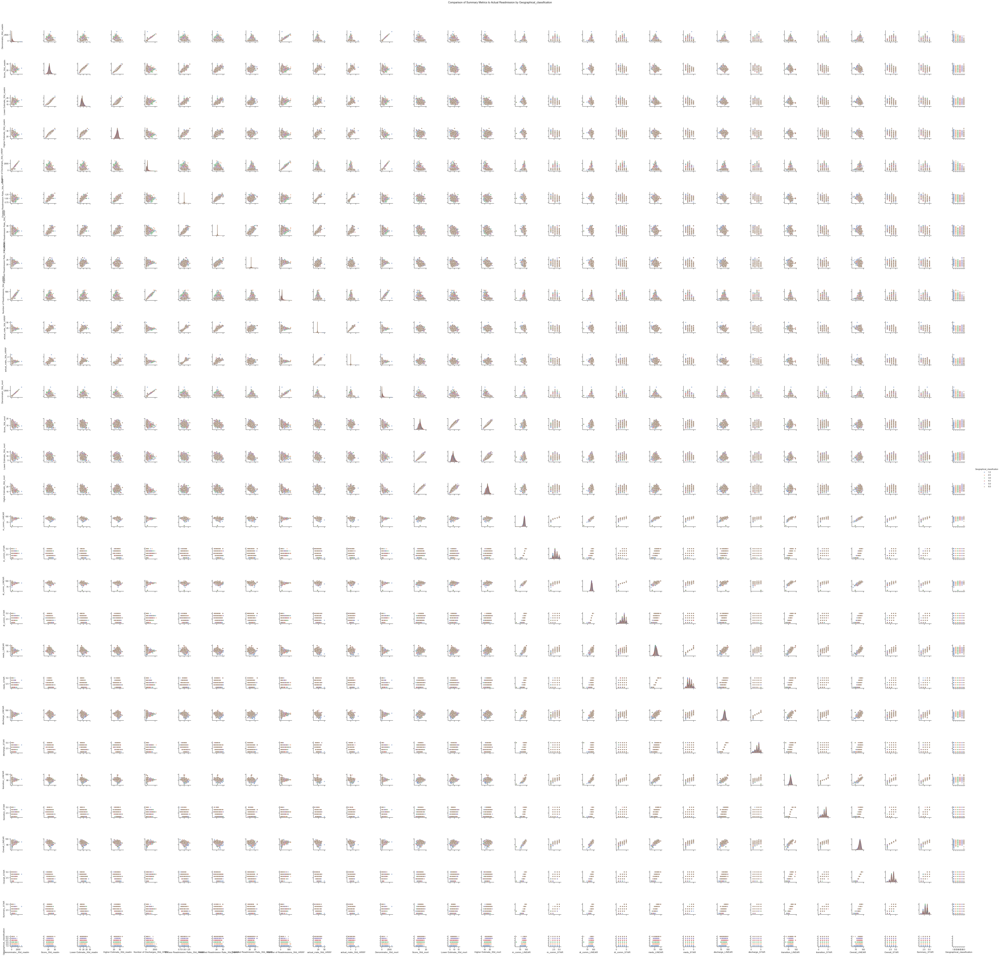

In [300]:
#pairwise of all contiuous measures (features & target)
sns.set(style="ticks")

sns.pairplot(hosp_readmin_df[['Denominator_30d_readm', 'Score_30d_readm', 
                              'Lower Estimate_30d_readm', 'Higher Estimate_30d_readm', 
                              'Number of Discharges_30d_HRRP',
                              'Excess Readmission Ratio_30d_HRRP', 
                              'Predicted Readmission Rate_30d_HRRP',
                              'Expected Readmission Rate_30d_HRRP', 
                              'Number of Readmissions_30d_HRRP', 
                              'actual_rrate_30d_HRRP', 'actual_rratio_30d_HRRP', 
                              'Denominator_30d_mort', 'Score_30d_mort', 
                              'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort',
                              'rn_comm_LINEAR', 'rn_comm_STAR', 'dr_comm_LINEAR', 
                              'dr_comm_STAR', 'meds_LINEAR', 'meds_STAR', 'discharge_LINEAR',
                              'discharge_STAR', 'transition_LINEAR', 'transition_STAR', 
                              'Overall_LINEAR', 'Overall_STAR', 'Summary_STAR', 
                              'Geographical_classification']],
             hue= 'Geographical_classification',
             plot_kws = {'alpha': 0.5})
plt.subplots_adjust(top=0.95)
plt.suptitle('Comparison of Summary Metrics to Actual Readmission by Geographical_classification')
plt.show()

In [301]:
continuous7_columns = hosp_readmin_df[['Denominator_30d_readm', 'Score_30d_readm', 
                                       'Lower Estimate_30d_readm', 'Higher Estimate_30d_readm',
                                       'Number of Discharges_30d_HRRP',
                                       'Excess Readmission Ratio_30d_HRRP', 
                                       'Predicted Readmission Rate_30d_HRRP',
                                       'Expected Readmission Rate_30d_HRRP', 
                                       'Number of Readmissions_30d_HRRP', 
                                       'actual_rrate_30d_HRRP', 'actual_rratio_30d_HRRP', 
                                       'Denominator_30d_mort', 'Score_30d_mort', 
                                       'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort',
                                       'rn_comm_LINEAR', 'rn_comm_STAR', 'dr_comm_LINEAR', 
                                       'dr_comm_STAR', 'meds_LINEAR', 'meds_STAR', 
                                       'discharge_LINEAR', 'discharge_STAR', 
                                       'transition_LINEAR', 'transition_STAR', 
                                       'Overall_LINEAR', 'Overall_STAR',
                                       'Summary_STAR', 'Geographical_classification']]

In [302]:
continuous7_columns.corr()

,Denominator_30d_readm,Score_30d_readm,Lower Estimate_30d_readm,Higher Estimate_30d_readm,Number of Discharges_30d_HRRP,Excess Readmission Ratio_30d_HRRP,Predicted Readmission Rate_30d_HRRP,Expected Readmission Rate_30d_HRRP,Number of Readmissions_30d_HRRP,actual_rrate_30d_HRRP,actual_rratio_30d_HRRP,Denominator_30d_mort,Score_30d_mort,Lower Estimate_30d_mort,Higher Estimate_30d_mort,rn_comm_LINEAR,rn_comm_STAR,dr_comm_LINEAR,dr_comm_STAR,meds_LINEAR,meds_STAR,discharge_LINEAR,discharge_STAR,transition_LINEAR,transition_STAR,Overall_LINEAR,Overall_STAR,Summary_STAR
Denominator_30d_readm,1.000000,-0.021301,0.360623,-0.421526,0.888371,-0.068003,0.078252,0.223053,0.869741,-0.011604,-0.084366,0.992649,-0.224078,0.158373,-0.531369,-0.134039,-0.177982,-0.203040,-0.202805,-0.257950,-0.278576,-0.106063,-0.103602,-0.126923,-0.099407,-0.068867,-0.068047,-0.223937
Score_30d_readm,-0.021301,1.000000,0.904672,0.888928,-0.076388,0.744272,0.622957,0.137999,0.056900,0.647004,0.654635,-0.036689,-0.097170,-0.109449,-0.071903,-0.189553,-0.165441,-0.160848,-0.186632,-0.137572,-0.125809,-0.227847,-0.223789,-0.184166,-0.190598,-0.217563,-0.202982,-0.193341
Lower Estimate_30d_readm,0.360623,0.904672,1.000000,0.612925,0.231725,0.650534,0.623793,0.256883,0.349033,0.583869,0.546280,0.341001,-0.189953,-0.020773,-0.316188,-0.264465,-0.263402,-0.273968,-0.297421,-0.269639,-0.267459,-0.269912,-0.264313,-0.254472,-0.246502,-0.262974,-0.249392,-0.311157
Higher Estimate_30d_readm,-0.421526,0.888928,0.612925,1.000000,-0.382604,0.686352,0.487762,-0.021803,-0.260394,0.575347,0.630758,-0.428932,0.023938,-0.180759,0.206919,-0.065553,-0.021037,-0.001254,-0.025153,0.035723,0.055487,-0.131730,-0.131516,-0.065777,-0.087447,-0.118677,-0.106992,-0.023490
Number of Discharges_30d_HRRP,0.888371,-0.076388,0.231725,-0.382604,1.000000,-0.072071,0.091704,0.251517,0.979764,-0.008900,-0.090669,0.890993,-0.173593,0.129551,-0.410602,-0.013676,-0.043213,-0.077316,-0.076902,-0.134321,-0.153478,-0.025788,-0.030131,-0.017090,-0.001985,0.045770,0.042164,-0.087928
Excess Readmission Ratio_30d_HRRP,-0.068003,0.744272,0.650534,0.686352,-0.072071,1.000000,0.817028,0.153876,0.101118,0.878552,0.902537,-0.077912,-0.063463,-0.099431,-0.020341,-0.171015,-0.147448,-0.144093,-0.172149,-0.126117,-0.111292,-0.211059,-0.209080,-0.180873,-0.202239,-0.217476,-0.204053,-0.175124
Predicted Readmission Rate_30d_HRRP,0.078252,0.622957,0.623793,0.487762,0.091704,0.817028,1.000000,0.693889,0.256058,0.881764,0.718790,0.062649,-0.199631,-0.163482,-0.199710,-0.199906,-0.171186,-0.202271,-0.222005,-0.170974,-0.160632,-0.226560,-0.227007,-0.202451,-0.217661,-0.226551,-0.211284,-0.216187
Expected Readmission Rate_30d_HRRP,0.223053,0.137999,0.256883,-0.021803,0.251517,0.153876,0.693889,1.000000,0.316085,0.421494,0.116225,0.208657,-0.262514,-0.155294,-0.316660,-0.129383,-0.110527,-0.166723,-0.166346,-0.137490,-0.139141,-0.126430,-0.129399,-0.122433,-0.122007,-0.119103,-0.109418,-0.153734
Number of Readmissions_30d_HRRP,0.869741,0.056900,0.349033,-0.260394,0.979764,0.101118,0.256058,0.316085,1.000000,0.134895,0.042801,0.868715,-0.196442,0.097986,-0.421925,-0.043269,-0.067884,-0.104791,-0.109630,-0.154947,-0.172152,-0.060095,-0.065003,-0.049063,-0.039239,0.007228,0.006796,-0.118891
actual_rrate_30d_HRRP,-0.011604,0.647004,0.583869,0.575347,-0.008900,0.878552,0.881764,0.421494,0.134895,1.000000,0.947698,-0.023152,-0.119351,-0.136337,-0.082535,-0.177040,-0.143687,-0.152374,-0.172253,-0.145135,-0.127018,-0.240744,-0.234843,-0.185695,-0.197548,-0.217784,-0.203796,-0.185481


In [303]:
np.abs(continuous7_columns.iloc[:,1:].corr().loc[:,'actual_rratio_30d_HRRP']).sort_values(ascending=False)

actual_rratio_30d_HRRP                 1.000000
actual_rrate_30d_HRRP                  0.947698
Excess Readmission Ratio_30d_HRRP      0.902537
Predicted Readmission Rate_30d_HRRP    0.718790
Score_30d_readm                        0.654635
Higher Estimate_30d_readm              0.630758
Lower Estimate_30d_readm               0.546280
discharge_LINEAR                       0.220332
discharge_STAR                         0.212565
Overall_LINEAR                         0.197692
Overall_STAR                           0.185617
transition_STAR                        0.173854
transition_LINEAR                      0.160727
Summary_STAR                           0.150895
rn_comm_LINEAR                         0.147749
dr_comm_STAR                           0.130526
rn_comm_STAR                           0.119050
Expected Readmission Rate_30d_HRRP     0.116225
meds_LINEAR                            0.112613
dr_comm_LINEAR                         0.107746
Lower Estimate_30d_mort                0

#### categorical data

In [146]:
empty_values = (hosp_readmin_df[categorical_values] == 0).all()

In [147]:
empty_values

READM_30_HF                                                       False
comp_nat_30d_readm_No Different Than the National Rate            False
comp_nat_30d_readm_Not Available                                  False
comp_nat_30d_readm_Number of Cases Too Small                      False
comp_nat_30d_readm_Worse Than the National Rate                   False
READM_30_HF_HRRP                                                  False
MORT_30_HF                                                        False
nat_comp_30d_mort_No Different Than the National Rate             False
nat_comp_30d_mort_Not Available                                   False
nat_comp_30d_mort_Number of Cases Too Small                       False
nat_comp_30d_mort_Worse Than the National Rate                    False
Hospital Type_Childrens                                            True
Hospital Type_Critical Access Hospitals                           False
Hospital Type_Psychiatric                                       

#### drop
No value in columns, all zeros:
'Hospital Type_Childrens', 'Hospital Type_Psychiatric'

In [148]:
hosp_readmin_df = hosp_readmin_df.drop(['Hospital Type_Childrens', 'Hospital Type_Psychiatric'], axis=1)

In [149]:
#all categorical columns, potential features
categorical_columns = hosp_readmin_df[['READM_30_HF', 'comp_nat_30d_readm_No Different Than the National Rate', 
                      'comp_nat_30d_readm_Number of Cases Too Small', 
                      'comp_nat_30d_readm_Worse Than the National Rate', 'READM_30_HF_HRRP', 'MORT_30_HF', 
                      'nat_comp_30d_mort_No Different Than the National Rate',
                      'nat_comp_30d_mort_Number of Cases Too Small',
                      'nat_comp_30d_mort_Worse Than the National Rate',  
                      'Hospital Type_Critical Access Hospitals', 
                      'Hospital Ownership_Government - Hospital District or Authority',
                      'Hospital Ownership_Government - Local', 'Hospital Ownership_Government - State',
                      'Hospital Ownership_Physician', 'Hospital Ownership_Proprietary', 'Hospital Ownership_Tribal',
                      'Hospital Ownership_Voluntary non-profit - Church', 
                      'Hospital Ownership_Voluntary non-profit - Other', 
                      'Hospital Ownership_Voluntary non-profit - Private', 'Emergency Services_Yes', 
                      'Hospital overall rating_2', 'Hospital overall rating_3', 'Hospital overall rating_4', 
                      'Hospital overall rating_5', 'Hospital overall rating_Not Available', 
                      'Mortality national comparison_Below the national average', 
                      'Mortality national comparison_Not Available', 
                      'Mortality national comparison_Same as the national average',
                      'Safety of care national comparison_Below the national average', 
                      'Safety of care national comparison_Not Available',
                      'Safety of care national comparison_Same as the national average', 
                      'Readmission national comparison_Below the national average', 
                      'Readmission national comparison_Not Available', 
                      'Readmission national comparison_Same as the national average', 
                      'Patient experience national comparison_Below the national average', 
                      'Patient experience national comparison_Not Available', 
                      'Patient experience national comparison_Same as the national average',
                      'Effectiveness of care national comparison_Below the national average',
                      'Effectiveness of care national comparison_Not Available', 
                      'Effectiveness of care national comparison_Same as the national average', 
                      'Timeliness of care national comparison_Below the national average',
                      'Timeliness of care national comparison_Not Available', 
                      'Timeliness of care national comparison_Same as the national average',
                      'Efficient use of medical imaging national comparison_Below the national average',
                      'Efficient use of medical imaging national comparison_Not Available',
                      'Efficient use of medical imaging national comparison_Same as the national average',
                      'State_AL',  'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 'State_DC', 
                      'State_DE', 'State_FL', 'State_GA', 'State_HI', 'State_IA', 'State_ID', 'State_IL', 
                      'State_IN', 'State_KS', 'State_KY', 'State_LA', 'State_MA', 'State_MD', 'State_ME', 
                      'State_MI', 'State_MN', 'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND', 
                      'State_NE', 'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 
                      'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN', 
                      'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 'State_WV', 
                      'State_WY', 'Large fringe metro', 'Medium metro', 'Small metro', 'Micropolitan', 
                                       'Noncore', 'actual_rratio_30d_HRRP']]

##### categorical values related to readmission

In [305]:
categorical1_columns = hosp_readmin_df[['READM_30_HF', 'comp_nat_30d_readm_No Different Than the National Rate', 
                      'comp_nat_30d_readm_Number of Cases Too Small', 
                      'comp_nat_30d_readm_Worse Than the National Rate', 'READM_30_HF_HRRP', 
                      'actual_rratio_30d_HRRP',
                      'Readmission national comparison_Below the national average', 
                      'Readmission national comparison_Not Available', 
                      'Readmission national comparison_Same as the national average']]

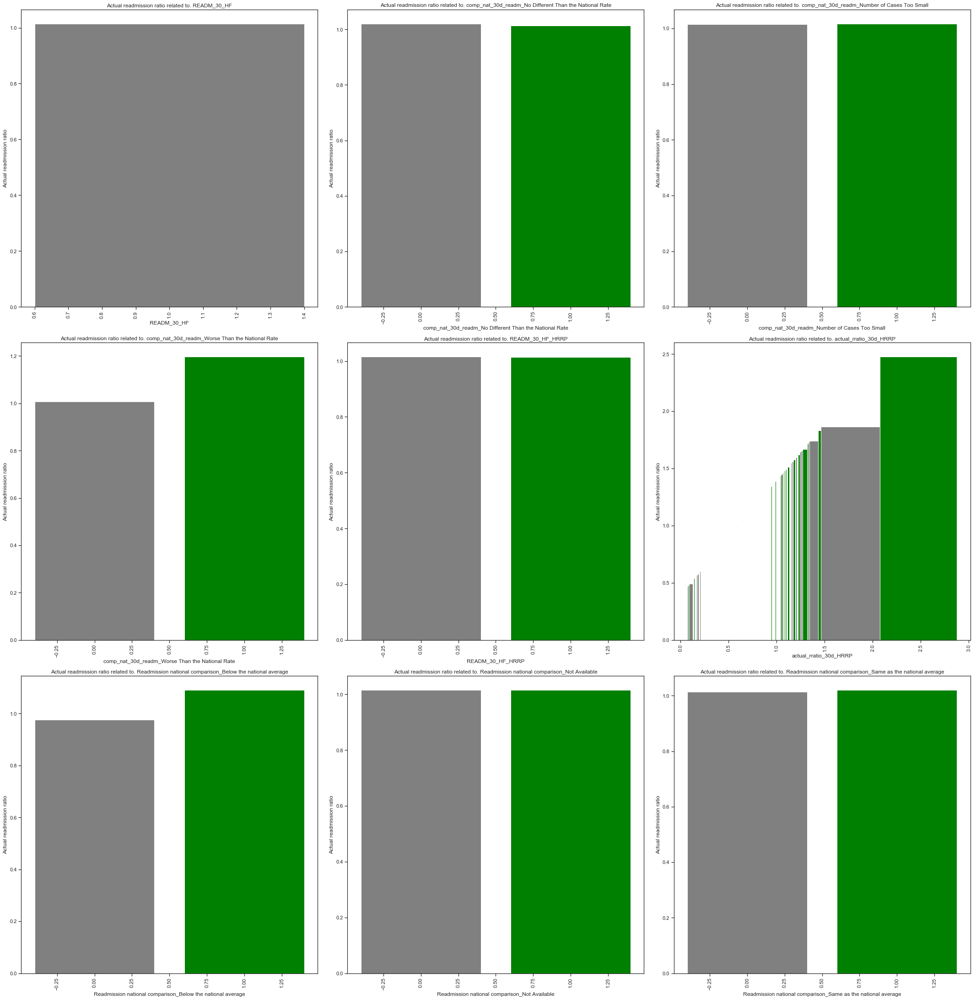

In [309]:
#comapre categorical features with target
plt.figure(figsize=(30,50))

for index, column in enumerate(categorical1_columns):
    plt.subplot(5,3,index+1)
    plt.bar(categorical1_columns.groupby(column)['actual_rratio_30d_HRRP'].mean().index, categorical1_columns.groupby(column)['actual_rratio_30d_HRRP'].mean(),
           color=('grey','green'))
    plt.title('Actual readmission ratio related to. {}'.format(column))
    plt.ylabel('Actual readmission ratio')
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

##### categorical values related to mortality

In [311]:
categorical2_columns = hosp_readmin_df[['MORT_30_HF', 'nat_comp_30d_mort_No Different Than the National Rate',
                                        'nat_comp_30d_mort_Number of Cases Too Small',
                                        'nat_comp_30d_mort_Worse Than the National Rate',
                                        'Mortality national comparison_Below the national average',
                                        'Mortality national comparison_Not Available',
                                        'Mortality national comparison_Same as the national average',
                                        'actual_rratio_30d_HRRP']]

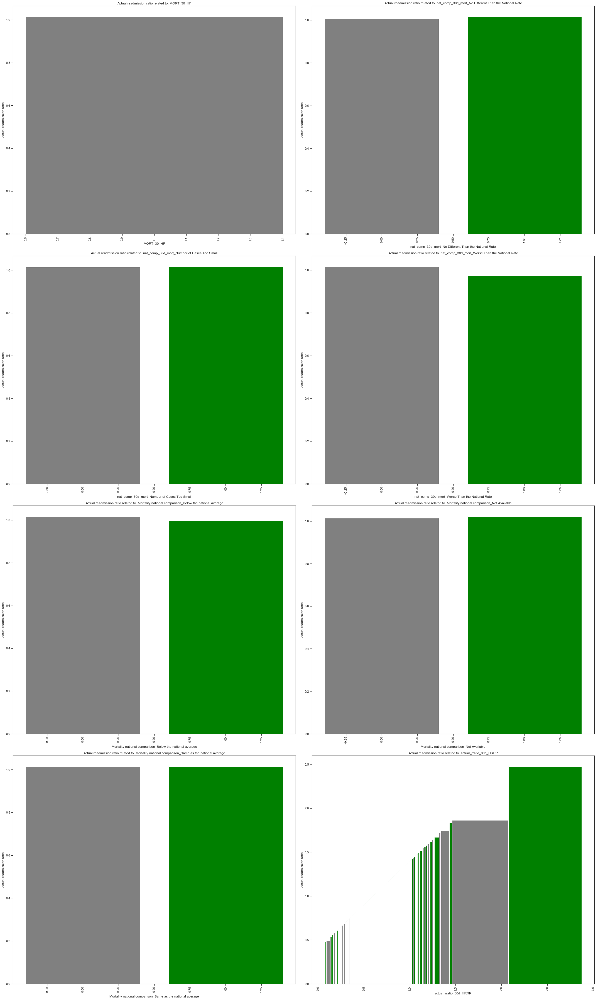

In [312]:
#comapre categorical features with target
plt.figure(figsize=(30,50))

for index, column in enumerate(categorical2_columns):
    plt.subplot(4,2,index+1)
    plt.bar(categorical2_columns.groupby(column)['actual_rratio_30d_HRRP'].mean().index, categorical2_columns.groupby(column)['actual_rratio_30d_HRRP'].mean(),
           color=('grey','green'))
    plt.title('Actual readmission ratio related to. {}'.format(column))
    plt.ylabel('Actual readmission ratio')
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

##### categorical values related to hospital

In [313]:
#categorical values related to hospital and patient experience
categorical3_columns = hosp_readmin_df[['Hospital Type_Critical Access Hospitals', 
                      'Hospital Ownership_Government - Hospital District or Authority',
                      'Hospital Ownership_Government - Local', 'Hospital Ownership_Government - State',
                      'Hospital Ownership_Physician', 'Hospital Ownership_Proprietary', 'Hospital Ownership_Tribal',
                      'Hospital Ownership_Voluntary non-profit - Church', 
                      'Hospital Ownership_Voluntary non-profit - Other', 
                      'Hospital Ownership_Voluntary non-profit - Private', 'Emergency Services_Yes', 
                      'Hospital overall rating_2', 'Hospital overall rating_3', 'Hospital overall rating_4', 
                      'Hospital overall rating_5', 'Hospital overall rating_Not Available',
                      'Safety of care national comparison_Below the national average', 
                      'Safety of care national comparison_Not Available',
                      'Safety of care national comparison_Same as the national average', 
                      'Patient experience national comparison_Below the national average', 
                      'Patient experience national comparison_Not Available', 
                      'Patient experience national comparison_Same as the national average',
                      'Effectiveness of care national comparison_Below the national average',
                      'Effectiveness of care national comparison_Not Available', 
                      'Effectiveness of care national comparison_Same as the national average', 
                      'Timeliness of care national comparison_Below the national average',
                      'Timeliness of care national comparison_Not Available', 
                      'Timeliness of care national comparison_Same as the national average',
                      'Efficient use of medical imaging national comparison_Below the national average',
                      'Efficient use of medical imaging national comparison_Not Available',
                      'Efficient use of medical imaging national comparison_Same as the national average',
                      'actual_rratio_30d_HRRP']]

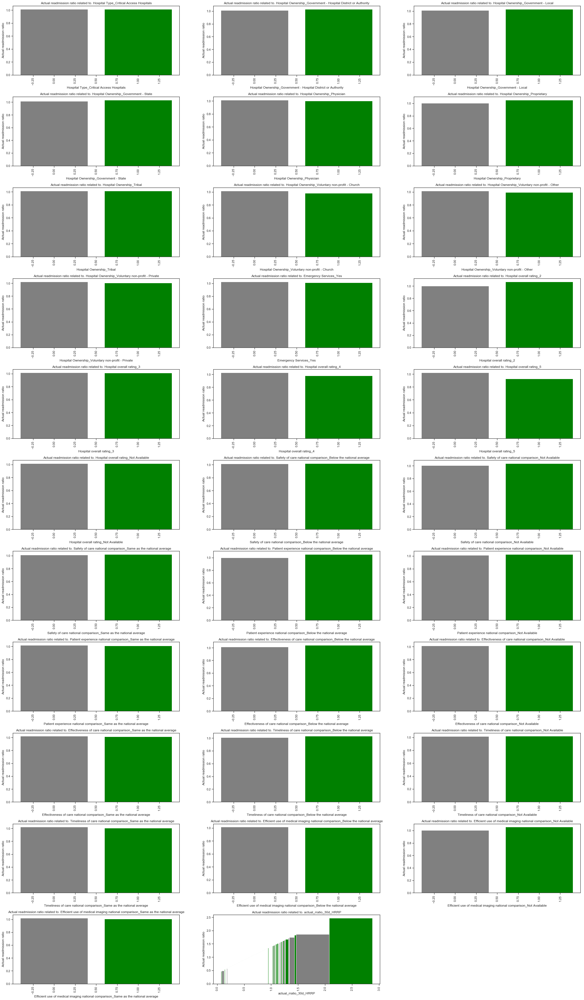

In [315]:
#comapre categorical features with target
plt.figure(figsize=(30,50))

for index, column in enumerate(categorical3_columns):
    plt.subplot(11,3,index+1)
    plt.bar(categorical3_columns.groupby(column)['actual_rratio_30d_HRRP'].mean().index, categorical3_columns.groupby(column)['actual_rratio_30d_HRRP'].mean(),
           color=('grey','green'))
    plt.title('Actual readmission ratio related to. {}'.format(column))
    plt.ylabel('Actual readmission ratio')
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

#### categorical values related to state and geographical classification

In [316]:

categorical4_columns = hosp_readmin_df[['State_AL',  'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 
                                        'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI', 'State_IA', 
                                        'State_ID', 'State_IL', 'State_IN', 'State_KS', 'State_KY', 'State_LA', 
                                        'State_MA', 'State_MD', 'State_ME', 'State_MI', 'State_MN', 'State_MO', 
                                        'State_MS', 'State_MT', 'State_NC', 'State_ND', 'State_NE', 'State_NH', 
                                        'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 'State_OK', 
                                        'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN',
                                        'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 
                                        'State_WV', 'State_WY', 'Large fringe metro', 'Medium metro', 'Small metro', 
                                        'Micropolitan', 'Noncore', 'actual_rratio_30d_HRRP']]

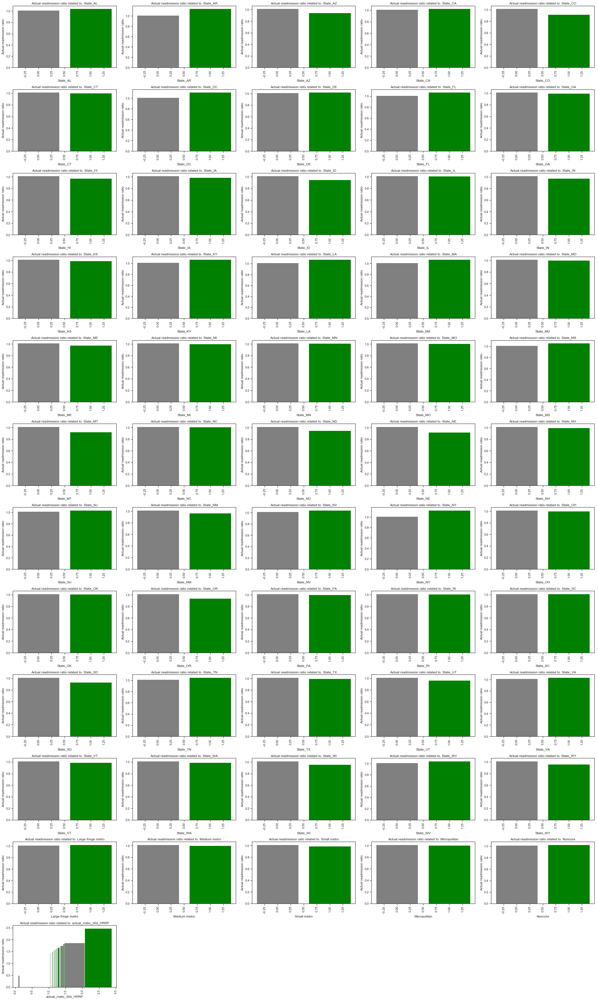

In [317]:
#comapre categorical features with target
plt.figure(figsize=(30,50))

for index, column in enumerate(categorical4_columns):
    plt.subplot(12,5,index+1)
    plt.bar(categorical4_columns.groupby(column)['actual_rratio_30d_HRRP'].mean().index, categorical4_columns.groupby(column)['actual_rratio_30d_HRRP'].mean(),
           color=('grey','green'))
    plt.title('Actual readmission ratio related to. {}'.format(column))
    plt.ylabel('Actual readmission ratio')
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

### selection of features
The exploration of the relationships between the potential features and the target variable, and the relationships between the features yields the following information.

#### continuous_features 
For continuous features, the correlation matrix reveals the relationship between the potential features and the target. Not surprisingly, the highest correlations (>0.5) occur with the features directly related to readmission and the calculation of readmission rates and ratios. Lower on the scale, but still above 0.1, are the features related to communication of staff members as well as patients' satisfaction regarding specific topics. The lowest correlations (<0.1) are releated to HF mortality. For the purpose of selection feature, will keep all all to determine their effect on the model. 

actual_rratio_30d_HRRP                 1.000000
actual_rrate_30d_HRRP                  0.947698
Excess Readmission Ratio_30d_HRRP      0.902537
Predicted Readmission Rate_30d_HRRP    0.718790
Score_30d_readm                        0.654635
Higher Estimate_30d_readm              0.630758
Lower Estimate_30d_readm               0.546280
discharge_LINEAR                       0.220332
discharge_STAR                         0.212565
Overall_LINEAR                         0.197692
Overall_STAR                           0.185617
transition_STAR                        0.173854
transition_LINEAR                      0.160727
Summary_STAR                           0.150895
rn_comm_LINEAR                         0.147749
dr_comm_STAR                           0.130526
rn_comm_STAR                           0.119050
Expected Readmission Rate_30d_HRRP     0.116225
meds_LINEAR                            0.112613
dr_comm_LINEAR                         0.107746
Lower Estimate_30d_mort                0.094084
meds_STAR                              0.093184
Denominator_30d_mort                   0.092057
Number of Discharges_30d_HRRP          0.090669
Number of Readmissions_30d_HRRP        0.042801
Score_30d_mort                         0.039621
Higher Estimate_30d_mort               0.018588

continuous features = 'Denominator_30d_readm', 'Score_30d_readm', 'Lower Estimate_30d_readm', 
                     'Higher Estimate_30d_readm', 'Number of Discharges_30d_HRRP', 
                     'Excess Readmission Ratio_30d_HRRP', 'Predicted Readmission Rate_30d_HRRP',
                     'Expected Readmission Rate_30d_HRRP', 'Number of Readmissions_30d_HRRP', 
                     'actual_rrate_30d_HRRP', 'Denominator_30d_mort', 
                     'Score_30d_mort', 'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort', 
                     'rn_comm_LINEAR', 'rn_comm_STAR', 'dr_comm_LINEAR', 'dr_comm_STAR',
                     'meds_LINEAR', 'meds_STAR', 'discharge_LINEAR', 'discharge_STAR', 
                     'transition_LINEAR', 'transition_STAR', 'Overall_LINEAR', 'Overall_STAR',
                     'Summary_STAR'

#### categorical_features 


categorical features = 'comp_nat_30d_readm_Worse Than the National Rate', 
'Readmission national comparison_Below the national average', 'nat_comp_30d_mort_Worse Than the National Rate',
'actual_rratio_30d_HRRP', 'Hospital Type_Critical Access Hospitals', 'Hospital Ownership_Government - Hospital District or Authority', 'Hospital Ownership_Government - Local', 'Hospital Ownership_Government - State',
                      'Hospital Ownership_Physician', 'Hospital Ownership_Proprietary', 'Hospital Ownership_Tribal',
                      'Hospital Ownership_Voluntary non-profit - Church', 
                      'Hospital Ownership_Voluntary non-profit - Other', 
                      'Hospital Ownership_Voluntary non-profit - Private', 'Emergency Services_Yes', 
                      'Hospital overall rating_2', 'Hospital overall rating_3', 'Hospital overall rating_4', 
                      'Hospital overall rating_5', 
                      'Safety of care national comparison_Below the national average', 
                      'Safety of care national comparison_Same as the national average', 
                      'Patient experience national comparison_Below the national average', 
                      'Effectiveness of care national comparison_Below the national average',
                      'Effectiveness of care national comparison_Same as the national average', 
                      'Timeliness of care national comparison_Below the national average',
                      'Timeliness of care national comparison_Same as the national average',
                      'Efficient use of medical imaging national comparison_Below the national average',
                      'State_AL',  'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 
                      'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI', 'State_IA', 
                      'State_ID', 'State_IL', 'State_IN', 'State_KS', 'State_KY', 'State_LA', 
                      'State_MA', 'State_MD', 'State_ME', 'State_MI', 'State_MN', 'State_MO', 
                      'State_MS', 'State_MT', 'State_NC', 'State_ND', 'State_NE', 'State_NH', 
                      'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 'State_OK', 
                      'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN',
                      'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 
                      'State_WV', 'State_WY', 'Large fringe metro', 'Medium metro', 'Small metro', 
                      'Micropolitan', 'Noncore', 'actual_rratio_30d_HRRP'                    


'Readmission national comparison_Below the national average', 
'Hospital overall rating_5',    
'Hospital overall rating_2',   
'Patient experience national comparison_Below the national average',  
'Hospital overall rating_4',      
'Efficient use of medical imaging national comparison_Not Available', 
'Hospital Ownership_Proprietary',   
'Safety of care national comparison_Not Available',  
'Hospital Ownership_Voluntary non-profit - Private',  
'Hospital Ownership_Voluntary non-profit - Church',   
'Timeliness of care national comparison_Below the national average',   
'Timeliness of care national comparison_Same as the national average', 
'Effectiveness of care national comparison_Below the national average',  
'Hospital Ownership_Voluntary non-profit - Other',    
'Efficient use of medical imaging national comparison_Same as the national average', 
'Mortality national comparison_Below the national average',      
'Hospital Ownership_Government - Hospital District or Authority', 
'Patient experience national comparison_Same as the national average', 
'Hospital Ownership_Government - Local',   
'Emergency Services_Yes',   
'Effectiveness of care national comparison_Same as the national average',   
'Hospital Ownership_Physician',                             
'Readmission national comparison_Same as the national average', 
'Safety of care national comparison_Below the national average',    
'Safety of care national comparison_Same as the national average',   
'Hospital overall rating_3',                   
'Mortality national comparison_Not Available',    
'Efficient use of medical imaging national comparison_Below the national average',  
'Hospital Ownership_Government - State', 'State_AL',  'State_AR',
 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA',
 'State_HI', 'State_IA', 'State_ID', 'State_IL', 'State_IN', 'State_KS', 'State_KY', 'State_LA',
 'State_MA', 'State_MD', 'State_ME', 'State_MI', 'State_MN', 'State_MO', 'State_MS', 'State_MT',
 'State_NC', 'State_ND', 'State_NE', 'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY',
 'State_OH', 'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN',
 'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 'State_WV', 'State_WY',
 'Large fringe metro', 'Medium metro', 'Small metro', 'Micropolitan', 'Noncore', 'actual_rratio_30d_HRRP'
 
 
 

## models

In [164]:
#remove target = 'actual_rratio_30d_HRRP' from features
features = ['Readmission national comparison_Below the national average', 
'Hospital overall rating_5',    
'Hospital overall rating_2',   
'Patient experience national comparison_Below the national average',  
'Hospital overall rating_4',      
'Efficient use of medical imaging national comparison_Not Available', 
'Hospital Ownership_Proprietary',   
'Safety of care national comparison_Not Available',  
'Hospital Ownership_Voluntary non-profit - Private',  
'Hospital Ownership_Voluntary non-profit - Church',   
'Timeliness of care national comparison_Below the national average',   
'Timeliness of care national comparison_Same as the national average', 
'Effectiveness of care national comparison_Below the national average',  
'Hospital Ownership_Voluntary non-profit - Other',    
'Efficient use of medical imaging national comparison_Same as the national average', 
'Mortality national comparison_Below the national average',      
'Hospital Ownership_Government - Hospital District or Authority', 
'Patient experience national comparison_Same as the national average', 
'Hospital Ownership_Government - Local',   
'Emergency Services_Yes',   
'Effectiveness of care national comparison_Same as the national average',   
'Hospital Ownership_Physician',                             
'Readmission national comparison_Same as the national average', 
'Safety of care national comparison_Below the national average',    
'Safety of care national comparison_Same as the national average',   
'Hospital overall rating_3',                   
'Mortality national comparison_Not Available',    
'Efficient use of medical imaging national comparison_Below the national average',  
'Hospital Ownership_Government - State','State_AL',  
            'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 'State_DC', 'State_DE', 
            'State_FL', 'State_GA', 'State_HI', 'State_IA', 'State_ID', 'State_IL', 'State_IN', 
            'State_KS', 'State_KY', 'State_LA', 'State_MA', 'State_MD', 'State_ME', 'State_MI', 
            'State_MN', 'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND', 'State_NE', 
            'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 'State_OK', 
            'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD', 'State_TN', 'State_TX', 
            'State_UT', 'State_VA', 'State_VT', 'State_WA', 'State_WI', 'State_WV', 'State_WY',
            'Large fringe metro', 'Medium metro', 'Small metro', 'Micropolitan', 'Noncore', 
            'Denominator_30d_readm', 'Score_30d_readm', 'Lower Estimate_30d_readm',
            'Higher Estimate_30d_readm', 'Number of Discharges_30d_HRRP', 
            'Excess Readmission Ratio_30d_HRRP', 'Predicted Readmission Rate_30d_HRRP',
            'Expected Readmission Rate_30d_HRRP', 'Number of Readmissions_30d_HRRP', 
            'actual_rrate_30d_HRRP', 'Denominator_30d_mort', 
            'Score_30d_mort', 'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort', 
            'rn_comm_LINEAR', 'rn_comm_STAR', 'dr_comm_LINEAR', 'dr_comm_STAR',
            'meds_LINEAR', 'meds_STAR', 'discharge_LINEAR', 'discharge_STAR', 
            'transition_LINEAR', 'transition_STAR', 'Overall_LINEAR', 'Overall_STAR',
            'Summary_STAR']

### linear regression

In [165]:
from sklearn import linear_model
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics
from sklearn.metrics import mean_absolute_error

import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse

In [166]:
from sklearn import linear_model
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features]

# create a LinearRegression model object
# from scikit-learn's linear_model module.
lrm = linear_model.LinearRegression()

# fit method estimates the coefficients using OLS
lrm.fit(X, Y)

# Inspect the results.
print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)


Coefficients: 
 [ 1.54345093e-04 -9.47042582e-05 -1.97945726e-04 -2.70628864e-04
  4.05343214e-04  1.43307320e-04  1.08517998e-03 -6.53745166e-04
  1.26379287e-03  8.96148513e-04 -9.28846069e-05  2.06397588e-05
 -3.71450773e-04  9.75133463e-04 -1.40311722e-04  1.05033746e-04
  6.75354474e-04 -2.18238344e-05  1.78982605e-03 -4.85271582e-04
 -2.07545720e-04  1.39482309e-03  7.29179982e-04  3.94011410e-04
 -2.69975875e-04  2.71832288e-04  8.49411939e-04  2.02278252e-04
  4.45896658e-04  8.90851189e-04  1.46374301e-04  4.71273684e-04
  1.78568361e-04  5.38051672e-04  2.44905023e-04 -1.03650652e-04
  1.78050802e-03  5.60191921e-04  9.60100724e-04  2.47748062e-04
  5.82044025e-04  6.02495747e-04  4.16998139e-04  4.73141191e-04
  7.57587230e-04  9.44062691e-05 -1.27221243e-04 -8.44504187e-05
 -3.34183934e-04  8.23757192e-04  4.81948913e-04  2.01685790e-03
  5.70131652e-04  5.35425120e-04  2.78645503e-04  7.05896733e-05
  1.40400615e-03  5.30124261e-04  7.94102645e-04 -2.76552614e-04
  2.0817

In [167]:
import statsmodels.api as sm

# need to manually add a constant in statsmodels' sm
X = sm.add_constant(X)

results = sm.OLS(Y, X).fit()

results.summary()

C:\Users\katec\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                              
==================================================================================
Dep. Variable:     actual_rratio_30d_HRRP   R-squared:                       0.999
Model:                                OLS   Adj. R-squared:                  0.999
Method:                     Least Squares   F-statistic:                 6.202e+04
Date:                    Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                            10:19:05   Log-Likelihood:                 20528.
No. Observations:                    5039   AIC:                        -4.083e+04
Df Residuals:                        4927   BIC:                        -4.010e+04
Df Model:                             111                                         
Covariance Type:                nonrobust                                         
=====================================================================================================================================================
                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                -1.3878      0.019    -73.302      0.000      -1.425      -1.351
Readmission national comparison_Below the national average                            0.0002      0.000      0.873      0.383      -0.000       0.001
Hospital overall rating_5                                                          -9.47e-05      0.000     -0.260      0.795      -0.001       0.001
Hospital overall rating_2                                                            -0.0002      0.000     -0.797      0.425      -0.001       0.000
Patient experience national comparison_Below the national average                    -0.0003      0.000     -1.002      0.316      -0.001       0.000
Hospital overall rating_4                                                             0.0004      0.000      1.411      0.158      -0.000       0.001
Efficient use of medical imaging national comparison_Not Available                    0.0001      0.000      0.501      0.617      -0.000       0.001
Hospital Ownership_Proprietary                                                        0.0011      0.001      2.087      0.037    6.59e-05       0.002
Safety of care national comparison_Not Available                                     -0.0007      0.000     -2.858      0.004      -0.001      -0.000
Hospital Ownership_Voluntary non-profit - Private                                     0.0013      0.001      2.435      0.015       0.000       0.002
Hospital Ownership_Voluntary non-profit - Church                                      0.0009      0.001      1.614      0.107      -0.000       0.002
Timeliness of care national comparison_Below the national average                 -9.288e-05      0.000     -0.430      0.667      -0.001       0.000
Timeliness of care national comparison_Same as the national average                2.064e-05      0.000      0.131      0.896      -0.000       0.000
Effectiveness of care national comparison_Below the national average                 -0.0004      0.000     -1.207      0.227      -0.001       0.000
Hospital Ownership_Voluntary non-profit - Other                                       0.0010      0.001      1.807      0.071   -8.31e-05       0.002
Efficient use of medical imaging national comparison_Same as the national average    -0.0001      0.000     -0.664      0.507      -0.001       0.000
Mortality national comparison_Below the national average                              0.0001      0.000      0.433      0.665      -0.000       0.001
Hospital Ownership_Government - Hospita

In [169]:
#train/test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print('The number of observations in training set is {}'.format(X_train.shape[0]))
print('The number of observations in test set is {}'.format(X_test.shape[0]))

The number of observations in training set is 4031
The number of observations in test set is 1008


In [170]:
#  add constant to the model as it's a best practice
# to do so ever ytime!
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())

                              OLS Regression Results                              
Dep. Variable:     actual_rratio_30d_HRRP   R-squared:                       0.999
Model:                                OLS   Adj. R-squared:                  0.999
Method:                     Least Squares   F-statistic:                 5.860e+04
Date:                    Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                            10:42:49   Log-Likelihood:                 16730.
No. Observations:                    4031   AIC:                        -3.324e+04
Df Residuals:                        3919   BIC:                        -3.253e+04
Df Model:                             111                                         
Covariance Type:                nonrobust                                         
                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------

Mean absolute error of the prediction is: 0.0022603960857817676
Mean squared error of the prediction is: 2.7851924719608478e-05
Root mean squared error of the prediction is: 0.0052774922756559746
Mean absolute percentage error of the prediction is: 0.22152240036647017


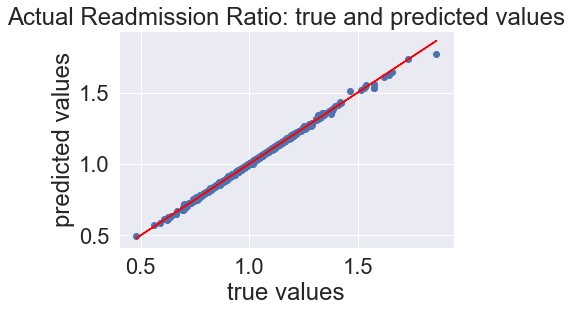

In [171]:
X_test = sm.add_constant(X_test)

# predictions 
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color='red')
plt.xlabel('true values')
plt.ylabel('predicted values')
plt.title('Actual Readmission Ratio: true and predicted values')


print('Mean absolute error of the prediction is: {}'.format(mean_absolute_error(y_test, y_preds)))
print('Mean squared error of the prediction is: {}'.format(mse(y_test, y_preds)))
print('Root mean squared error of the prediction is: {}'.format(rmse(y_test, y_preds)))
print('Mean absolute percentage error of the prediction is: {}'.format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

#### evaluation:
The model is clearly overfitting with R^2 values of 0.999 even after running a train/test. The scatter plot shows nearly all values directly o the prediction line. 
Many of the features have p-values >0.05, indicating that they are not significant. Will remove features that are not significant and check dataframe for duplicate rows. 

In [168]:
#double-check for duplicate rows
hosp_readmin_df.duplicated(subset=None, keep='first')

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
12      False
13      False
14      False
16      False
17      False
18      False
20      False
21      False
22      False
23      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
        ...  
6415    False
6416    False
6417    False
6418    False
6419    False
6420    False
6421    False
6422    False
6423    False
6424    False
6425    False
6426    False
6427    False
6428    False
6429    False
6431    False
6433    False
6439    False
6440    False
6441    False
6444    False
6445    False
6446    False
6447    False
6449    False
6450    False
6456    False
6457    False
6461    False
6463    False
Length: 5039, dtype: bool

#### adjust/remove features

##### drop features with p > 0.1;  will keep states & geographical classification for this round. 

'Readmission national comparison_Below the national average',
'Patient experience national comparison_Below the national average',
'Efficient use of medical imaging national comparison_Not Available',
'Safety of care national comparison_Not Available',
'Timeliness of care national comparison_Below the national average',
'Timeliness of care national comparison_Same as the national average',
'Effectiveness of care national comparison_Below the national average',
'Efficient use of medical imaging national comparison_Same as the national average',
'Mortality national comparison_Below the national average',
'Patient experience national comparison_Same as the national average',
'Effectiveness of care national comparison_Same as the national average',
'Safety of care national comparison_Below the national average',
'Safety of care national comparison_Same as the national average',
'Mortality national comparison_Not Available',
'Efficient use of medical imaging national comparison_Below the national average',
'Hospital Ownership_Government - State',
'Hospital Ownership_Government - Hospital District or Authority',
'Denominator_30d_mort',
'rn_comm_LINEAR',
'rn_comm_STAR',
'meds_LINEAR',
'meds_STAR',
'transition_LINEAR',
'transition_STAR',
'Overall_STAR'

In [172]:
#combine (rather than drop) features with higher p >0.1 but closely related to feature with 
#p-value <0.1

hosp_readmin_df['Score_30d_readm_mort'] = hosp_readmin_df['Score_30d_readm'] * hosp_readmin_df['Score_30d_mort'] 
hosp_readmin_df['Hospital overall rating_4_5'] = hosp_readmin_df['Hospital overall rating_5'] * hosp_readmin_df['Hospital overall rating_4']
hosp_readmin_df['Hospital overall rating_2_3'] = hosp_readmin_df['Hospital overall rating_2'] * hosp_readmin_df[ 'Hospital overall rating_3']

In [173]:
#remove target = 'actual_rratio_30d_HRRP' from features
features2 = ['Hospital overall rating_4_5', 'Hospital overall rating_2_3',
            'Score_30d_readm_mort', 'Hospital Ownership_Proprietary',
             'Hospital Ownership_Voluntary non-profit - Private', 
             'Hospital Ownership_Voluntary non-profit - Church', 
             'Hospital Ownership_Voluntary non-profit - Other', 
             'Hospital Ownership_Government - Local', 
             'Emergency Services_Yes', 
             'Hospital Ownership_Physician',  
             'Readmission national comparison_Same as the national average',
             'State_AL', 'State_AR', 'State_AZ', 'State_CA', 'State_CO', 
             'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA', 
             'State_HI', 'State_IA', 'State_ID', 'State_IL', 'State_IN',
             'State_KS', 'State_KY', 'State_LA', 'State_MA', 'State_MD', 
             'State_ME', 'State_MI', 'State_MN', 'State_MO', 'State_MS', 
             'State_MT', 'State_NC', 'State_ND', 'State_NE', 'State_NH', 
             'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH', 
             'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 
             'State_SD', 'State_TN', 'State_TX', 'State_UT', 'State_VA', 
             'State_VT', 'State_WA', 'State_WI', 'State_WV', 'State_WY',
             'Large fringe metro', 'Medium metro', 'Small metro', 
             'Micropolitan', 'Noncore', 'Denominator_30d_readm', 
             'Lower Estimate_30d_readm', 'Higher Estimate_30d_readm', 
             'Number of Discharges_30d_HRRP', 'Excess Readmission Ratio_30d_HRRP', 
             'Predicted Readmission Rate_30d_HRRP', 'Expected Readmission Rate_30d_HRRP', 
             'Number of Readmissions_30d_HRRP', 'actual_rrate_30d_HRRP', 
             'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort', 
             'dr_comm_LINEAR', 'dr_comm_STAR', 'discharge_LINEAR', 'discharge_STAR',
             'Overall_LINEAR', 'Summary_STAR']

In [174]:
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features2]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [175]:
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())

                              OLS Regression Results                              
Dep. Variable:     actual_rratio_30d_HRRP   R-squared:                       0.999
Model:                                OLS   Adj. R-squared:                  0.999
Method:                     Least Squares   F-statistic:                 8.111e+04
Date:                    Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                            10:58:11   Log-Likelihood:                 16735.
No. Observations:                    4031   AIC:                        -3.331e+04
Df Residuals:                        3949   BIC:                        -3.279e+04
Df Model:                              81                                         
Covariance Type:                nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

C:\Users\katec\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


Mean absolute error of the prediction is: 0.0022479498101130786
Mean squared error of the prediction is: 2.7881821830847437e-05
Root mean squared error of the prediction is: 0.005280324027069498
Mean absolute percentage error of the prediction is: 0.22017933374532347


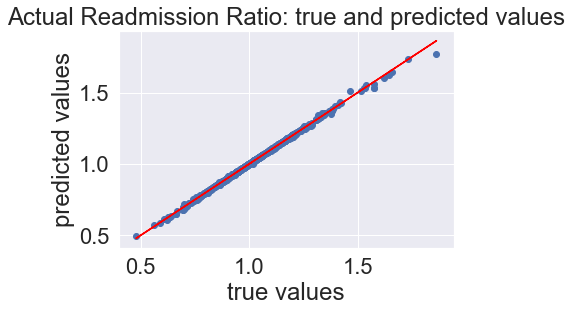

In [176]:
X_test = sm.add_constant(X_test)

# predictions 
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color='red')
plt.xlabel('true values')
plt.ylabel('predicted values')
plt.title('Actual Readmission Ratio: true and predicted values')


print('Mean absolute error of the prediction is: {}'.format(mean_absolute_error(y_test, y_preds)))
print('Mean squared error of the prediction is: {}'.format(mse(y_test, y_preds)))
print('Root mean squared error of the prediction is: {}'.format(rmse(y_test, y_preds)))
print('Mean absolute percentage error of the prediction is: {}'.format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

#### evaluation:
The model continues to overfit with R^2 values remaining at 0.999. The scatter plot continues to show nearly all values directly o the prediction line. 
Remove features have p-values >0.1 and combine the geographical classifications, which may still show some significance. 

##### drop
'Hospital Ownership_Voluntary non-profit - Church',
'Hospital Ownership_Physician', 
'Higher Estimate_30d_readm',
'Overall_LINEAR',
'Summary_STAR',
ALL States

In [177]:
#combine
hosp_readmin_df['Non_metro'] = hosp_readmin_df['Micropolitan'] * hosp_readmin_df['Noncore'] 

hosp_readmin_df['lg_fringe_med_metro'] = hosp_readmin_df['Large fringe metro'] * hosp_readmin_df['Medium metro']

In [178]:
#remove target = 'actual_rratio_30d_HRRP' from features
features3 = ['Hospital overall rating_4_5', 'Hospital overall rating_2_3',
             'Score_30d_readm_mort', 'Hospital Ownership_Proprietary',
             'Hospital Ownership_Voluntary non-profit - Private',
             'Hospital Ownership_Voluntary non-profit - Other',
             'Hospital Ownership_Government - Local', 
             'Emergency Services_Yes',
             'Readmission national comparison_Same as the national average',
             'lg_fringe_med_metro', 'Small metro', 
             'Non_metro', 'Denominator_30d_readm', 
             'Lower Estimate_30d_readm', 
             'Number of Discharges_30d_HRRP', 
             'Excess Readmission Ratio_30d_HRRP', 
             'Predicted Readmission Rate_30d_HRRP', 
             'Expected Readmission Rate_30d_HRRP', 
             'Number of Readmissions_30d_HRRP', 'actual_rrate_30d_HRRP', 
             'Lower Estimate_30d_mort', 'Higher Estimate_30d_mort', 
             'dr_comm_LINEAR', 'dr_comm_STAR', 
             'discharge_LINEAR', 'discharge_STAR']

In [179]:
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features3]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [180]:
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())

                              OLS Regression Results                              
Dep. Variable:     actual_rratio_30d_HRRP   R-squared:                       0.999
Model:                                OLS   Adj. R-squared:                  0.999
Method:                     Least Squares   F-statistic:                 2.981e+05
Date:                    Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                            11:09:47   Log-Likelihood:                 16701.
No. Observations:                    4031   AIC:                        -3.336e+04
Df Residuals:                        4008   BIC:                        -3.321e+04
Df Model:                              22                                         
Covariance Type:                nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

C:\Users\katec\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


Mean absolute error of the prediction is: 0.0021623278073275207
Mean squared error of the prediction is: 2.7852709998455062e-05
Root mean squared error of the prediction is: 0.005277566673994281
Mean absolute percentage error of the prediction is: 0.21187821290582315


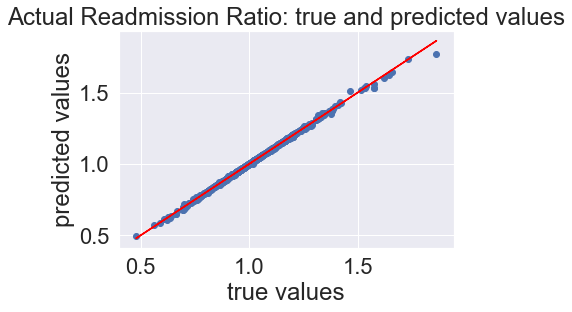

In [181]:
X_test = sm.add_constant(X_test)

# predictions 
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color='red')
plt.xlabel('true values')
plt.ylabel('predicted values')
plt.title('Actual Readmission Ratio: true and predicted values')


print('Mean absolute error of the prediction is: {}'.format(mean_absolute_error(y_test, y_preds)))
print('Mean squared error of the prediction is: {}'.format(mse(y_test, y_preds)))
print('Root mean squared error of the prediction is: {}'.format(rmse(y_test, y_preds)))
print('Mean absolute percentage error of the prediction is: {}'.format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

#### evaluation:
The model continues to overfit with R^2 values remaining at 0.999. The scatter plot continues to show nearly all values directly o the prediction line. 
Remove features have p-values >0.1 and combine the geographical classifications, which may still show some significance. 

##### drop
'Hospital Ownership_Proprietary',
'Hospital Ownership_Voluntary non-profit - Other',

removed 'actual_rrate_30d_HRRP' which I suspect is causing the gross overfitting; 

all remaining features with significant p-values except for states

In [182]:
#remove target = 'actual_rratio_30d_HRRP' from features
features4 = ['Hospital overall rating_4_5', 'Hospital overall rating_2_3',
             'Score_30d_readm_mort',  
             'Emergency Services_Yes',
             'lg_fringe_med_metro', 'Small metro', 
             'Non_metro', 'Denominator_30d_readm', 
             'Lower Estimate_30d_readm', 
             'Number of Discharges_30d_HRRP', 
             'Number of Readmissions_30d_HRRP', 
             'Predicted Readmission Rate_30d_HRRP', 
             'Expected Readmission Rate_30d_HRRP',  
             'Lower Estimate_30d_mort', 
             'dr_comm_LINEAR', 
             'discharge_LINEAR', 'discharge_STAR']

In [183]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

In [184]:
#train/test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [185]:
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())

                              OLS Regression Results                              
Dep. Variable:     actual_rratio_30d_HRRP   R-squared:                       0.876
Model:                                OLS   Adj. R-squared:                  0.876
Method:                     Least Squares   F-statistic:                     2188.
Date:                    Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                            11:15:54   Log-Likelihood:                 5996.1
No. Observations:                    4031   AIC:                        -1.196e+04
Df Residuals:                        4017   BIC:                        -1.188e+04
Df Model:                              13                                         
Covariance Type:                nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

C:\Users\katec\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


Mean absolute error of the prediction is: 0.03490027037531688
Mean squared error of the prediction is: 0.003923635149089057
Root mean squared error of the prediction is: 0.06263892678749419
Mean absolute percentage error of the prediction is: 3.478248033010383


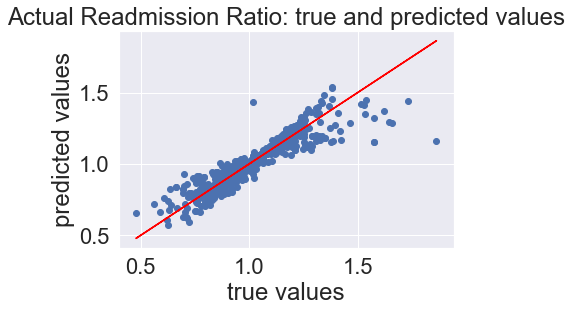

In [186]:
X_test = sm.add_constant(X_test)

# predictions 
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color='red')
plt.xlabel('true values')
plt.ylabel('predicted values')
plt.title('Actual Readmission Ratio: true and predicted values')

print('Mean absolute error of the prediction is: {}'.format(mean_absolute_error(y_test, y_preds)))
print('Mean squared error of the prediction is: {}'.format(mse(y_test, y_preds)))
print('Root mean squared error of the prediction is: {}'.format(rmse(y_test, y_preds)))
print('Mean absolute percentage error of the prediction is: {}'.format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

#### evaluation of final feature set (features4)

**train**:
R-squared:                       0.876
Adj. R-squared:                  0.876

**test**:
Mean absolute error of the prediction is: 0.03490027037531688
Mean squared error of the prediction is: 0.003923635149089057
Root mean squared error of the prediction is: 0.06263892678749419
Mean absolute percentage error of the prediction is: 3.478248033010383

The model with the features4 set performs more realistically compared to other feature sets, but still well per R-sq paramenters. The main concern regarding this model remains overfitting. All non-significant features have been removed. Perhaps most importantly, the 'actual_rrate_30d_HRRP' metric, which was included in features versions 1-3, has been removed. This appears to have corrected the extreme overfitting of the first 3 model versions. 

### running models post final feature selection

#### Linear Regression

In [187]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

#split with 20% for test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

alphas = [np.power(10.0,p) for p in np.arange(-10,40,1)]

In [188]:
# fit an OLS model 
lrm = linear_model.LinearRegression()
lrm.fit(X_train, y_train)


# predictions 
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)

#save results for comparison
R_sq_train = lrm.score(X_train, y_train)
R_sq_test = lrm.score(X_test, y_test)
MAE = mean_absolute_error(y_test, y_preds_test)
MSE = mse(y_test, y_preds_test)
RMSE = rmse(y_test, y_preds_test)
MAPE = np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100


print('R-squared of the model in the training set is: {}'.format(R_sq_train))
print('-----Test set statistics-----')
print('R-squared of the model in the test set is: {}'.format(R_sq_test))
print('Mean absolute error of the prediction is: {}'.format(MAE))
print('Mean squared error of the prediction is: {}'.format(MSE))
print('Root mean squared error of the prediction is: {}'.format(RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(MAPE))

R-squared of the model in the training set is: 0.8762302531463538
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204835154769776
Mean absolute error of the prediction is: 0.03490027037531689
Mean squared error of the prediction is: 0.003923635149089057
Root mean squared error of the prediction is: 0.06263892678749419
Mean absolute percentage error of the prediction is: 3.478248033010381


#### cross validation

In [189]:
lrm_scores = cross_val_score(lrm, X, Y, cv=5)
print('Cross-validated scores:', lrm_scores)

predictions = cross_val_predict(lrm, X, Y, cv=5)
lrm_accuracy = metrics.r2_score(Y, predictions)
print('Cross-Predicted Accuracy:', lrm_accuracy) 

Cross-validated scores: [0.86887762 0.87561176 0.83514254 0.85655785 0.86923094]
Cross-Predicted Accuracy: 0.8621439589178417


#### evaluation
At this point, it appears the problem of gross overfitting has been resolved with the removal of the feature 'actual_rrate_30d_HRRP' which was closely relataed to the target value 'actual_rratio_30d_HRRP'. The model's performance appears to be much more realistic.

Cross-validation scores appear to confirm the model's performance, with scores ranging between the R^2 train score and the R^2 test prediction. Will evaluate all 4 linear regression models together rather than separately. 

#### Lasso, RIdge, ElasticNet

In [190]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

#split with 20% for test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

alphas = [np.power(10.0,p) for p in np.arange(-10,40,1)]

In [191]:
from sklearn.linear_model import LassoCV

lasso_cv = LassoCV(alphas=alphas, cv=20) 
lasso_cv.fit(X_train, y_train)

# We are making predictions here
y_preds_train = lasso_cv.predict(X_train)
y_preds_test = lasso_cv.predict(X_test)

#save results for comparison
lcv_R_sq_train = lasso_cv.score(X_train, y_train)
lcv_R_sq_test = lasso_cv.score(X_test, y_test)
lcv_MAE = mean_absolute_error(y_test, y_preds_test)
lcv_MSE = mse(y_test, y_preds_test)
lcv_RMSE = rmse(y_test, y_preds_test)
lcv_MAPE = np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100

print('Best alpha value is: {}'.format(lasso_cv.alpha_))
print('R-squared of the model in the training set is: {}'.format(lcv_R_sq_train))
print('-----Test set statistics-----')
print('R-squared of the model in the test set is: {}'.format(lcv_R_sq_test))
print('Mean absolute error of the prediction is: {}'.format(lcv_MAE))
print('Mean squared error of the prediction is: {}'.format(lcv_MSE))
print('Root mean squared error of the prediction is: {}'.format(lcv_RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(lcv_MAPE))

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

Best alpha value is: 1e-06
R-squared of the model in the training set is: 0.8762302422585817
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204867020797592
Mean absolute error of the prediction is: 0.03489824617017991
Mean squared error of the prediction is: 0.003923565500517711
Root mean squared error of the prediction is: 0.06263837083224397
Mean absolute percentage error of the prediction is: 3.4780517775547


In [192]:
lcv_scores = cross_val_score(lasso_cv, X, Y, cv=5)


predictions = cross_val_predict(lasso_cv, X, Y, cv=5)
lcv_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', lcv_scores)
print('Cross-Predicted Accuracy:', lcv_accuracy) 

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

Cross-validated scores: [0.86882673 0.87571806 0.83527659 0.85666497 0.86901424]
Cross-Predicted Accuracy: 0.8621577172345092


C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [193]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

#split with 20% for test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

alphas = [np.power(10.0,p) for p in np.arange(-10,40,1)]

In [194]:
from sklearn.linear_model import ElasticNetCV

elastic_cv = ElasticNetCV(alphas=alphas, cv=6) 
elastic_cv.fit(X_train, y_train)

# predictions 
y_preds_train = elastic_cv.predict(X_train)
y_preds_test = elastic_cv.predict(X_test)

#save results for comparison
ecv_R_sq_train = elastic_cv.score(X_train, y_train)
ecv_R_sq_test = elastic_cv.score(X_test, y_test)
ecv_MAE = mean_absolute_error(y_test, y_preds_test)
ecv_MSE = mse(y_test, y_preds_test)
ecv_RMSE = rmse(y_test, y_preds_test)
ecv_MAPE = np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100


print('Best alpha value is: {}'.format(elastic_cv.alpha_))
print('R-squared of the model in the training set is: {}'.format(ecv_R_sq_train))
print('-----Test set statistics-----')
print('R-squared of the model in the test set is: {}'.format(ecv_R_sq_test))
print('Mean absolute error of the prediction is: {}'.format(ecv_MAE))
print('Mean squared error of the prediction is: {}'.format(ecv_MSE))
print('Root mean squared error of the prediction is: {}'.format(ecv_RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(ecv_MAPE))

Best alpha value is: 1e-06
R-squared of the model in the training set is: 0.8762302450980242
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204844551365251
Mean absolute error of the prediction is: 0.03489921213577215
Mean squared error of the prediction is: 0.003923614611246869
Root mean squared error of the prediction is: 0.06263876284894897
Mean absolute percentage error of the prediction is: 3.4781562841963556


C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

In [195]:
ecv_scores = cross_val_score(elastic_cv, X, Y, cv=5)


predictions = cross_val_predict(elastic_cv, X, Y, cv=5)
ecv_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', ecv_scores)
print('Cross-Predicted Accuracy:', ecv_accuracy)

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

Cross-validated scores: [0.86805006 0.8755119  0.83621214 0.85662009 0.86758755]
Cross-Predicted Accuracy: 0.8618252173742669


C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increa

In [196]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

#split with 20% for test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

alphas = [np.power(10.0,p) for p in np.arange(-10,40,1)]

In [197]:
from sklearn.linear_model import RidgeCV

# Fitting a ridge regression model. Alpha is the regularization
# parameter (usually called lambda). As alpha gets larger, parameter
# shrinkage grows more pronounced.
ridge_cv = RidgeCV(alphas=alphas, cv=5)
ridge_cv.fit(X_train, y_train)

# We are making predictions here
y_preds_train = ridge_cv.predict(X_train)
y_preds_test = ridge_cv.predict(X_test)

#save results for comparison
rcv_R_sq_train = ridge_cv.score(X_train, y_train)
rcv_R_sq_test = ridge_cv.score(X_test, y_test)
rcv_MAE = mean_absolute_error(y_test, y_preds_test)
rcv_MSE = mse(y_test, y_preds_test)
rcv_RMSE = rmse(y_test, y_preds_test)
rcv_MAPE = np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100


print('Best alpha value is: {}'.format(ridge_cv.alpha_))
print('R-squared of the model in the training set is: {}'.format(rcv_R_sq_train))
print('-----Test set statistics-----')
print('R-squared of the model in the test set is: {}'.format(rcv_R_sq_test))
print('Mean absolute error of the prediction is: {}'.format(rcv_MAE))
print('Mean squared error of the prediction is: {}'.format(rcv_MSE))
print('Root mean squared error of the prediction is: {}'.format(rcv_RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(rcv_MAPE))

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.42885e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.45092e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.48512e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.37251e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.43795e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\r

Best alpha value is: 1.0
R-squared of the model in the training set is: 0.8762296345531291
-----Test set statistics-----
R-squared of the model in the test set is: 0.8205040318074335
Mean absolute error of the prediction is: 0.03488040094278457
Mean squared error of the prediction is: 0.003923186730128976
Root mean squared error of the prediction is: 0.06263534728992069
Mean absolute percentage error of the prediction is: 3.476009731580248


In [198]:
rcv_scores = cross_val_score(ridge_cv, X, Y, cv=5)


predictions = cross_val_predict(ridge_cv, X, Y, cv=5)
rcv_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', rcv_scores)
print('Cross-Predicted Accuracy:', rcv_accuracy)

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.33648e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.52037e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.53496e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.37247e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.34935e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\r

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.45177e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.43129e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.5674e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.47166e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.40131e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ri

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.32099e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.44916e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.43748e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.30189e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.28152e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\r

C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.34366e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.3255e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.44131e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.45387e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:125: LinAlgWarning: Ill-conditioned matrix (rcond=1.31459e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\linear_model\ri

Cross-validated scores: [0.86870835 0.87520317 0.83533197 0.85665741 0.8685049 ]
Cross-Predicted Accuracy: 0.8619395224056723


In [199]:
lrm_scores = lrm_scores.mean()
lcv_scores = lcv_scores.mean()
ecv_scores = ecv_scores.mean()
rcv_scores = rcv_scores.mean()

#### evaluate  best model on the test set

In [200]:
# initialise data of lists. 
data = {'M1_lrm':[R_sq_train, R_sq_test, MAE, MSE, RMSE, MAPE, lrm_accuracy, lrm_scores], 'M1_lcv':[lcv_R_sq_train, lcv_R_sq_test, lcv_MAE, lcv_MSE, lcv_RMSE, lcv_MAPE, lcv_accuracy, lcv_scores],
       'M1_rcv': [rcv_R_sq_train, rcv_R_sq_test, rcv_MAE, rcv_MSE, rcv_RMSE, rcv_MAPE, rcv_accuracy, rcv_scores], 'M1_ecv': [ecv_R_sq_train, ecv_R_sq_test, ecv_MAE, ecv_MSE, ecv_RMSE, ecv_MAPE, ecv_accuracy, ecv_scores]} 
  
# Creates pandas DataFrame. 
model_stats_compare = pd.DataFrame(data, index =['R_sq_train', 'R_sq_test', 'MAE', 'MSE', 'RMSE','MAPE', 'R_sq_CV', 'CV_scores']) 
  
# print the data 
model_stats_compare

,M1_lrm,M1_lcv,M1_rcv,M1_ecv
R_sq_train,0.876230,0.876230,0.876230,0.876230
R_sq_test,0.820484,0.820487,0.820504,0.820484
MAE,0.034900,0.034898,0.034880,0.034899
MSE,0.003924,0.003924,0.003923,0.003924
RMSE,0.062639,0.062638,0.062635,0.062639
MAPE,3.478248,3.478052,3.476010,3.478156
R_sq_CV,0.862144,0.862158,0.861940,0.861825
CV_scores,0.861084,0.861100,0.860881,0.860796


### evaluate linear regression models

The models appears to perform equally well across all model versions with only very small differences in the above metrics.  When comparing the train/test metric results closely, it appears the RCV performed better with a higher R_sq_test score. The RCV model also had the lowest MAE, MSE, RMSE and MAPE scores. Although the differences between the models is very small, overall the RCV appears to be the better performing model. 

After performing cross-validation on the models, the LCV reported the higher R_sq score and the highest cross-validation scores(mean). 

The test set performs slightly worse than the train set in all models. Although the R_sq of both train and test is relatively high, suggesting overfitting, the cross-validation scores are now in-line with the train/test scores, showing that the extreme overfitting of the first 3 feature sets has been corrected (see above). 


### linear regression (features4)
R-squared of the model in the training set is: 0.8762302531463538
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204835154769776
Mean absolute error of the prediction is: 0.03490027037531689
Mean squared error of the prediction is: 0.003923635149089057
Root mean squared error of the prediction is: 0.06263892678749419
Mean absolute percentage error of the prediction is: 3.478248033010381
#### cross validation
Cross-validated scores: [0.86887762 0.87561176 0.83514254 0.85655785 0.86923094]
Cross-Predicted Accuracy: 0.8621439589178417

### Lasso 
Best alpha value is: 1e-06
R-squared of the model in the training set is: 0.8762302422585817
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204867020797592
Mean absolute error of the prediction is: 0.03489824617017991
Mean squared error of the prediction is: 0.003923565500517711
Root mean squared error of the prediction is: 0.06263837083224397
Mean absolute percentage error of the prediction is: 3.4780517775547
#### cross validation
Cross-validated scores: [0.86882673 0.87571806 0.83527659 0.85666497 0.86901424]
Cross-Predicted Accuracy: 0.8621577172345092

### ElasticNetCV
Best alpha value is: 1e-06
R-squared of the model in the training set is: 0.8762302450980242
-----Test set statistics-----
R-squared of the model in the test set is: 0.8204844551365251
Mean absolute error of the prediction is: 0.03489921213577215
Mean squared error of the prediction is: 0.003923614611246869
Root mean squared error of the prediction is: 0.06263876284894897
Mean absolute percentage error of the prediction is: 3.4781562841963556
#### cross validation
Cross-validated scores: [0.86805006 0.8755119  0.83621214 0.85662009 0.86758755]
Cross-Predicted Accuracy: 0.8618252173742669

### RidgeCV
Best alpha value is: 1.0
R-squared of the model in the training set is: 0.8762296345531291
-----Test set statistics-----
R-squared of the model in the test set is: 0.8205040318074335
Mean absolute error of the prediction is: 0.03488040094278457
Mean squared error of the prediction is: 0.003923186730128976
Root mean squared error of the prediction is: 0.06263534728992069
Mean absolute percentage error of the prediction is: 3.476009731580248
#### cross validation
Cross-validated scores: [0.86870835 0.87520317 0.83533197 0.85665741 0.8685049 ]
Cross-Predicted Accuracy: 0.8619395224056723

## knn regression

In [201]:
from sklearn import neighbors
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

In [202]:
#add target = 'actual_rratio_30d_HRRP' to features
features5 = ['Hospital overall rating_4_5', 'Hospital overall rating_2_3',
             'Score_30d_readm_mort',  
             'Emergency Services_Yes',
             'lg_fringe_med_metro', 'Small metro', 
             'Non_metro', 'Denominator_30d_readm', 
             'Lower Estimate_30d_readm', 
             'Number of Discharges_30d_HRRP', 
             'Number of Readmissions_30d_HRRP', 
             'Predicted Readmission Rate_30d_HRRP', 
             'Expected Readmission Rate_30d_HRRP',  
             'Lower Estimate_30d_mort', 
             'dr_comm_LINEAR', 
             'discharge_LINEAR', 'discharge_STAR', 'actual_rratio_30d_HRRP']

In [203]:
from sklearn.model_selection import train_test_split


knn = neighbors.KNeighborsRegressor(n_neighbors=10)

X = hosp_readmin_df[features4]
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
hosp_readmin_knn = hosp_readmin_df[features5]


train , test = train_test_split(hosp_readmin_knn, test_size = 0.3)

x_train = train.drop('actual_rratio_30d_HRRP', axis=1)
y_train = train['actual_rratio_30d_HRRP']

x_test = test.drop('actual_rratio_30d_HRRP', axis=1)
y_test = test['actual_rratio_30d_HRRP']

In [204]:
# Run the model, without weights.
knn.fit(x_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=10, p=2,
          weights='uniform')

In [205]:
# Run the model, with weights.
knn_w = neighbors.KNeighborsRegressor(n_neighbors=10, weights='distance')


knn_w.fit(x_train, y_train)


KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=10, p=2,
          weights='distance')

In [206]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(knn, X, Y, cv=5)
print("Unweighted Accuracy: %0.2f (+/- %0.2f)" % (score.mean(), score.std() * 2))
score_w = cross_val_score(knn_w, X, Y, cv=5)
print("Weighted Accuracy: %0.2f (+/- %0.2f)" % (score_w.mean(), score_w.std() * 2))

Unweighted Accuracy: 0.46 (+/- 0.06)
Weighted Accuracy: 0.49 (+/- 0.06)


###### the model performs better with weighted values

In [207]:
#choosig k value
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K, weights='distance')

    model.fit(x_train, y_train)  #fit the model
    pred=model.predict(x_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 0.09307173876407705
RMSE value for k=  2 is: 0.0843862352578955
RMSE value for k=  3 is: 0.08239622508076667
RMSE value for k=  4 is: 0.08265094775908394
RMSE value for k=  5 is: 0.08221638050050104
RMSE value for k=  6 is: 0.08228404979957334
RMSE value for k=  7 is: 0.08354109352010579
RMSE value for k=  8 is: 0.08444251616990851
RMSE value for k=  9 is: 0.08390291872744393
RMSE value for k=  10 is: 0.08371439475796684
RMSE value for k=  11 is: 0.08418262806604905
RMSE value for k=  12 is: 0.08480345591410018
RMSE value for k=  13 is: 0.08524459343599874
RMSE value for k=  14 is: 0.08576087521647632
RMSE value for k=  15 is: 0.08625995332108365
RMSE value for k=  16 is: 0.08675005262287026
RMSE value for k=  17 is: 0.08717412545629685
RMSE value for k=  18 is: 0.08751638878417757
RMSE value for k=  19 is: 0.08815672614218052
RMSE value for k=  20 is: 0.08852837003398271


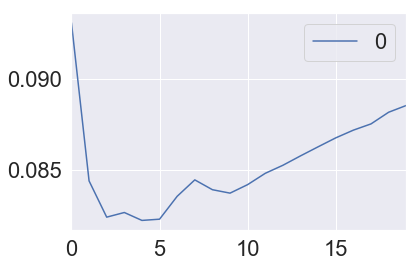

In [208]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

###### there is no clear 'elbow' to the graph to choose K value; will try with both K = 10 and K = 5 (which is the more obvious choice)

In [209]:
K = 10
model = neighbors.KNeighborsRegressor(n_neighbors = K, weights='distance')
model.fit(x_train, y_train)  #fit the model
error_train = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
rmse_val.append(error) #store rmse values

In [210]:
knn_train_R_sq = model.score(x_train, y_train) 
knn_test_R_sq = model.score(x_test, y_test) 
print('R_sq_train value for k= ' , K , 'is:', knn_train_R_sq)
print('R_sq_test value for k= ' , K , 'is:', knn_test_R_sq)
print('RMSE value for k= ' , K , 'is:', error)

R_sq_train value for k=  10 is: 1.0
R_sq_test value for k=  10 is: 0.6978261666369723
RMSE value for k=  10 is: 0.08852837003398271


In [211]:
K = 5
model = neighbors.KNeighborsRegressor(n_neighbors = K, weights='distance')
model.fit(x_train, y_train)  #fit the model
error_test = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
rmse_val.append(error) #store rmse values


In [212]:
knn_train_R_sq = model.score(x_train, y_train) 
knn_test_R_sq = model.score(x_test, y_test) 
print('R_sq_train value for k= ' , K , 'is:', knn_train_R_sq)
print('R_sq_test value for k= ' , K , 'is:', knn_test_R_sq)
print('RMSE value for k= ' , K , 'is:', error)

R_sq_train value for k=  5 is: 1.0
R_sq_test value for k=  5 is: 0.7085438139055549
RMSE value for k=  5 is: 0.08852837003398271


In [213]:
knn_scores = cross_val_score(model, X, Y, cv=5)


predictions = cross_val_predict(model, X, Y, cv=5)
knn_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', knn_scores)
print('Cross-Predicted Accuracy:', knn_accuracy)

Cross-validated scores: [0.4547601  0.48808353 0.5069366  0.51142443 0.54080193]
Cross-Predicted Accuracy: 0.500677554244452


In [214]:
knn_scores = knn_scores.mean()

In [215]:
data2 = [knn_train_R_sq, knn_test_R_sq, 'Not Available', 'Not Available', error, 'Not Available', knn_accuracy, knn_scores] 
model_stats_compare['M1_knn'] = data2
model_stats_compare

,M1_lrm,M1_lcv,M1_rcv,M1_ecv,M1_knn
R_sq_train,0.876230,0.876230,0.876230,0.876230,1
R_sq_test,0.820484,0.820487,0.820504,0.820484,0.708544
MAE,0.034900,0.034898,0.034880,0.034899,Not Available
MSE,0.003924,0.003924,0.003923,0.003924,Not Available
RMSE,0.062639,0.062638,0.062635,0.062639,0.0885284
MAPE,3.478248,3.478052,3.476010,3.478156,Not Available
R_sq_CV,0.862144,0.862158,0.861940,0.861825,0.500678
CV_scores,0.861084,0.861100,0.860881,0.860796,0.500401


### evaluate 
Using the values available (R-sq train & test, RMSE, and cross-validation scores), the KNN model appears to underperform all the linear models with lower R-sq values for both train and test. The cross-validation scores are much lower than those of the linear models. It is also grossly overfitting on the train set. In general, the linear regression models are a better choice than KNN for this data.  

### decision trees

In [216]:
from sklearn import tree
from IPython.display import Image
import pydotplus
import graphviz
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

R^2: 0.8534491865680269


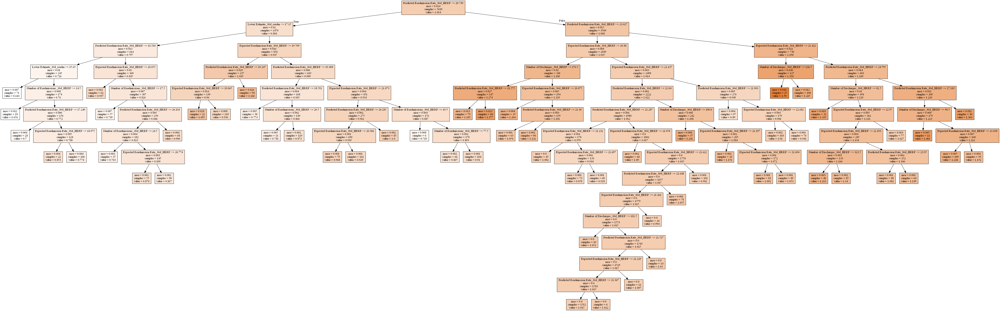

In [217]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

dtr = tree.DecisionTreeRegressor(min_samples_split=.025)
dtr.fit(X,Y)

#Get and store predicted values.
pred = dtr.predict(X)
M1_dtr = dtr.score(X, Y)
dtr_model_score = model.score(X, Y)

print('R^2: {}'.format(dtr.score(X, Y)))

dot_data = tree.export_graphviz(dtr, out_file=None,
                                feature_names=X.columns,  
                                filled=True) 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())  

In [218]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

dtr.fit(X_train, Y_train)
Y_pred = dtr.predict(X_train)

#Get and store predicted values.
pred_train = dtr.predict(X_train)
dtr_R_sq_train = dtr.score(X_train, Y_train)
model_score_train = model.score(X_train, Y_train)
dtr_cv = cross_val_score(dtr, X_train, Y_train, cv=10)

print('R^2_train: {}'.format(dtr.score(X_train, Y_train)))
print('Cross Validation Score train:',cross_val_score(dtr, X_train, Y_train, cv=10))


R^2_train: 0.85860979467674
Cross Validation Score train: [0.82930334 0.78276344 0.7653989  0.84393095 0.80160326 0.78069089
 0.80963882 0.82276551 0.79498518 0.75924324]


In [219]:
#Get and store predicted values.
Y_pred_test = dtr.predict(X_test)
M1_dtr_test = dtr.score(X_test, Y_test)
model_score = model.score(X_test, Y_test)

#save results for comparison
dtr_R_sq_test = dtr.score(X_test, Y_test)
dtr_MAE = mean_absolute_error(Y_test, Y_pred_test)
dtr_MSE = mse(Y_test, Y_pred_test)
dtr_RMSE = rmse(Y_test, Y_pred_test)
dtr_MAPE = np.mean(np.abs((Y_test - Y_pred_test) / Y_test)) * 100

print('R^2_test: {}'.format(dtr.score(X_test, Y_test)))
print('Cross Validation Score test:',cross_val_score(dtr, X_test, Y_test, cv=10))
print('Mean absolute error of the prediction is: {}'.format(dtr_MAE))
print('Mean squared error of the prediction is: {}'.format(dtr_MSE))
print('Root mean squared error of the prediction is: {}'.format(dtr_RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(dtr_MAPE))

R^2_test: 0.8052883401417443
Cross Validation Score test: [ 0.73009439  0.8230932   0.82395529  0.47998825  0.79874281  0.80898967
  0.7557098   0.7091246  -0.02527581  0.76203835]
Mean absolute error of the prediction is: 0.038648183400636055
Mean squared error of the prediction is: 0.005170393841326969
Root mean squared error of the prediction is: 0.07190545070665345
Mean absolute percentage error of the prediction is: 3.9091214420219353


In [220]:
dtr_scores = cross_val_score(dtr, X, Y, cv=5)


predictions = cross_val_predict(dtr, X, Y, cv=5)
dtr_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', dtr_scores)
print('Cross-Predicted Accuracy:', dtr_accuracy)

Cross-validated scores: [0.7843242  0.69253677 0.73977996 0.75977652 0.80863694]
Cross-Predicted Accuracy: 0.7582850632019097


In [221]:
dtr_scores = dtr_scores.mean()

In [222]:
data3 = [dtr_R_sq_train, dtr_R_sq_test, dtr_MAE, dtr_MSE, dtr_RMSE, dtr_MAPE, dtr_accuracy, dtr_scores] 
model_stats_compare['M1_dtr'] = data3
model_stats_compare

,M1_lrm,M1_lcv,M1_rcv,M1_ecv,M1_knn,M1_dtr
R_sq_train,0.876230,0.876230,0.876230,0.876230,1,0.858610
R_sq_test,0.820484,0.820487,0.820504,0.820484,0.708544,0.805288
MAE,0.034900,0.034898,0.034880,0.034899,Not Available,0.038648
MSE,0.003924,0.003924,0.003923,0.003924,Not Available,0.005170
RMSE,0.062639,0.062638,0.062635,0.062639,0.0885284,0.071905
MAPE,3.478248,3.478052,3.476010,3.478156,Not Available,3.909121
R_sq_CV,0.862144,0.862158,0.861940,0.861825,0.500678,0.758285
CV_scores,0.861084,0.861100,0.860881,0.860796,0.500401,0.757011


### evaluate 
The DTR model appears to underperform all the linear models with lower R-sq values for both train/test and cross-validation scores. The error scores are also higher than those of the linear models. In general, the linear regression models are a better choice than DTR for this data.  

### random forest

In [223]:
from sklearn import ensemble

In [224]:
# Y is the target variable
Y = hosp_readmin_df['actual_rratio_30d_HRRP']
# X is the feature set 
X = hosp_readmin_df[features4]

rfr = ensemble.RandomForestRegressor()
rfr.fit(X, Y)

#Get and store predicted values.
y_pred = rfr.predict(X)
M1_rfr = rfr.score(X, Y)
rfr_model_score = model.score(X, Y)

print('R^2: {}'.format(rfr.score(X, Y)))
print('Cross Validation Score:',cross_val_score(rfr, X, Y, cv=10))



C:\Users\katec\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


R^2: 0.9934732186892777
Cross Validation Score: [0.93204154 0.95933966 0.97035762 0.88712336 0.8848126  0.95892058
 0.90252275 0.94284843 0.9474878  0.96303378]


In [225]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

rfr.fit(X_train, Y_train)
Y_pred = rfr.predict(X_train)

#Get and store predicted values.
pred_train = rfr.predict(X_train)
rfr_R_sq_train = rfr.score(X_train, Y_train)
model_score_train = model.score(X_train, Y_train)

print('R^2: {}'.format(rfr.score(X_train, Y_train)))
print('Cross Validation Score:',cross_val_score(rfr, X_train, Y_train, cv=10))


R^2: 0.9934157376034698
Cross Validation Score: [0.9715895  0.94344485 0.97354165 0.97123671 0.95682895 0.97079159
 0.97783109 0.96064414 0.975833   0.97382561]


In [226]:

#Get and store predicted values.
Y_pred_test = rfr.predict(X_test)
M1_rfr_test = rfr.score(X_test, Y_test)
model_score = model.score(X_test, Y_test)

#save results for comparison

rfr_R_sq_test = rfr.score(X_test, Y_test)
rfr_MAE = mean_absolute_error(Y_test, Y_pred_test)
rfr_MSE = mse(Y_test, Y_pred_test)
rfr_RMSE = rmse(Y_test, Y_pred_test)
rfr_MAPE = np.mean(np.abs((Y_test - Y_pred_test) / Y_test)) * 100

print('R^2_test: {}'.format(rfr.score(X_test, Y_test)))
print('Cross Validation Score test:',cross_val_score(rfr, X_test, Y_test, cv=10))
print('Mean absolute error of the prediction is: {}'.format(rfr_MAE))
print('Mean squared error of the prediction is: {}'.format(rfr_MSE))
print('Root mean squared error of the prediction is: {}'.format(rfr_RMSE))
print('Mean absolute percentage error of the prediction is: {}'.format(rfr_MAPE))

R^2_test: 0.9369740201346798
Cross Validation Score test: [0.88767513 0.92192998 0.70993596 0.91317386 0.90304041 0.94387935
 0.78944258 0.83618892 0.82473705 0.82684727]
Mean absolute error of the prediction is: 0.012036793644035738
Mean squared error of the prediction is: 0.0014675244251308429
Root mean squared error of the prediction is: 0.03830828141708843
Mean absolute percentage error of the prediction is: 1.170244788887344


In [227]:
rfr_scores = cross_val_score(rfr, X, Y, cv=5)


predictions = cross_val_predict(rfr, X, Y, cv=5)
rfr_accuracy = metrics.r2_score(Y, predictions)

print('Cross-validated scores:', rfr_scores)
print('Cross-Predicted Accuracy:', rfr_accuracy)

Cross-validated scores: [0.92724747 0.92085063 0.9316032  0.91781454 0.95037856]
Cross-Predicted Accuracy: 0.9333687062983905


In [228]:
rfr_scores = rfr_scores.mean()

In [229]:
data4 = [rfr_R_sq_train, rfr_R_sq_test, rfr_MAE, dtr_MSE, rfr_RMSE, rfr_MAPE, rfr_accuracy, rfr_scores] 
model_stats_compare['M1_rfr'] = data4
model_stats_compare

,M1_lrm,M1_lcv,M1_rcv,M1_ecv,M1_knn,M1_dtr,M1_rfr
R_sq_train,0.876230,0.876230,0.876230,0.876230,1,0.858610,0.993416
R_sq_test,0.820484,0.820487,0.820504,0.820484,0.708544,0.805288,0.936974
MAE,0.034900,0.034898,0.034880,0.034899,Not Available,0.038648,0.012037
MSE,0.003924,0.003924,0.003923,0.003924,Not Available,0.005170,0.005170
RMSE,0.062639,0.062638,0.062635,0.062639,0.0885284,0.071905,0.038308
MAPE,3.478248,3.478052,3.476010,3.478156,Not Available,3.909121,1.170245
R_sq_CV,0.862144,0.862158,0.861940,0.861825,0.500678,0.758285,0.933369
CV_scores,0.861084,0.861100,0.860881,0.860796,0.500401,0.757011,0.929579


## Final Evaluation
The Random Forest Regressor model is clearly the best performing model in all metrics. The cross-validation metrics are somewhat lower than the test-train metrics, suggesting some overfitting. However, there does not appear to be any drastic differences in the RFR model cross-validation scores, suggesting that it is, in fact, performing well. According to the literature, random forest models are known to produce robust, high-performing models that have some controls for over-fitting. 

The main shortcoming of the RFR model is the "black box" process of the model, which makes a deeper understanding of the processes difficult if not impossible. 

In [ ]:
sklearn.ensemble.RandomForestRegressor(n_estimators=’warn’, criterion=’mse’, max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=’auto’, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False

In [ ]:
n_estimator try 100, 200, 500. 1000 +  cross validation

In [ ]:
max_depth

## Further testing and feature importance on RFR 

In [244]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(oob_score = True,
                           bootstrap = True,
                           random_state = 42)
rf.fit(X_train, Y_train)

print('R^2 Training Score: {:.2f} \nOOB Score: {:.2f} \nR^2 Validation Score: {:.2f}'.format(rf.score(X_train, Y_train), 
                                                                                             rf.oob_score_,
                                                                                             rf.score(X_test, Y_test)))

R^2 Training Score: 0.99 
OOB Score: 0.51 
R^2 Validation Score: 0.94


C:\Users\katec\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\katec\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:732: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


In [245]:
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)

In [246]:
feature_importances

,importance
Predicted Readmission Rate_30d_HRRP,0.585016
Expected Readmission Rate_30d_HRRP,0.218287
Lower Estimate_30d_readm,0.059479
Number of Discharges_30d_HRRP,0.055775
Denominator_30d_readm,0.039634
Number of Readmissions_30d_HRRP,0.024541
discharge_LINEAR,0.005494
Score_30d_readm_mort,0.004820
dr_comm_LINEAR,0.002486
Lower Estimate_30d_mort,0.002374


biased approach, as it has a tendency to inflate the importance of continuous features or high-cardinality categorical variables

#### evaluation

Although the first several "important" features listed -- 'Predicted Readmission Rate_30d_HRRP', 'Expected Readmission Rate_30d_HRRP', 
'Lower Estimate_30d_readm', 'Number of Discharges_30d_HRRP', 
'Denominator_30d_readm', 'Number of Readmissions_30d_HRRP' -- are all intricately tied to the target feature, they are not directly controllable by hospital staff or administration in an effort to reduce HF readmission. The factors of greatest interest to the hospital staff and administration would likely be those involving communication and discharge instructions. Noting that the 'discharge_LINEAR', 'discharge_STAR', and 'dr_comm_LINEAR' scores from the HCAHPS survey are among the most important features in predicting the target value, the model provides actionable information for areas of focus for the hospital staff and administration.  

In [ ]:
feature_names = df.columns # e.g. ['A', 'B', 'C', 'D', 'E']
plt.xticks(range(heart_train.shape[1]), feature_names)
feature_names = [features_names[i] for i in indices]

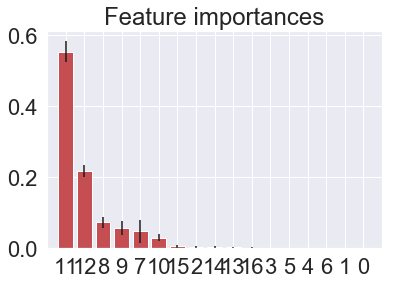

In [265]:
importances = rfr.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfr.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]



# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

TypeError: only integer scalar arrays can be converted to a scalar index

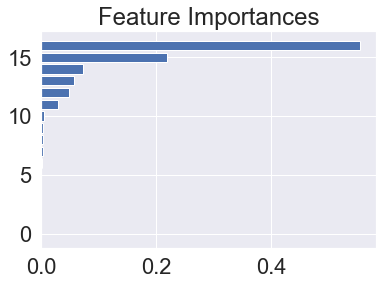

In [262]:
importances = rfr.feature_importances_
indices = np.argsort(importances)

plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [ ]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   mode = 'regression',
                                                   feature_names = X_train.columns,
                                                   categorical_features = [3], 
                                                   categorical_names = ['CHAS'], 
                                                   discretize_continuous = True)
                                                   
np.random.seed(42)
exp = explainer.explain_instance(X_train.values[31], rf.predict, num_features = 5)
exp.show_in_notebook(show_all=False) #only the features used in the explanation are displayed

exp = explainer.explain_instance(X_train.values[85], rf.predict, num_features = 5)
exp.show_in_notebook(show_all=False)

In [ ]:
col = [features4]

#modelname.feature_importance_
y = rfr.fit(X, Y).feature_importances_

#plot
fig, ax = plt.subplots() 
#width = 0.4 # the width of the bars 
ind = np.arange(len(y)) # the x locations for the groups
ax.barh(ind, y, width, color='green')
ax.set_yticks(ind+width/10)
ax.set_yticklabels(col, minor=False)

plt.title('Feature importance in RandomForest Regressor')
plt.xlabel('Relative importance')
plt.ylabel('feature') 
plt.figure(figsize=(5,5))
#fig.set_size_inches(6.5, 4.5, forward=True)

In [ ]:
from treeinterpreter import treeinterpreter as ti

prediction, bias, contributions = ti.predict(estimator, X_test[6:7])
N = 5 # no of entries in plot , 4 ---> features & 1 ---- class label

setosa = []
versicolor = []
virginica = []for j in range(3):
    list_ =  [setosa ,versicolor ,virginica]
        for i in range(4):
           val = contributions[0,i,j]
           list_[j].append(val)setosa.append(prediction[0,0]/5)
versicolor.append(prediction[0,1]/5)
virginica.append(prediction[0,2]/5)fig, ax = plt.subplots()
ind = np.arange(N)   
width = 0.15        
p1 = ax.bar(ind, setosa, width, color='red', bottom=0)
p2 = ax.bar(ind+width, versicolor, width, color='green', bottom=0)
p3 = ax.bar(ind+ (2*width), virginica, width, color='yellow', bottom=0)ax.set_title('Contribution of all feature for a particular \n sample of flower ')
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(col, rotation = 90)
ax.legend((p1[0], p2[0] ,p3[0]), ('setosa', 'versicolor', 'virginica' ) , bbox_to_anchor=(1.04,1), loc="upper left")ax.autoscale_view()
plt.show()

Good start !!! However, I have added my comments where you need to modify your submissions below. I think that your project requires **overall modification on the explanation part**. In the beginning, you have mentioned **7 different latent variable models that you need to elaborate in the appropriate section where you have used it.** You have scored 6.5/10.

Rubrick:
In order to pass student must get 8/10 points.

    First: Go out and find a dataset of interest. It could be from one of our recommended resources, some other aggregation, or scraped yourself. Just make sure it has lots of variables in it, including an outcome of interest to you.
1 Point: Student should be able to find a suitable dataset that includes a target variable for the supervised learning problem.
1/1
    
    Second: Explore the data. Get to know the data. Spend a lot of time going over its quirks and peccadilloes. You should understand how it was gathered, what's in it, and what the variables look like.
4 Points in total: 1 Point: Student should clean the data. 1/1 
1 Point: Student should do data exploration by **investigating the relationships between the potential features and the target variable** as well as the **relationships between the features.**
0.5/1, **Please provide more explanations on the data exploration. Highlight your dropping criteria (e.g. non-numeric value, null value etc)**

2 Points: Student should do feature engineering and select the relevant features for the target variable. 
1/2, **Please provide explanations on the feature engineering. You can summarize your findings at the end of each section while you can explain what you are going to do at the beginning.**

    Third*: Model your outcome of interest. You should try several different approaches and really work to tune a variety of models before using the model evaluation techniques to choose what you consider to be the best performer. Make sure to think about explanatory versus predictive power and experiment with both.
5 Points: 
1 Point: Student should at least try two different models. The difference can be with respect to the different feature sets or the types of the models.
1/1 
2 Points: Student should **tune the hyperparameters of the models.** If the models student uses don’t have hyperparameters, then the 2 points of this rubric can be added to the one above.
1/2 **Please make it precise and concise.**
2 Points: Student should **compare the results of the models and select the best performing one.** Student should justify his/her decision. 
1/2 There are some errors at the end.